In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pynlo
from scipy import constants

Which pulse shape to use?

In [2]:
from dataclasses import dataclass

@dataclass
class NobleGasData:
    name: str
    beta2: float          # [fs^2/(cm bar)]
    beta3: float          # [fs^3/(cm bar)]
    beta4: float          # [fs^4/(cm bar)]
    n2_at_one_bar: float  # [m^2/(W bar)]
    
    def __repr__(self):
        return (f"{self.name}: beta2={self.beta2} fs^2/(cm bar), "
                f"beta3={self.beta3} fs^3/(cm bar), "
                f"beta4={self.beta4} fs^4/(cm bar), "
                f"n2_at_one_bar={self.n2_at_one_bar} m^2/(W bar)")

noble_gases = [
    NobleGasData(name="Neon", beta2=0.0202, beta3=0.0158, beta4=0, n2_at_one_bar=0.14e-23),
    NobleGasData(name="Argon", beta2=0.1980, beta3=0.1586, beta4=0, n2_at_one_bar=1.74e-23),
    NobleGasData(name="Krypton", beta2=0.3996, beta3=0.3298, beta4=0, n2_at_one_bar=4.03e-23),
    NobleGasData(name="Xenon", beta2=0.9113, beta3=0.7836, beta4=0, n2_at_one_bar=11.15e-23),
]

In [3]:
def loadGasParameters(gas_name):
        noble_gases_dict = {gas.name.lower(): gas for gas in noble_gases}
        gas = noble_gases_dict.get(gas_name.lower(), f"Gas not found in noble gas data.")
        n2_at_one_bar = gas.n2_at_one_bar
        beta2 = gas.beta2 * (1e-3)**2 / 1e-5  # [ps^2/(km bar)]
        beta3 = gas.beta3 * (1e-3)**3 / 1e-5  # [ps^3/(km bar)]
        beta4 = gas.beta4 * (1e-3)**4 / 1e-5  # [ps^4/(km bar)]
        betas_at_one_bar = [beta2, beta3, beta4]
        
        return n2_at_one_bar, betas_at_one_bar    

In [4]:
class GasPropertyBuilder:
    
    def __init__(self, fiber_length, fiber_radius, fiber_wavelength, pulse_wavelength, n2_at_one_bar, betas_at_one_bar,  
                 constant_pressure=None, pressure_boundary=None, differential_pumping=False):
        
        assert (constant_pressure is not None) if not differential_pumping else True, \
        "A constant gas pressure is expected for non-differential pumping scheme."
        assert (pressure_boundary is not None) if differential_pumping else True, \
        "A list containing the boundary values of the gas pressure at both input \
        and output surface of the fiber is expected for differential pumping scheme."
        
        self.fiber_len = fiber_length
        self.fiber_rad = fiber_radius
        self.fibWL = fiber_wavelength
        self.pulseWL = pulse_wavelength
        
        if differential_pumping:
            if len(pressure_boundary) != 2:
                print("A list containing the boundary values of the gas pressure at both input \
                and output surface of the fiber is expected for differential pumping scheme.")
            self.pressure_entr = pressure_boundary[0]
            self.pressure_exit = pressure_boundary[1]
        else:
            self.const_pressure = constant_pressure
        
        self.n2_at_one_bar = n2_at_one_bar
        self.betas_at_one_bar = betas_at_one_bar
        self.differential_pumping = differential_pumping
    
    def torrToBar(self, pressure_Torr):
        """
        Unit conversion for gas pressure from torr to bar.
        
        1 torr is defined as exactly 1/760 of a standard atmosphere (1 atm = 101325 Pa), 
        1 pascal is equal to 1e-5 bar.

        Input(s):
        pressure_Torr: gas pressure [Torr]
        Output(s):
        pressure_Bar: gas pressure [Bar]
        """
        
        pressure_Pa = pressure_Torr * (101325/760)
        pressure_Bar = pressure_Pa * 1e-5
        
        return pressure_Bar

    def pressureDistribution(self, z):
        """
        Generate gas pressure distribution along the fiber under differential pumping.

        Reference: 
        Suda, Akira, et al.
        “Generation of Sub-10-Fs, 5-mJ-Optical Pulses Using a Hollow Fiber with a Pressure Gradient.”
        Applied Physics Letters, vol. 86, no. 11, 2005, https://doi.org/10.1063/1.1883706.
        
        Input(s):
        z: position grid along the fiber [m].
        fiber_len: length of the fiber [m].
        pressure_entr: gas pressure at the entrance [Torr].
        pressure_exit: gas pressure at the exit [Torr].
        Output(s):
        pressure_dist: gas pressure distribution along the fiber [Bar].
        """
        
        pressure_entr = self.torrToBar(self.pressure_entr)
        pressure_exit = self.torrToBar(self.pressure_exit)
        pressure_dist = np.sqrt(pressure_entr**2 + (z/self.fiber_len) * (pressure_exit**2 - pressure_entr**2))
        
        return pressure_dist
        
    def dispersionFunction(self, z):
        """
        Generate the fiber dispersion that can vary as a function of the length z along the fiber 
        for differential pumping, return a tuple of beta coefficients as a function of z.
        
        Input(s):
        pressure_dist: gas pressure distribution along the fiber [Bar].
        betas_at_one_bar: a list of beta coefficients (i.e. [beta2, beta3, beta4]) specified at 1 bar [ps^n/km].
        Output(s):
        betas: a tuple of beta coefficients as a function of z [ps^n/m].
        """
        
        betas = []
        pressure_dist = self.pressureDistribution(z)
        for beta in self.betas_at_one_bar:
            betas.append(beta * (1/1e3) * pressure_dist)
        
        return tuple(betas)
    
    def nonlinearIndexN2(self, z=None):
        """
        Calculate the nonlinear refractive index n2, return a constant for non-differential pumping, 
        or a distribution along the fiber for differential pumping.

        Input(s):
        pressure_dist: gas pressure distribution along the fiber under differential pumping [Bar].
        const_pressure: constant gas pressure for non-differential pumping [Bar].
        n2_at_one_bar: nonlinear refractive index of the gas reported at 1 bar [m^2/(W bar)].
        Output(s):
        n2: nonlinear refractive index at the specified pressure [m^2/W].
        """
        
        assert (z is None) if not self.differential_pumping else True, \
        "A position grid is not needed for non-differential pumping."
        assert (z is not None) if self.differential_pumping else True, \
        "A position grid is needed for differential pumping."
        
        if self.differential_pumping:
            pressure_dist = self.pressureDistribution(z)
            n2 = pressure_dist * self.n2_at_one_bar
        else:
            const_pressure = self.torrToBar(self.const_pressure)
            n2 = const_pressure * self.n2_at_one_bar
        
        return n2
        
    def gammaDistribution(self, z=None):
        """
        Calculate the nonlinear parameter Gamma using Gamma=(n2*w0)/(c*A_eff), return a constant 
        for non-differential pumping, or a distribution along the fiber for differential pumping. 
        Reference: Agrawal, Govind. Nonlinear Fiber Optics. Sixth edition., Academic Press, 2019.
        
        c: speed of light in vacuum [m/s].
        w0: angular frequency [rad/s].
        A_eff: effective core area of the fiber [m^2].

        Input(s):
        n2: nonlinear refractive index at the specified pressure [m^2/W].
        pulseWL: pulse central wavelength [nm].
        fiber_rad: radius of fiber [m].
        Output(s):
        Gamma: nonlinear parameter [1/(W m)]
        """
        
        assert (z is None) if not self.differential_pumping else True, \
        "A position grid is not needed for non-differential pumping."
        assert (z is not None) if self.differential_pumping else True, \
        "A position grid is needed for differential pumping."
        
        w0 = (2*np.pi*constants.c) / (self.pulseWL*1e-9)
        A_eff = np.pi * self.fiber_rad**2
        n2 = self.nonlinearIndexN2(z)
        Gamma = (n2*w0) / (constants.c*A_eff)
        
        return Gamma

In [5]:
def photonEnergyGrid(pulse):
    """
    Convert the grid corresponding to the complex electric field in frequency
    domain from angular frequency to photon energy in eV.
    
    Photon energy:
    E[J] = hbar*w = (h*w)/(2pi) = hv
    E[eV] = E[J]/e
    
    Input(s):
    pulse: a pulse instance on which the conversion is performed.
    Output(s):
    W_eV: photon energy grid [eV].
    """
    
    W_eV = constants.h * (pulse.W_mks / (2*np.pi)) / constants.e
    
    return W_eV

In [6]:
def spectralPowerDensity(intensity_dB, reference_pulse, fiber_radius):
    """
    Derive the spectral power density for the output pulse from its intensity data.
    
    Input(s):
    intensity_dB: a 2D numpy array corresponding to the intensities in decibels in each frequency bin 
                  for each step in the z-direction of the fiber, it has a shape of (steps, grid size).
    reference_pulse: a pulse instance on which the reference intensity calculation is based.
    Output(s):
    spectral_power_density: spectral power density for the output pulse [W/eV].
    """
    
    A_eff = np.pi * fiber_radius**2  # effective area of fiber [m^2]
    
    # calculate the average power of the reference pulse based on its repetition rate
    # and energy per pulse
    P_ref = pulse.calc_epp() * pulse.frep_mks  # average power [W]
    I_ref = P_ref / A_eff  # reference intensity [W/m^2]
    
    I = I_ref * 10**(intensity_dB/10)  # output pulse intensity [W/m^2]
    spectral_power_density = I * A_eff  # [W]
    
    return spectral_power_density

In [49]:
def calculateOutputFrequencyLimit(frequency_limit, simulation_window, simulation_points):
    """
    Calculate the upper limit on the output frequency of the output pulse.
    
    Inputs:
    simulation_window: total time window of the simulation in picoseconds [ps]
    simulation_points: number of steps the simulation takes as the pulse propagates through the fiber
    
    Outputs:
    output_frequency_limit: upper limit on the frequency of the output pulse in THz [THz]
    """
    
    if frequency_limit is None:
        frequency_limit = 0.5 * simulation_points / simulation_window
        
    if simulation_points is None:
        simulation_points = 2 * simulation_window * frequency_limit
    if simulation_window is None:
        simulation_window = 0.5 * simulation_points / frequency_limit
    
    return frequency_limit, simulation_window, simulation_points


In [50]:
# Planck's constant in eV/Hz
h_ev_hz = constants.physical_constants['Planck constant in eV/Hz'][0]

$\eta_{SHG} = \frac{E_{2\omega}}{E_\omega} = 0.2$ leads to $5E_{2\omega} = E_\omega$

$E_\omega + E_{2\omega} = E_{\omega}^{(0)}$ gives $\frac{6}{5}E_\omega = E_{\omega}^{(0)}$

Hence, we obtain $E_\omega = \frac{5}{6} E_{\omega}^{(0)}$ and $E_{2\omega} = \frac{1}{6} E_{\omega}^{(0)}$

More generally, $ E_{2\omega} = \eta_{SHG} E_\omega $

$(1+\eta_{SHG}) E_\omega = E_{\omega}^{(0)}$

$E_\omega = \frac{1}{1+\eta_{SHG}} E_{\omega}^{(0)}$

$E_{2\omega} = \frac{\eta_{SHG}}{1+\eta_{SHG}} E_{\omega}^{(0)}$

In [67]:
def allocateEPP(SHG_efficiency, EPP_input):
    
    EPP_FD = EPP_input / (1 + SHG_efficiency)
    EPP_SH = SHG_efficiency * EPP_FD
    
    return EPP_FD, EPP_SH

In [68]:
class PeakIntensityMaintainer:
    
    def __init__(self, pulse_duration, energy_per_pulse=None, fiber_radius=None, peak_intensity=None):
        
        assert sum(argument is None for argument in [energy_per_pulse, fiber_radius, peak_intensity]) == 1, \
        "Only one variable in [energy_per_pulse, fiber_radius, peak_intensity] is expected to be unknown."
        
        self.FWHM = pulse_duration # [s]
        self.EPP = energy_per_pulse # [J]
        self.fiber_rad = fiber_radius # [m]
        self.peak_intensity = peak_intensity # [W/cm^2]
    
    def toMKS(self, intensity_CGS):
        """
        Unit conversion for optical intensity from W/cm^2 to W/m^2.
        
        Input(s):
        intensity_CGS: intensity [W/cm^2]
        Output(s):
        intensity_MKS: intensity [W/m^2]
        """
        
        intensity_MKS = intensity_CGS / (1e-2)**2
        return intensity_MKS
    
    def toCGS(self, intensity_MKS):
        """
        Unit conversion for optical intensity from W/m^2 to W/cm^2.
        
        Input(s):
        intensity_MKS: intensity [W/m^2]
        Output(s):
        intensity_CGS: intensity [W/cm^2]
        """
        
        intensity_CGS = intensity_MKS / (1e2)**2
        return intensity_CGS
    
    def calcPeakIntensity(self):
        """
        
        """
        
        peak_intensity = self.EPP / (self.FWHM * np.pi * self.fiber_rad**2)
        
        return self.toCGS(peak_intensity)
    
    def calcFiberRadius(self):
        """
        
        """
        
        fiber_radius = np.sqrt( self.EPP / (self.FWHM * np.pi * self.toMKS(self.peak_intensity)) )
        
        return fiber_radius
    
    def calcEPP(self):
        """
        
        """
        EPP = self.toMKS(self.peak_intensity) * self.FWHM * np.pi * self.fiber_rad**2
    
        return EPP
    

In [69]:
def intensityPropertyBuilder(pulse_duration, target_intensity=None, fiber_radius=None, EPP=None):
    """
    pulse_duration [ps]
    target_intensity [W/cm^2]
    fiber_radius [m]
    energy_per_pulse [J]
    """
    
    assert sum(argument is None for argument in [target_intensity, fiber_radius, EPP]) == 1, \
    "Only one variable in (target_intensity, fiber_radius, energy_per_pulse) is expected to be unknown."
    
    if target_intensity is None:
        A_eff = np.pi * (fiber_radius * 1e2)**2
        target_intensity = EPP / (pulse_duration * 1e-12 * A_eff)
    elif fiber_radius is None:
        fiber_radius = np.sqrt(EPP / (target_intensity * 1e4 * pulse_duration * 1e-12 * np.pi))
    elif EPP is None:
        A_eff = np.pi * (fiber_radius * 1e2)**2
        EPP = target_intensity * pulse_duration * 1e-12 * A_eff

    return target_intensity, fiber_radius, EPP

In [70]:
# pulse parameters
FWHM = 0.03           # pulse duration [ps]
pulseWL = 800         # pulse central wavelength [nm]
SHG_efficiency = 0.2  # conversion efficiency

# input pulse energy [J], max possible value is 1mJ at 800nm
EPP_input = np.array([1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3])

# energy per pulse for fundamental and second harmonic pulse [J]
EPP_FD, EPP_SH = allocateEPP(SHG_efficiency, EPP_input)

GDD = 0.0  # Group delay dispersion [ps^2]
TOD = 0.0  # Third order dispersion [ps^3]

peak_intensity = 2e12  # target intensity for nonlinear processes [W/cm^2]

# fibre parameters
Length = 100        # fiber length [mm]
Alpha = 0.0         # attentuation coefficient [dB/cm]
fibWL = 800         # center wavelength of fiber [nm]

alpha = np.log((10**(Alpha * 0.1))) * 100  # convert from dB/cm to 1/m

intensitymaintainer = PeakIntensityMaintainer(pulse_duration=FWHM*1e-12, 
                                               energy_per_pulse=EPP_SH, 
                                               peak_intensity=peak_intensity, 
                                               fiber_radius=None)
fiber_rad = intensitymaintainer.calcFiberRadius()

gases = ["Neon", "Argon", "Krypton", "Xenon"]
# n2_at_one_bar, betas_at_one_bar = loadGasParameters('Xenon')

# gas pressure at the entrance [Torr]
pressure_at_entrance = np.arange(500, 4500, 500)

# simulation parameters
Window = 5        # simulation window [ps]
Steps = 100       # simulation steps
Points = 45000    # simulation points
Raman = True      # Enable Raman effect?
Steep = True      # Enable self steepening?


In [71]:
n2_at_one_bar, betas_at_one_bar = loadGasParameters('Xenon')
print(n2_at_one_bar)
print(betas_at_one_bar)

1.115e-22
[0.09112999999999999, 7.835999999999999e-05, 0.0]


In [72]:
print(fiber_rad)

[2.97354019e-07 9.40315973e-07 2.97354019e-06 9.40315973e-06
 2.97354019e-05 9.40315973e-05 2.97354019e-04]


In [73]:
def calculateOutputFrequencyLimit(simulation_window, simulation_points):
    """
    Calculate the upper limit on the output frequency of the output pulse.
    
    Inputs:
    simulation_window: total time window of the simulation in picoseconds [ps]
    simulation_points: number of steps the simulation takes as the pulse propagates through the fiber
    
    Outputs:
    output_frequency_limit: upper limit on the frequency of the output pulse in THz [THz]
    """
    
    time_step = simulation_window / simulation_points
    sampling_rate = 1 / time_step
    output_frequency_limit = 0.5 * sampling_rate
    
    return output_frequency_limit

In [74]:
print(calculateOutputFrequencyLimit(Window, Points))


4500.0


In [75]:
for combination in range(len(EPP_input)):
    print(f"For combination No.{combination+1}:\n\
    \tinput pulse energy is {EPP_input[combination]*1e3:.6f} mJ,\n\
    \tfiber radius is {fiber_rad[combination]*1e6:.3f} microns,\n\
    \tEPP for fundamental wavelength is {EPP_FD[combination]*1e6:.5f} microJ,\n\
    \tEPP for second harmonic is {EPP_SH[combination]*1e6:.5f} microJ.\n")
    

For combination No.1:
    	input pulse energy is 0.000001 mJ,
    	fiber radius is 0.297 microns,
    	EPP for fundamental wavelength is 0.00083 microJ,
    	EPP for second harmonic is 0.00017 microJ.

For combination No.2:
    	input pulse energy is 0.000010 mJ,
    	fiber radius is 0.940 microns,
    	EPP for fundamental wavelength is 0.00833 microJ,
    	EPP for second harmonic is 0.00167 microJ.

For combination No.3:
    	input pulse energy is 0.000100 mJ,
    	fiber radius is 2.974 microns,
    	EPP for fundamental wavelength is 0.08333 microJ,
    	EPP for second harmonic is 0.01667 microJ.

For combination No.4:
    	input pulse energy is 0.001000 mJ,
    	fiber radius is 9.403 microns,
    	EPP for fundamental wavelength is 0.83333 microJ,
    	EPP for second harmonic is 0.16667 microJ.

For combination No.5:
    	input pulse energy is 0.010000 mJ,
    	fiber radius is 29.735 microns,
    	EPP for fundamental wavelength is 8.33333 microJ,
    	EPP for second harmonic is 1.6666

In [76]:
photon_energy = (constants.h * constants.c) / (pulseWL * 1e-9 * constants.e)
print(photon_energy)

1.549802480415003


In [77]:
def dB(num):
        return 10 * np.log10(np.abs(num)**2)

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943539356831315 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9943556987715474 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9943576745498024 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9943598579249491 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9943622436574528 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9943648263776229 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.994367600602051 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9943705607499059 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9943737011589178 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9943770161009365 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9943804997969503 nJ
Step: 11 Distance

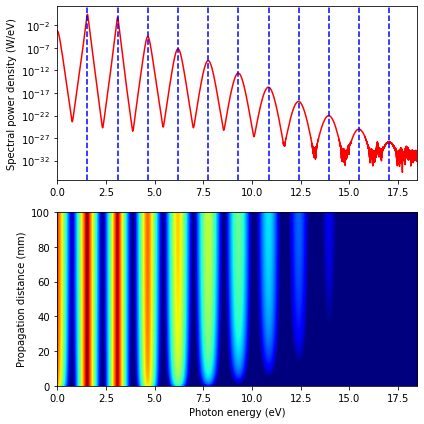

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943539356831312 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.94355698771547 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.943576745498012 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.943598579249482 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.943622436574518 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.943648263776218 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.943676006020501 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.943705607499052 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.943737011589167 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.943770161009356 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.943804997969492 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


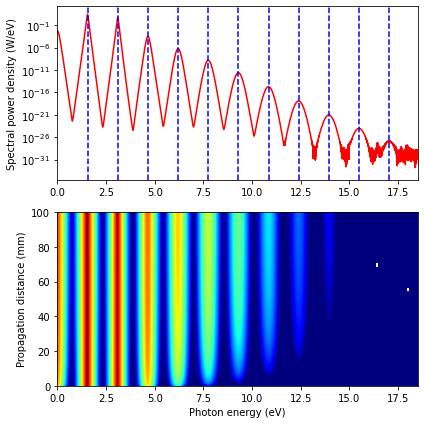

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43539356831319 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.43556987715478 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.43576745498025 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.4359857924949 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.4362243657453 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.43648263776227 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.4367600602051 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.43705607499061 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.43737011589177 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.43770161009365 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.43804997969501 nJ
Step: 11 Distanc

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


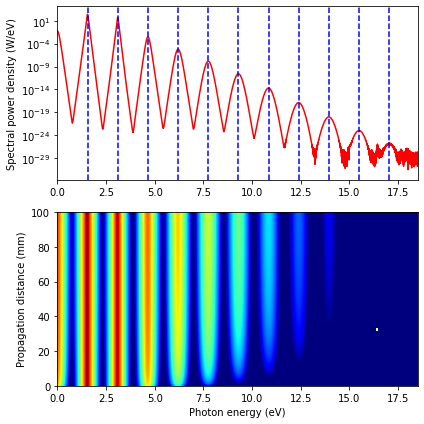

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3539356831319 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.3556987715475 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.3576745498025 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.3598579249491 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.362243657453 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.3648263776224 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.3676006020509 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.3705607499057 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.3737011589177 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.3770161009367 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.3804997969501 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


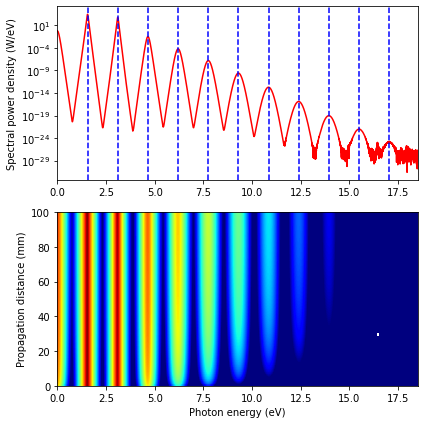

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.53935683132 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9943.556987715476 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9943.576745498023 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9943.598579249492 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9943.622436574527 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9943.648263776224 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9943.67600602051 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9943.70560749906 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9943.737011589179 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9943.770161009366 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9943.804997969502 nJ
Step: 11 Distance remaini

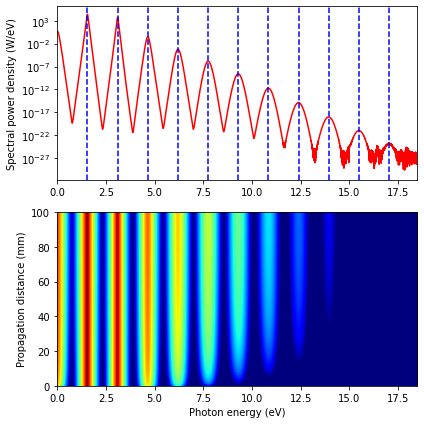

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99435.39356831323 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99435.56987715479 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99435.76745498025 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99435.98579249496 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99436.22436574535 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99436.4826377623 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99436.76006020514 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99437.05607499064 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99437.37011589183 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99437.70161009372 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99438.04997969508 nJ
Step: 11 Dis

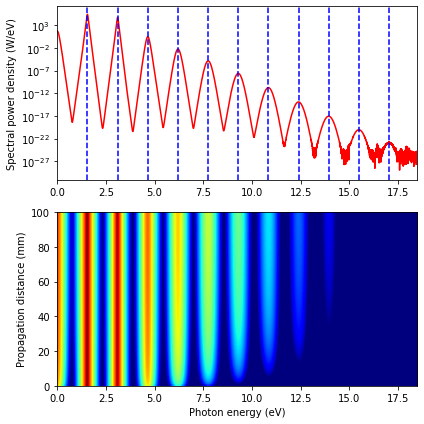

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994353.935683132 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994355.6987715468 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994357.6745498019 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994359.8579249486 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994362.2436574524 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994364.8263776217 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994367.6006020504 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994370.5607499051 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994373.7011589167 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994377.0161009358 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994380.4997969493 nJ
Step: 11 Distance rema

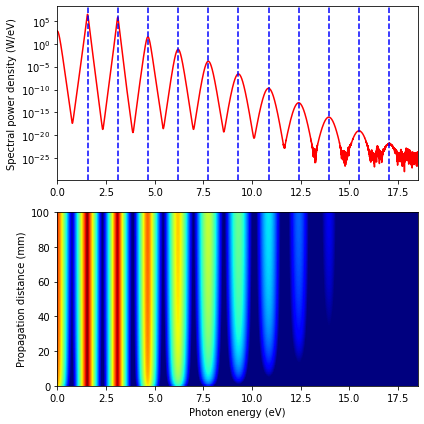

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943557082203207 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9943599048542743 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9943649522224786 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9943708198446417 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9943774750648195 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9943848834712358 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9943930093092489 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9944018158747039 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9944112658784963 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9944213217765363 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9944319460621756 nJ
Step: 11 Distanc

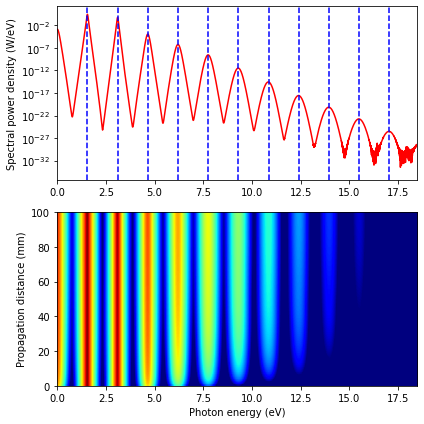

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.94355708220321 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.943599048542742 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.943649522224785 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.943708198446418 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.943774750648195 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.943848834712357 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.943930093092485 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.944018158747037 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.944112658784961 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.94421321776536 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.944319460621754 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


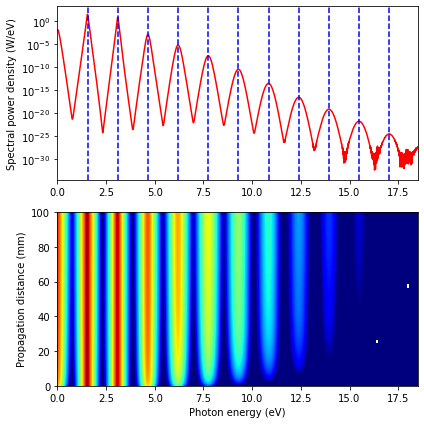

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43557082203215 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.43599048542744 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.43649522224791 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.43708198446423 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.437747506482 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.43848834712364 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.43930093092493 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.44018158747043 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.44112658784965 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.44213217765369 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.4431946062176 nJ
Step: 11 Distanc

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


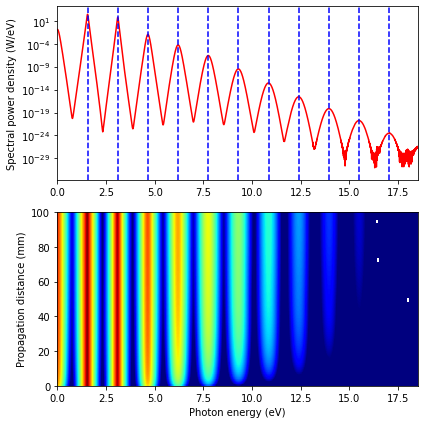

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3557082203209 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.3599048542739 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.3649522224788 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.3708198446415 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.3774750648195 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.3848834712356 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.3930093092487 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.4018158747037 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.411265878496 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.4213217765364 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.4319460621756 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


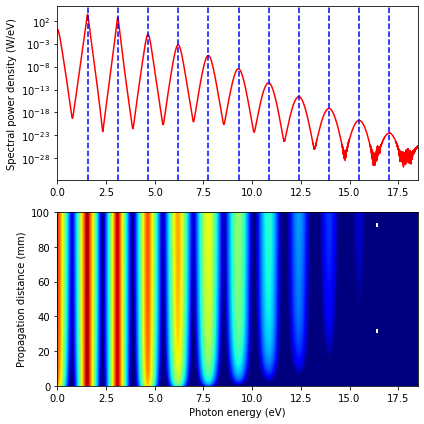

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.557082203215 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9943.599048542746 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9943.649522224792 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9943.708198446422 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9943.7747506482 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9943.848834712362 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9943.930093092493 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9944.018158747043 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9944.112658784967 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9944.21321776537 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9944.319460621762 nJ
Step: 11 Distance remaini

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


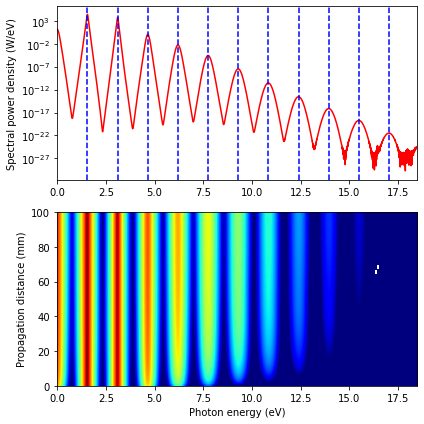

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99435.57082203211 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99435.99048542744 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99436.49522224786 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99437.08198446417 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99437.74750648196 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99438.48834712357 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99439.30093092484 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99440.18158747033 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99441.12658784956 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99442.13217765359 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99443.1946062175 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


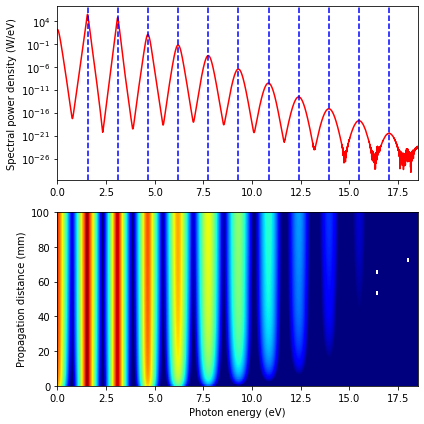

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994355.7082203209 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994359.9048542742 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994364.9522224786 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994370.8198446418 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994377.4750648196 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994384.8834712356 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994393.0093092483 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994401.8158747037 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994411.2658784959 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994421.3217765361 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994431.9460621754 nJ
Step: 11 Distance rem

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


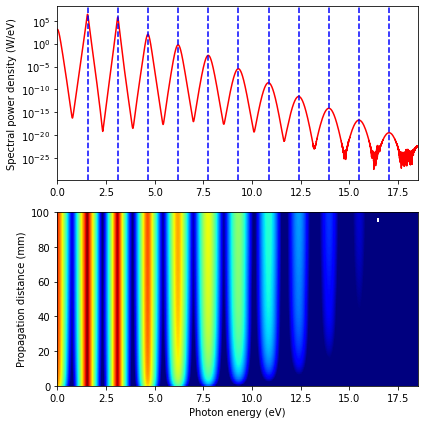

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943577063121664 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9943649939845813 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9943741670561642 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9943851272145137 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.994397766941511 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9944119723970586 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9944276260702477 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9944446090908108 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.994462803159047 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.994482092100699 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9945023630847968 nJ
Step: 11 Distance r

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


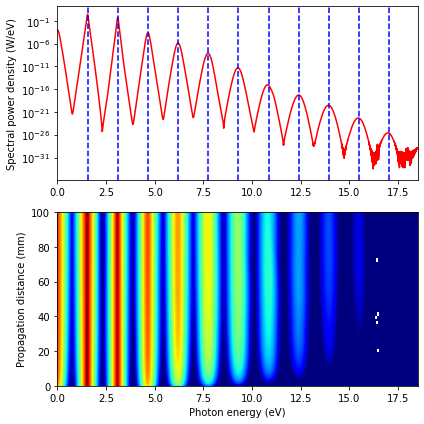

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943577063121664 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.943649939845809 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.943741670561643 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.943851272145134 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.943977669415107 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.944119723970585 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.944276260702482 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.944446090908112 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.944628031590469 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.944820921006984 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.945023630847968 nJ
Step: 11 Di

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


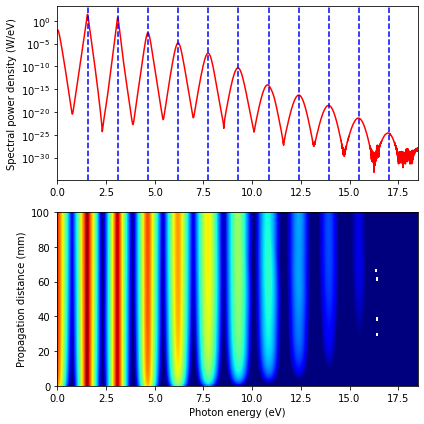

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43577063121664 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.4364993984581 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.43741670561643 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.43851272145132 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.43977669415104 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.44119723970583 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.44276260702476 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.44446090908109 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.44628031590472 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.44820921006985 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.45023630847969 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


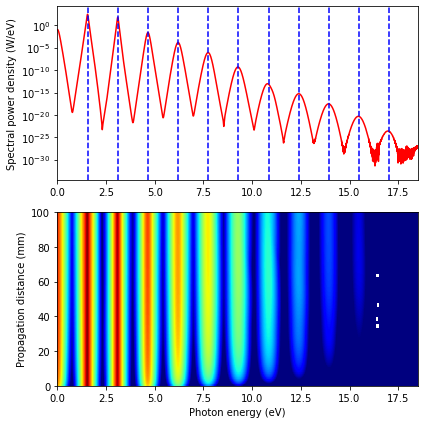

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3577063121667 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.3649939845812 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.3741670561648 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.385127214514 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.3977669415111 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.4119723970588 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.427626070248 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.4446090908116 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.4628031590477 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.4820921006991 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.5023630847973 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


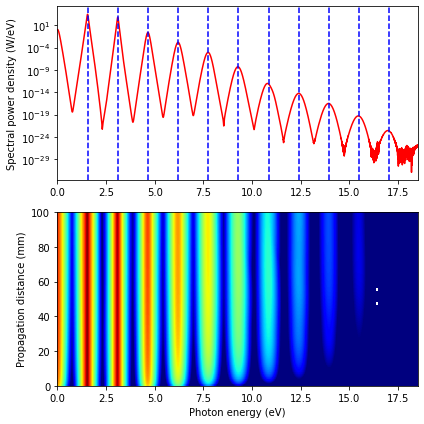

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.577063121667 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9943.649939845813 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9943.741670561642 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9943.851272145135 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9943.977669415111 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9944.119723970587 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9944.276260702482 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9944.446090908114 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9944.628031590475 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9944.82092100699 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9945.023630847973 nJ
Step: 11 Distance remai

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


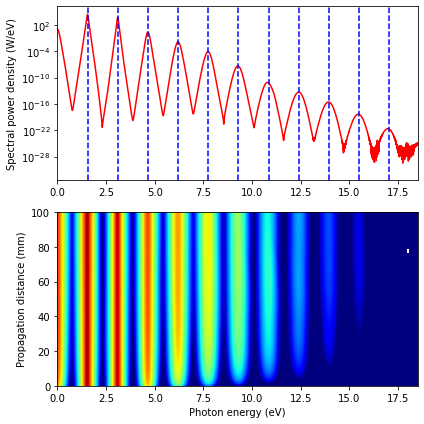

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99435.77063121667 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99436.49939845812 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99437.41670561647 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99438.51272145138 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99439.77669415109 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99441.19723970587 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99442.76260702481 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99444.46090908114 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99446.28031590473 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99448.20921006991 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99450.23630847973 nJ
Step: 11 Di

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


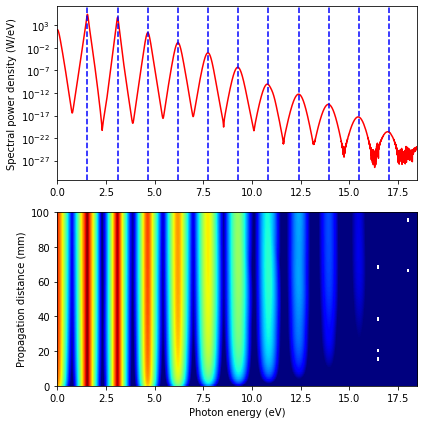

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994357.7063121665 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994364.9939845809 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994374.1670561641 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994385.1272145133 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994397.7669415107 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994411.9723970586 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994427.626070248 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994444.6090908109 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994462.803159047 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994482.0921006989 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994502.363084797 nJ
Step: 11 Distance remain

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


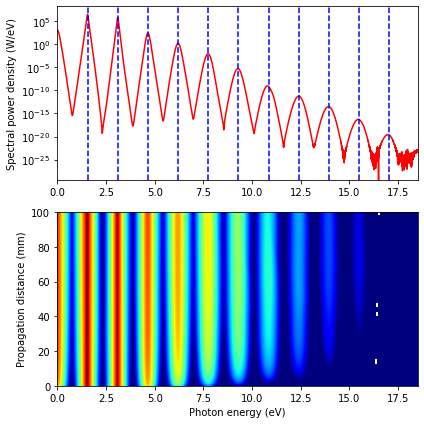

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943599282338451 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.994370948581054 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.994385248736498 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9944025919027829 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9944227187919032 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9944453584259235 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9944702371525964 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9944970856696732 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9945256442329844 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9945556663206705 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9945869208134724 nJ
Step: 11 Distance 

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


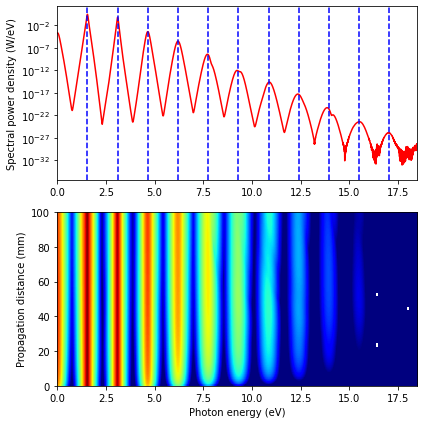

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943599282338447 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.943709485810535 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.943852487364978 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.944025919027828 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.944227187919028 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.944453584259232 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.94470237152596 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.944970856696733 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.945256442329839 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.9455566632067 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.945869208134715 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


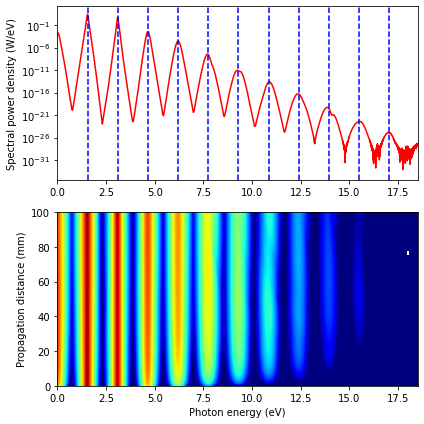

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43599282338451 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.43709485810538 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.4385248736498 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.4402591902783 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.44227187919027 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.44453584259234 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.44702371525962 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.4497085669673 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.4525644232984 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.45556663206702 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.45869208134721 nJ
Step: 11 Distance

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


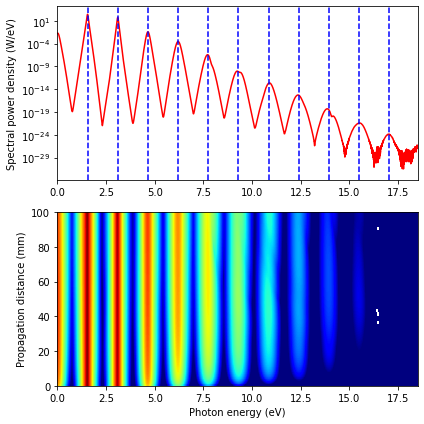

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3599282338452 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.3709485810539 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.3852487364979 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.4025919027829 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.4227187919028 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.4453584259232 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.4702371525958 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.497085669673 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.5256442329841 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.5556663206701 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.586920813472 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


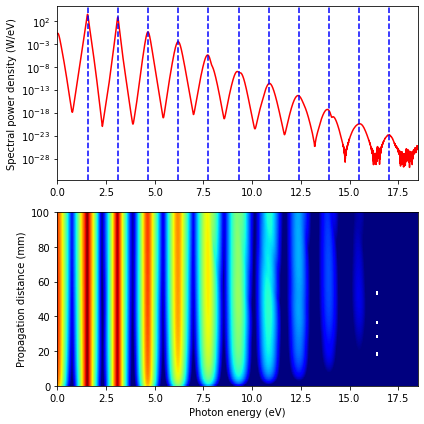

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.599282338444 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9943.709485810536 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9943.852487364977 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9944.025919027828 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9944.227187919027 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9944.453584259234 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9944.70237152596 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9944.970856696731 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9945.256442329839 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9945.556663206698 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9945.869208134718 nJ
Step: 11 Distance remai

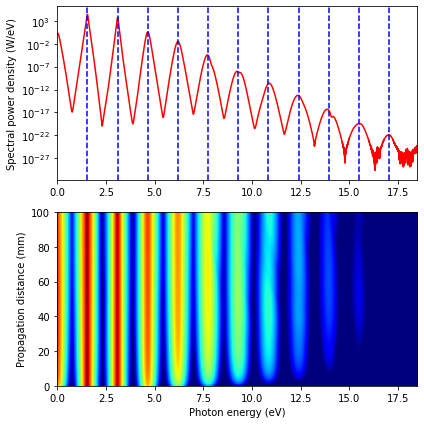

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99435.99282338447 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99437.09485810537 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99438.52487364982 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99440.2591902783 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99442.27187919033 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99444.53584259238 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99447.02371525967 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99449.70856696738 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99452.56442329849 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99455.56663206709 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99458.69208134728 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


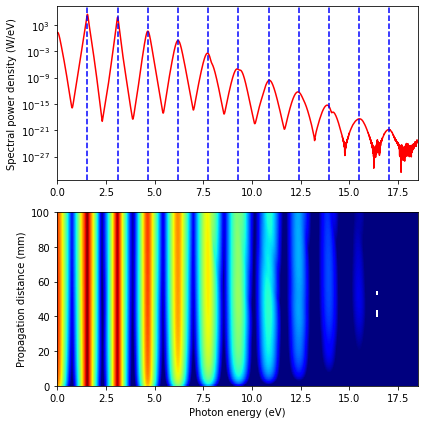

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994359.9282338448 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994370.9485810539 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994385.248736498 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994402.5919027826 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994422.718791903 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994445.3584259233 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994470.2371525965 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994497.0856696729 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994525.644232984 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994555.6663206704 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994586.9208134719 nJ
Step: 11 Distance remain

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


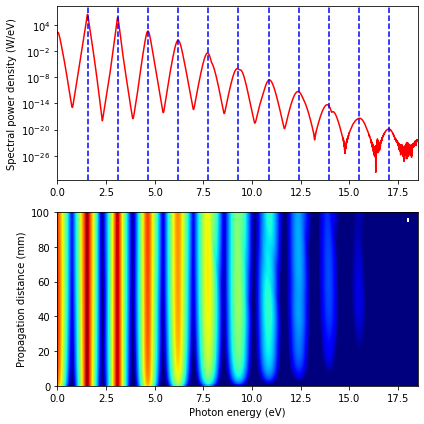

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943623720565986 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9943777482364252 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9943981151634984 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.994422996615104 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9944518775040918 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9944842321400125 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9945195453683978 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9945573271989673 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9945971216239569 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9946385089111842 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9946811005044046 nJ
Step: 11 Distance

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


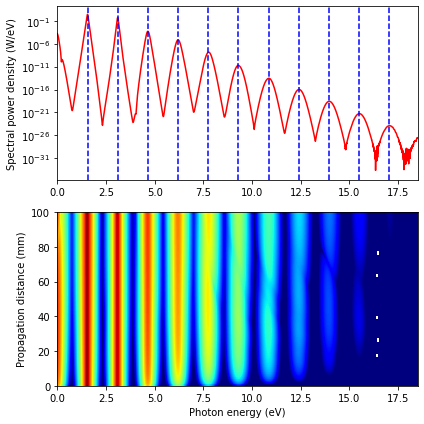

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943623720565983 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.943777482364254 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.943981151634985 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.944229966151044 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.944518775040924 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.944842321400131 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.945195453683986 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.94557327198968 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.945971216239576 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.946385089111851 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.946811005044054 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


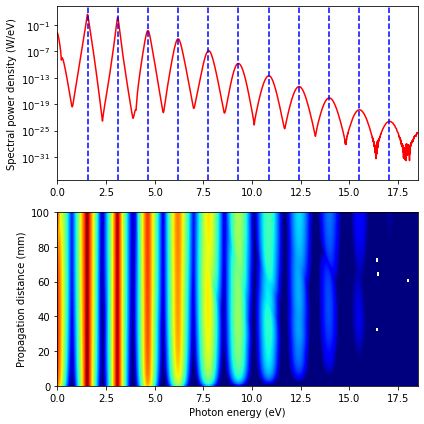

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43623720565981 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.43777482364257 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.4398115163499 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.44229966151048 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.44518775040927 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.44842321400132 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.45195453683985 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.4557327198968 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.45971216239575 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.46385089111851 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.46811005044054 nJ
Step: 11 Distan

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


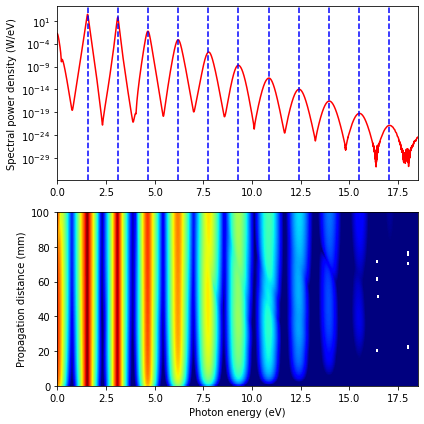

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3623720565979 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.3777482364252 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.3981151634983 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.422996615104 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.4518775040924 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.4842321400126 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.5195453683982 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.5573271989679 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.5971216239573 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.6385089111848 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.681100504405 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


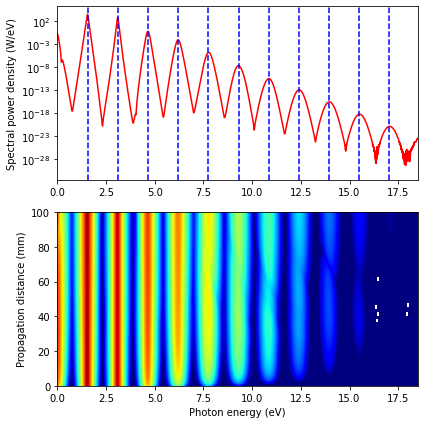

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.623720565978 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9943.777482364252 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9943.981151634984 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9944.22996615104 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9944.51877504092 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9944.842321400127 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9945.195453683978 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9945.573271989675 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9945.971216239572 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9946.385089111845 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9946.811005044048 nJ
Step: 11 Distance remain

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


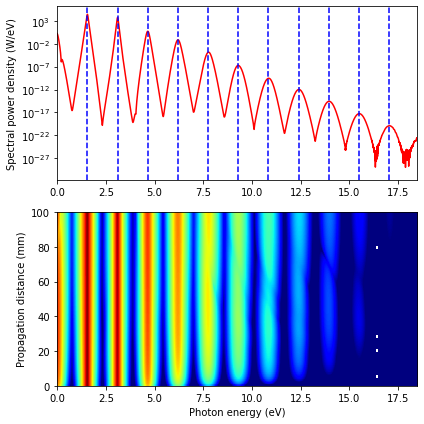

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99436.23720565984 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99437.77482364255 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99439.81151634986 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99442.29966151039 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99445.18775040923 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99448.42321400125 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99451.95453683978 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99455.73271989674 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99459.71216239568 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99463.85089111845 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99468.11005044047 nJ
Step: 11 Di

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


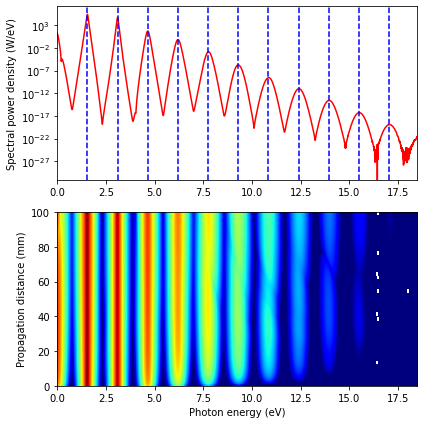

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994362.3720565983 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994377.7482364256 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994398.1151634988 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994422.9966151043 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994451.8775040925 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994484.2321400127 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994519.5453683983 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994557.3271989677 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994597.1216239573 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994638.5089111849 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994681.100504405 nJ
Step: 11 Distance rema

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


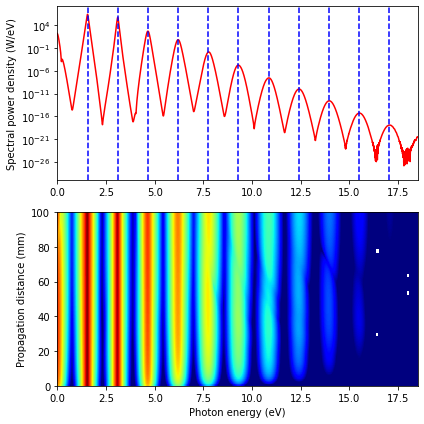

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943650356554551 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9943853700291532 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.994412674948034 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9944461048867831 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9944847644155428 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9945277666480608 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9945742721433313 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9946235098652113 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9946747773698205 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9947274197258696 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9947807984514956 nJ
Step: 11 Distance

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


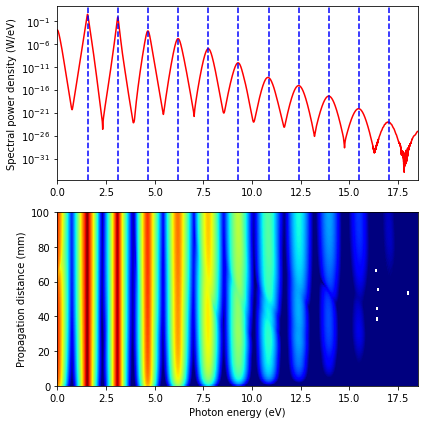

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943650356554551 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.94385370029153 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.944126749480342 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.944461048867833 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.944847644155427 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.945277666480608 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.945742721433312 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.946235098652112 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.9467477736982 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.947274197258695 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.947807984514952 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


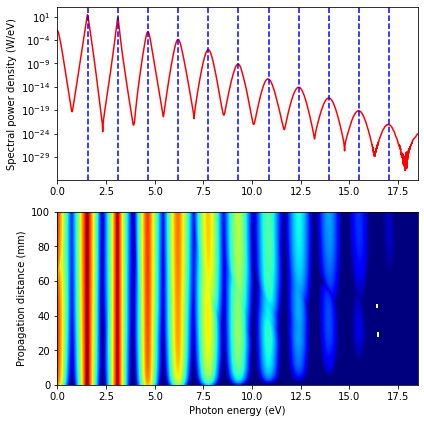

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43650356554552 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.43853700291527 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.44126749480336 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.4446104886783 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.44847644155423 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.45277666480604 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.45742721433308 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.4623509865211 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.467477736982 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.47274197258695 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.47807984514952 nJ
Step: 11 Distance

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


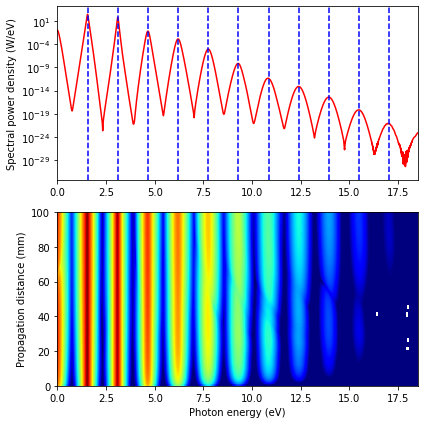

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3650356554549 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.3853700291526 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.4126749480331 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.4461048867827 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.4847644155423 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.5277666480604 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.5742721433307 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.6235098652107 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.6747773698199 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.7274197258691 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.780798451495 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


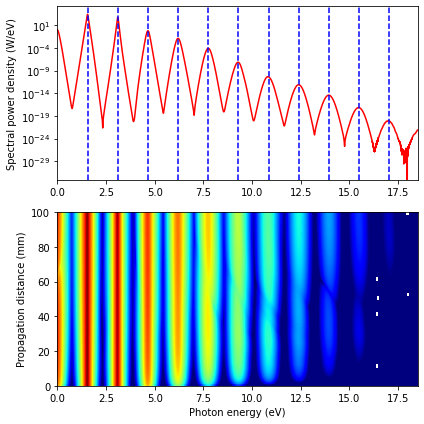

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.65035655455 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9943.853700291525 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9944.126749480336 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9944.461048867828 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9944.847644155423 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9945.277666480602 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9945.74272143331 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9946.235098652107 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9946.7477736982 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9947.274197258692 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9947.807984514948 nJ
Step: 11 Distance remainin

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


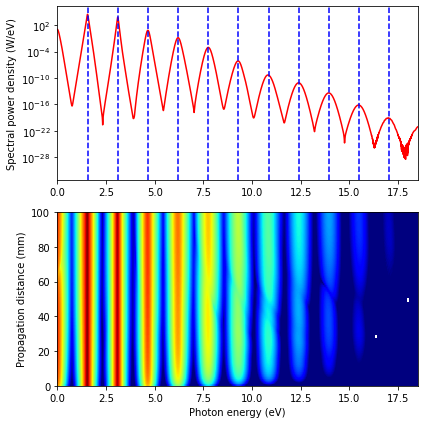

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99436.5035655455 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99438.53700291525 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99441.26749480334 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99444.61048867829 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99448.47644155423 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99452.77666480602 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99457.4272143331 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99462.3509865211 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99467.47773698201 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99472.74197258695 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99478.07984514952 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


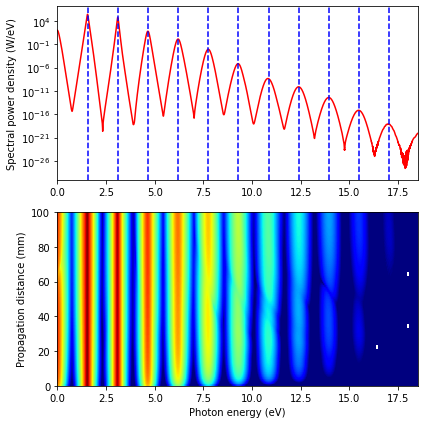

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994365.0356554554 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994385.3700291533 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994412.674948034 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994446.104886783 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994484.7644155425 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994527.7666480606 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994574.2721433316 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994623.5098652111 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994674.77736982 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994727.4197258697 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994780.7984514952 nJ
Step: 11 Distance remaini

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


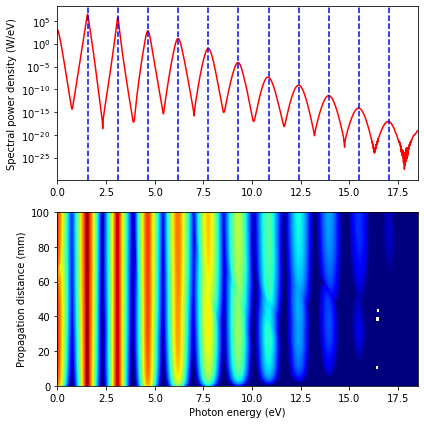

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943679167177405 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9943937888541262 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9944288298552753 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9944716699271162 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9945208968507092 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9945751584735288 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9946332187243516 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9946939618610028 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.994756344445407 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9948193306007284 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9948818638650024 nJ
Step: 11 Distance

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


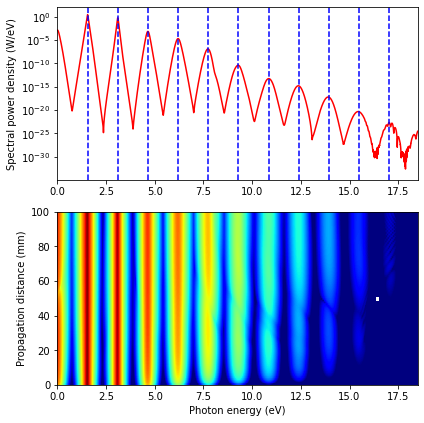

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943679167177407 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.94393788854127 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.944288298552756 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.944716699271169 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.945208968507096 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.945751584735296 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.946332187243526 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.946939618610038 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.947563444454081 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.948193306007292 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.948818638650033 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


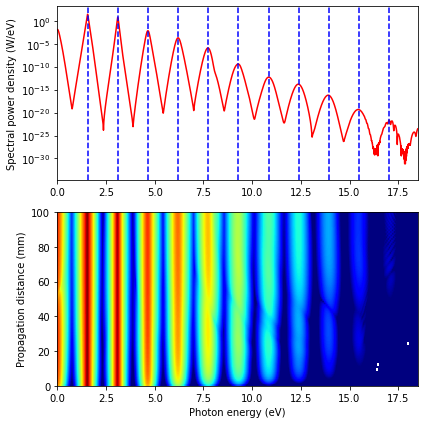

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43679167177405 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.43937888541265 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.44288298552756 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.44716699271163 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.45208968507093 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.45751584735291 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.4633218724352 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.46939618610034 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.47563444454074 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.48193306007286 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.48818638650029 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


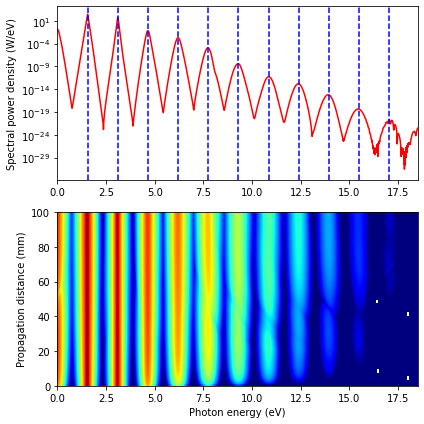

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3679167177404 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.3937888541265 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.4288298552755 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.471669927117 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.5208968507095 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.575158473529 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.6332187243521 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.693961861003 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.756344445407 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.8193306007284 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.8818638650027 nJ
Step: 11 Distanc

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


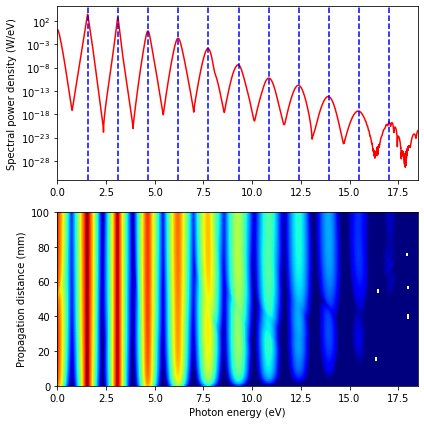

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.679167177406 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9943.937888541268 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9944.288298552752 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9944.716699271166 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9945.208968507093 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9945.751584735292 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9946.332187243519 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9946.939618610035 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9947.563444454076 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9948.193306007288 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9948.818638650027 nJ
Step: 11 Distance rema

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


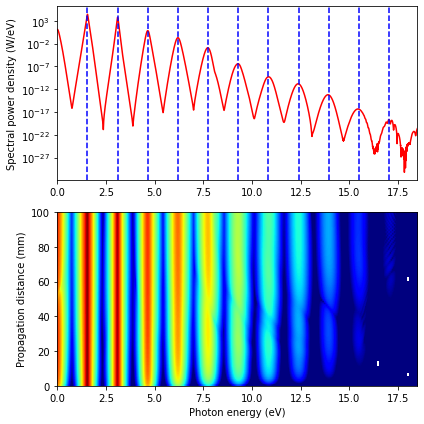

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99436.79167177403 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99439.37888541265 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99442.88298552754 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99447.16699271167 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99452.08968507094 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99457.5158473529 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99463.3218724352 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99469.39618610035 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99475.63444454079 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99481.93306007287 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99488.1863865003 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


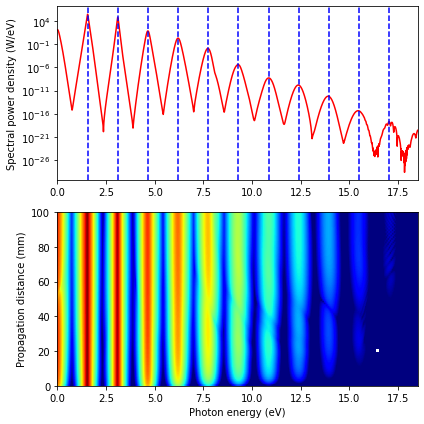

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994367.9167177409 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994393.7888541268 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994428.8298552759 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994471.6699271171 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994520.8968507096 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994575.1584735294 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994633.218724352 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994693.9618610034 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994756.3444454076 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994819.3306007287 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994881.8638650031 nJ
Step: 11 Distance rema

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


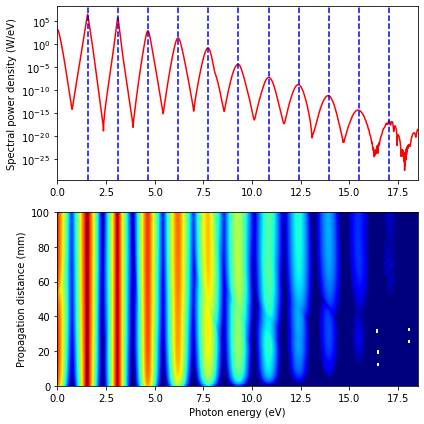

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.994371012752256 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9944029777589398 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9944464770599626 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9944994419335148 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9945598041298809 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9946256518945178 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9946952761315312 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.994767097252799 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9948395425709492 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9949110039932171 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9949799346180033 nJ
Step: 11 Distance 

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


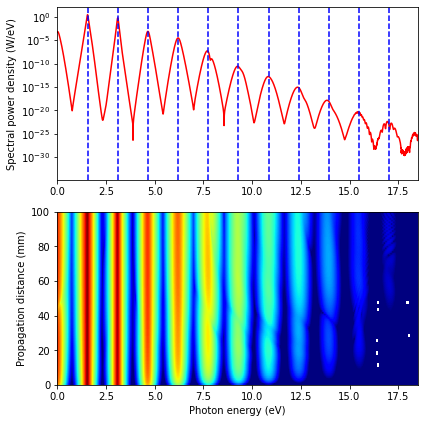

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943710127522559 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.944029777589394 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.944464770599625 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.944994419335144 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.945598041298808 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.946256518945171 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.94695276131531 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.94767097252799 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.94839542570949 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.949110039932169 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.94979934618003 nJ
Step: 11 Distan

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


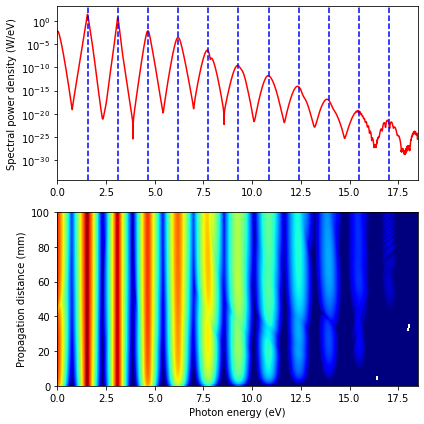

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.4371012752256 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.44029777589395 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.44464770599629 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.44994419335148 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.45598041298811 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.46256518945175 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.46952761315315 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.47670972527992 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.48395425709494 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.49110039932177 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.49799346180035 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


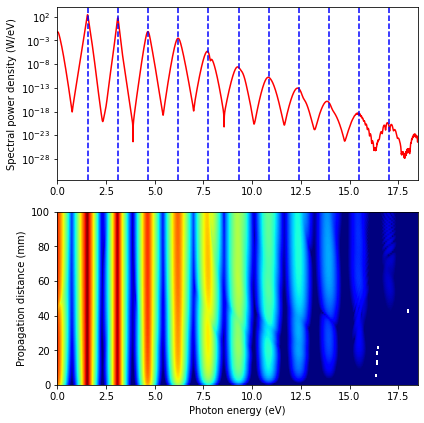

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3710127522561 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.4029777589396 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.4464770599624 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.499441933515 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.5598041298812 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.6256518945178 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.6952761315315 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.7670972527993 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.8395425709492 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.9110039932175 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.9799346180035 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


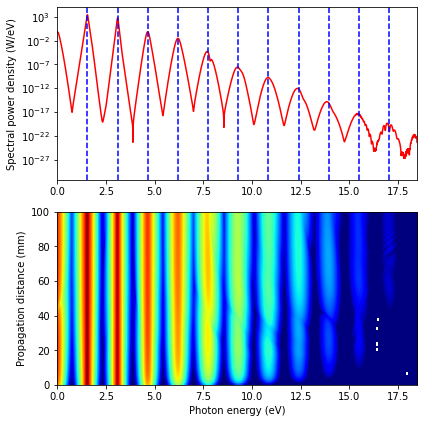

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.710127522558 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9944.029777589394 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9944.464770599627 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9944.99441933515 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9945.598041298808 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9946.256518945174 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9946.952761315313 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9947.67097252799 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9948.39542570949 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9949.110039932175 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9949.799346180034 nJ
Step: 11 Distance remaini

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


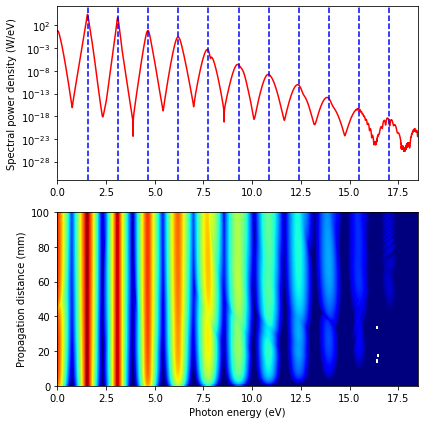

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99437.10127522562 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99440.29777589401 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99444.64770599632 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99449.94419335152 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99455.98041298812 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99462.56518945175 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99469.52761315314 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99476.70972527993 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99483.9542570949 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99491.10039932173 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99497.99346180033 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


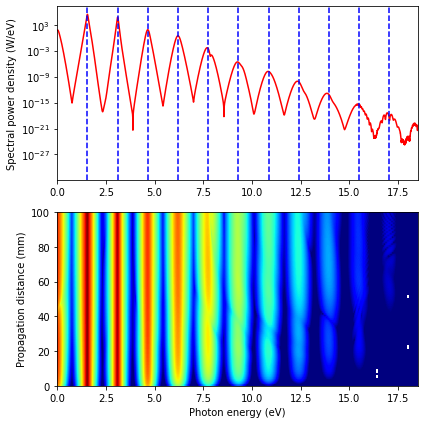

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994371.012752256 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994402.9777589393 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994446.4770599625 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994499.4419335143 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994559.8041298806 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994625.6518945169 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994695.2761315309 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994767.0972527986 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994839.5425709486 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994911.0039932166 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994979.934618003 nJ
Step: 11 Distance remai

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


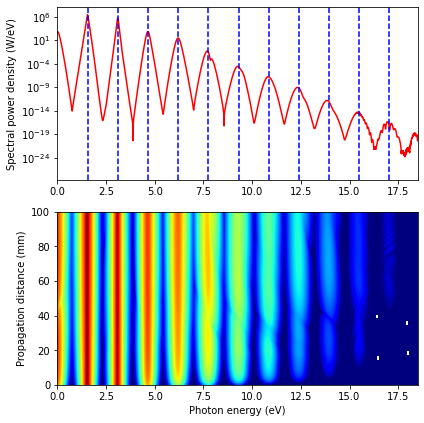

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9943815062750094 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9944360357655748 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9945106596525183 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9945997620041759 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9946983242525753 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9948021064430894 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9949071149181514 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.995009098815395 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9951039052985433 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9951884067806988 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9952613132147488 nJ
Step: 11 Distance

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


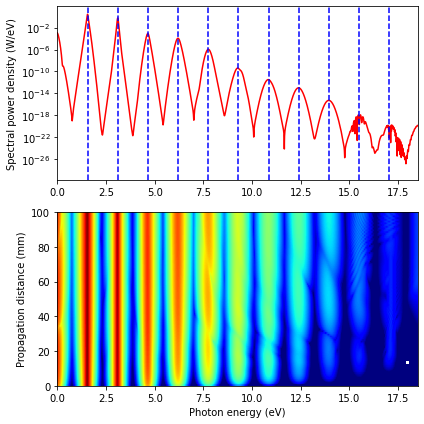

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.943815062750097 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.944360357655757 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.945106596525187 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.94599762004177 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.946983242525755 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.948021064430899 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.949071149181515 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.950090988153955 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.951039052985434 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.951884067806992 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.952613132147492 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


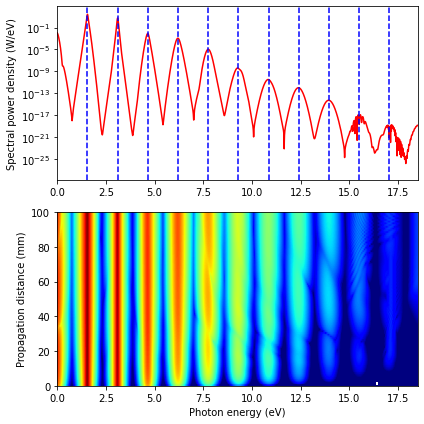

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.43815062750089 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.44360357655749 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.45106596525181 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.4599762004176 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.46983242525748 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.48021064430891 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.49071149181509 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.50090988153949 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.5103905298543 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.51884067806986 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.52613132147484 nJ
Step: 11 Distan

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


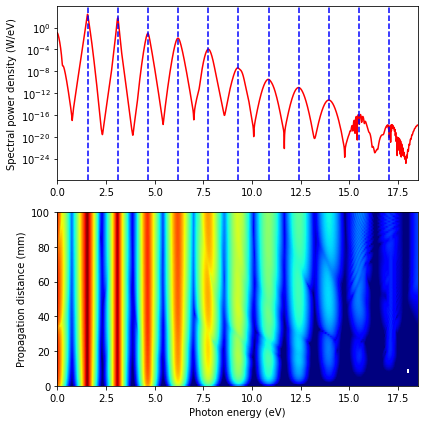

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.3815062750092 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.436035765575 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.5106596525186 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.5997620041765 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.698324252575 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.8021064430895 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.9071149181515 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995.0090988153954 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995.1039052985439 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995.1884067806996 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 995.2613132147488 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


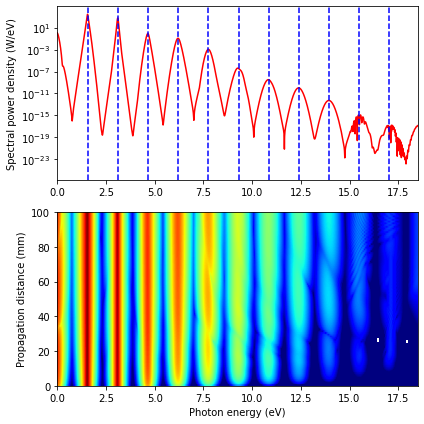

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9943.815062750096 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9944.360357655754 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9945.106596525193 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9945.997620041773 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9946.98324252576 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9948.021064430903 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9949.071149181522 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9950.090988153957 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9951.039052985441 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9951.884067806997 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9952.613132147497 nJ
Step: 11 Distance remai

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


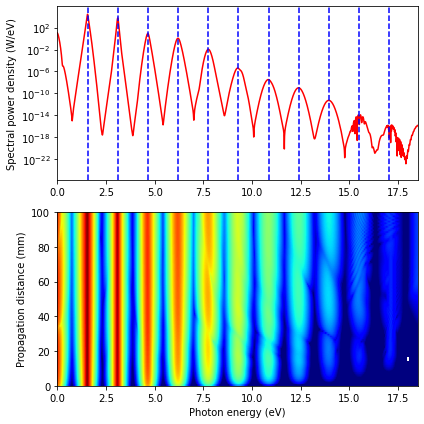

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99438.15062750095 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99443.6035765575 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99451.06596525185 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99459.97620041764 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99469.83242525755 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99480.21064430896 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99490.71149181516 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99500.90988153953 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99510.39052985435 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99518.84067806994 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99526.13132147492 nJ
Step: 11 Dis

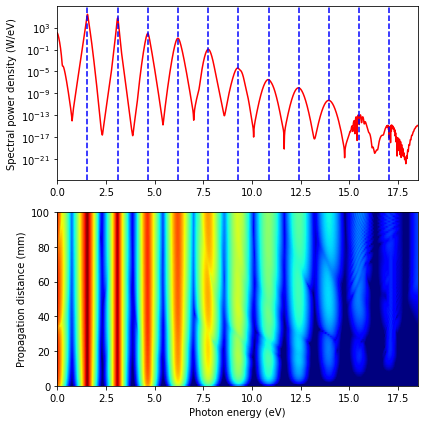

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994381.5062750095 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994436.0357655752 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994510.6596525185 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994599.7620041764 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994698.3242525753 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994802.1064430898 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994907.1149181515 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995009.0988153951 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995103.9052985436 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995188.4067806992 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 995261.3132147492 nJ
Step: 11 Distance rem

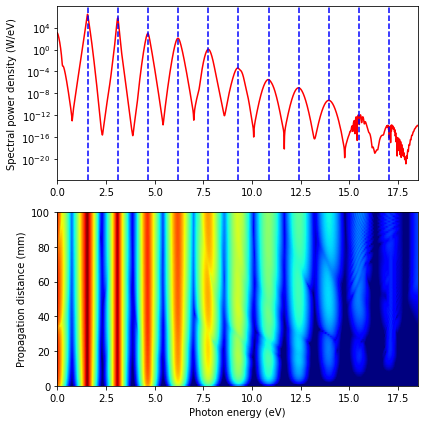

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9944363669870522 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9946017046600154 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9948070347463146 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9950174608802557 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9951988926006747 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9953347284942735 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9954407506375859 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9955459773066762 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9956740504655143 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9958448286798162 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9960697386247485 nJ
Step: 11 Distanc

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


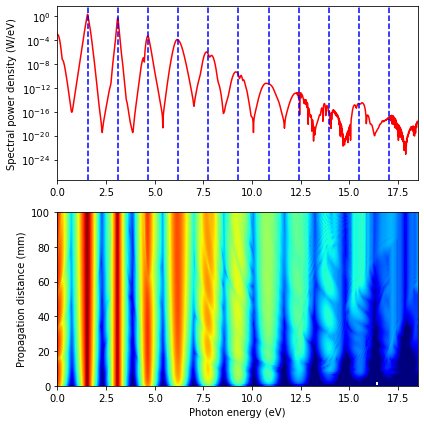

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.944363669870521 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.946017046600154 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.948070347463146 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.950174608802557 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.951988926006747 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.953347284942733 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.95440750637586 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.955459773066758 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.956740504655144 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.958448286798161 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.960697386247483 nJ
Step: 11 Dis

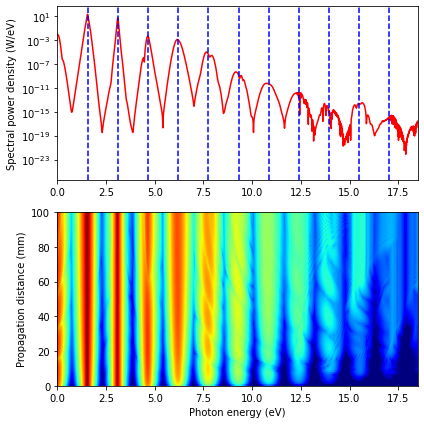

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.4436366987052 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.46017046600151 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.4807034746314 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.50174608802554 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.51988926006747 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.53347284942733 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.54407506375858 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.55459773066755 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.56740504655139 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.58448286798156 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.6069738624748 nJ
Step: 11 Distanc

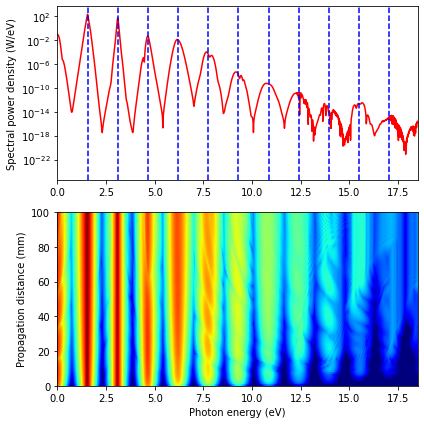

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.4363669870519 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.6017046600152 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.8070347463142 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995.0174608802557 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995.1988926006745 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995.3347284942736 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995.4407506375861 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995.5459773066759 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995.6740504655145 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995.8448286798161 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996.0697386247482 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


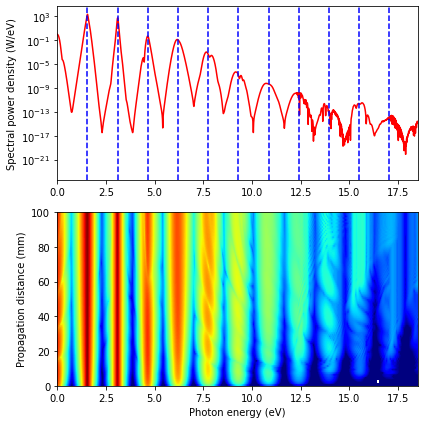

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9944.363669870521 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9946.017046600145 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9948.070347463135 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9950.174608802548 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9951.988926006741 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9953.347284942725 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9954.407506375852 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9955.459773066752 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9956.740504655138 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9958.448286798153 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9960.697386247475 nJ
Step: 11 Distance rema

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


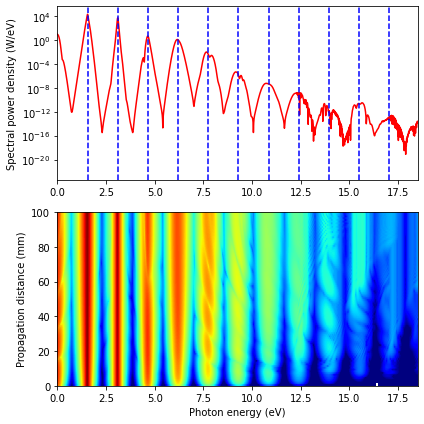

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99443.63669870522 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99460.17046600152 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99480.70347463147 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99501.74608802558 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99519.88926006749 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99533.47284942736 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99544.07506375863 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99554.5977306676 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99567.40504655146 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99584.48286798161 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99606.97386247489 nJ
Step: 11 Dis

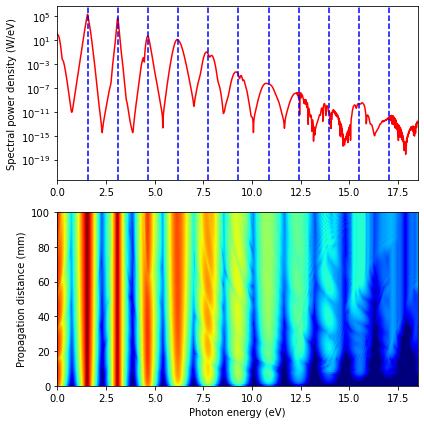

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994436.3669870521 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994601.7046600154 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994807.0347463143 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995017.4608802558 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995198.8926006744 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995334.7284942734 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995440.7506375861 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995545.977306676 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995674.0504655143 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995844.828679816 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996069.7386247484 nJ
Step: 11 Distance remai

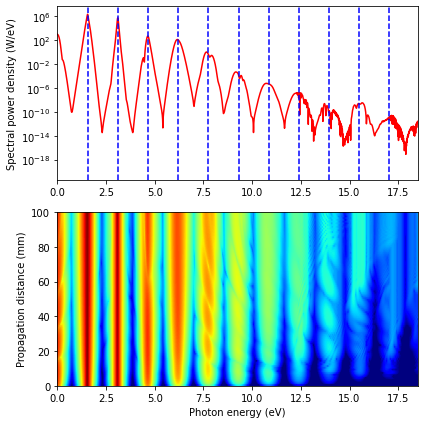

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9945119239979039 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9948086671324813 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.995116739323925 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9953383495886512 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9954970135402987 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9956847365718628 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9959732338497285 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9963782323572578 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9968302355216418 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9972496538044621 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9975801207006727 nJ
Step: 11 Distance

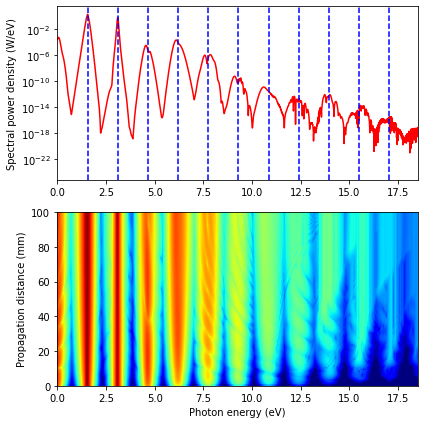

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.945119239979032 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.948086671324807 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.95116739323924 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.953383495886504 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.954970135402979 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.95684736571862 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.959732338497279 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.963782323572573 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.96830235521641 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.972496538044613 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.97580120700672 nJ
Step: 11 Distan

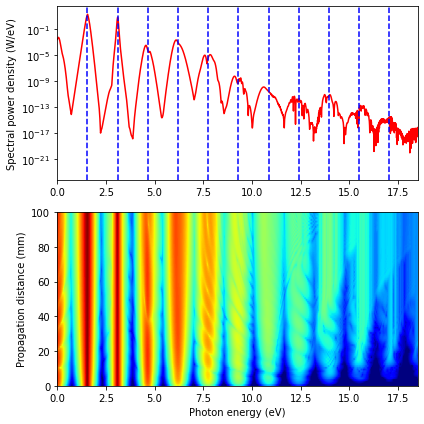

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.45119239979034 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.48086671324815 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.51167393239247 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.53383495886509 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.54970135402982 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.56847365718627 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.59732338497281 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.63782323572575 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.68302355216414 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.72496538044618 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.75801207006721 nJ
Step: 11 Dist

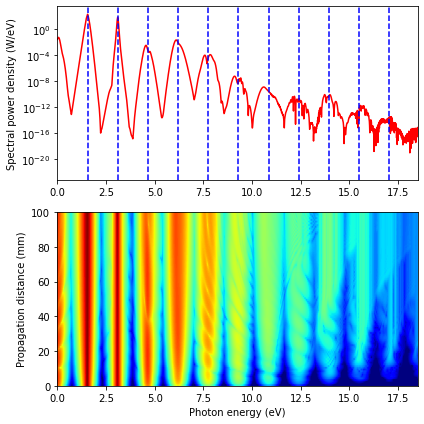

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.511923997903 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.8086671324808 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.1167393239241 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995.3383495886501 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995.4970135402976 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995.6847365718622 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995.9732338497274 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 996.378232357257 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996.8302355216408 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997.249653804461 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 997.5801207006718 nJ
Step: 11 Distan

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


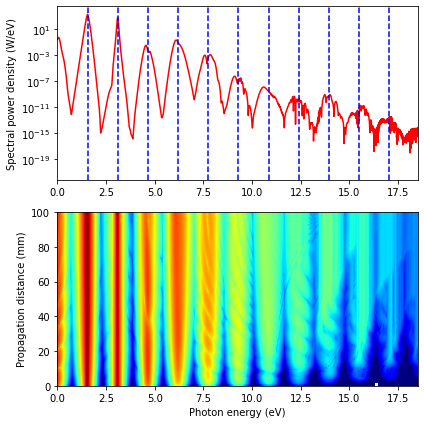

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9945.119239979036 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9948.086671324812 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9951.16739323925 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9953.383495886512 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9954.970135402986 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9956.84736571863 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9959.732338497284 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9963.782323572577 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9968.302355216418 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9972.496538044617 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9975.801207006725 nJ
Step: 11 Distance remain

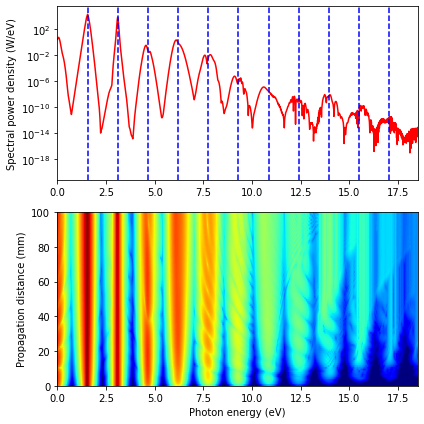

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99451.19239979034 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99480.8667132481 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99511.67393239246 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99533.83495886505 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99549.7013540298 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99568.47365718623 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99597.3233849728 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99637.82323572574 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99683.02355216412 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99724.96538044614 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99758.01207006721 nJ
Step: 11 Dista

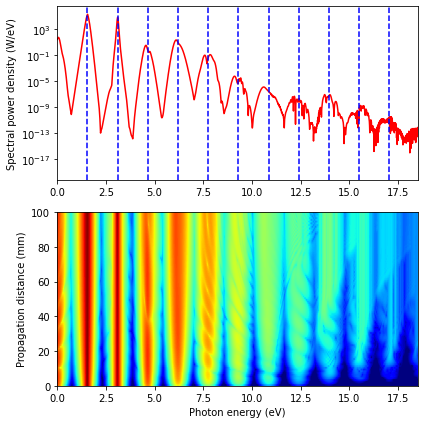

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994511.9239979034 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994808.667132481 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995116.7393239244 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995338.3495886505 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995497.0135402983 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995684.7365718625 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995973.2338497282 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 996378.2323572574 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996830.2355216412 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997249.6538044612 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 997580.1207006719 nJ
Step: 11 Distance rema

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


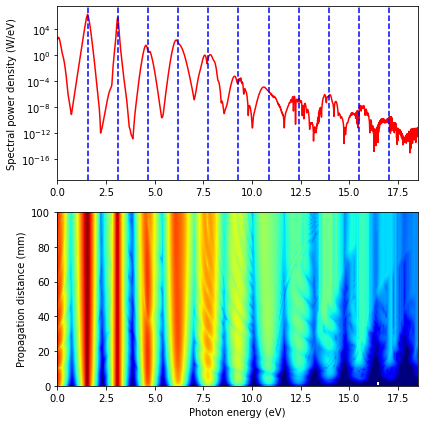

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9946026726118739 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9950215802929381 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9953401411416261 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9955556536361134 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9958718885217263 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9963971135510841 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9970022311363391 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9975054448173957 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9978312168391476 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9980342233398812 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9981698757146519 nJ
Step: 11 Distanc

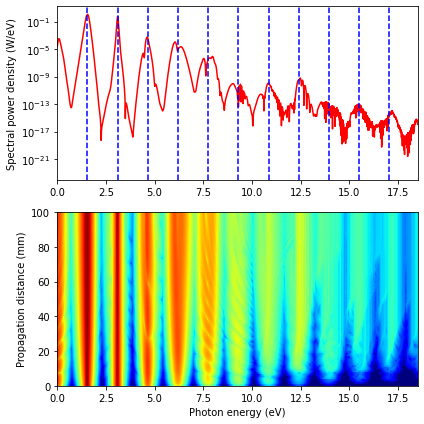

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.946026726118738 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.950215802929383 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.953401411416259 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.955556536361131 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.958718885217262 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.963971135510835 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.97002231136339 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.975054448173955 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.978312168391476 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.98034223339881 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.981698757146518 nJ
Step: 11 Dist

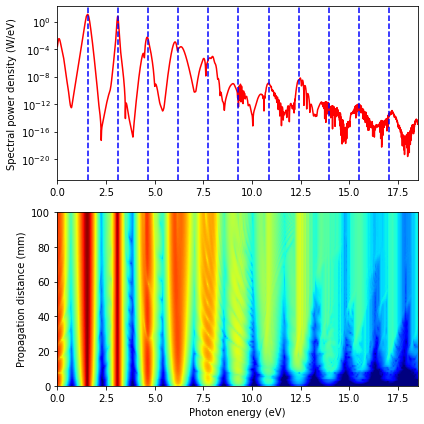

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.46026726118738 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.50215802929382 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.53401411416262 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.55556536361135 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.58718885217264 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.63971135510845 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.70022311363392 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.75054448173958 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.7831216839148 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.80342233398814 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.81698757146523 nJ
Step: 11 Dista

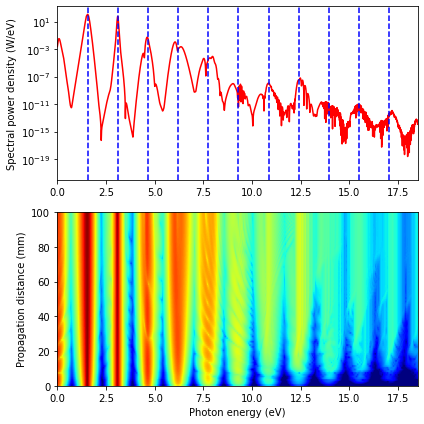

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.6026726118732 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.0215802929376 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.3401411416254 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995.5556536361122 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995.8718885217256 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996.3971135510834 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997.0022311363385 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 997.5054448173946 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997.831216839147 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 998.0342233398808 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 998.1698757146513 nJ
Step: 11 Dist

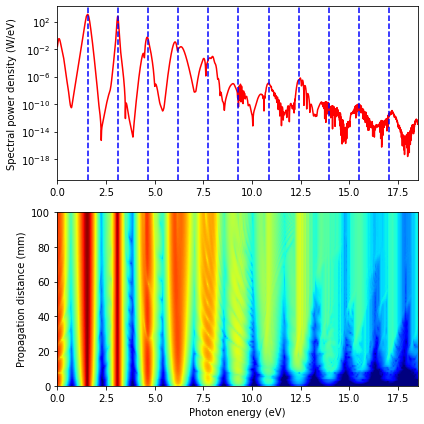

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9946.026726118735 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9950.215802929377 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9953.401411416256 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9955.556536361131 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9958.718885217262 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9963.97113551084 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9970.022311363391 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9975.054448173954 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9978.312168391478 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9980.342233398815 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9981.698757146523 nJ
Step: 11 Distance remai

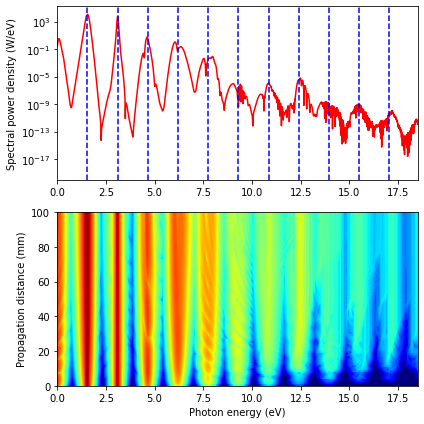

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99460.26726118737 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99502.15802929379 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99534.01411416255 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99555.5653636113 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99587.18885217259 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99639.71135510837 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99700.2231136339 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99750.54448173956 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99783.12168391478 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99803.42233398816 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99816.98757146522 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


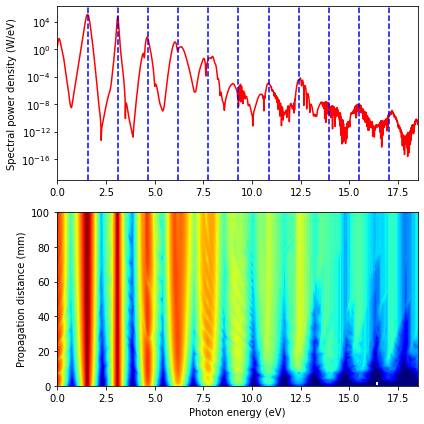

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994602.6726118738 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995021.580292938 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995340.1411416259 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995555.653636113 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995871.8885217258 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996397.1135510837 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997002.2311363391 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 997505.4448173954 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997831.2168391474 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 998034.2233398812 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 998169.875714652 nJ
Step: 11 Distance remain

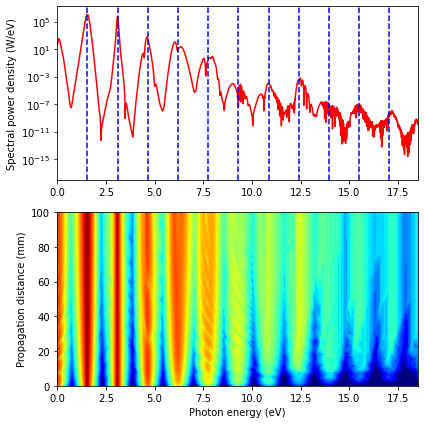

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.994703581721484 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9952050004903218 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9955011467699583 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9958773646235772 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9965615391175695 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9972901735233488 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9977759456885719 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9980431313567992 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9982014969371052 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9982581680800278 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9981818812187485 nJ
Step: 11 Distance

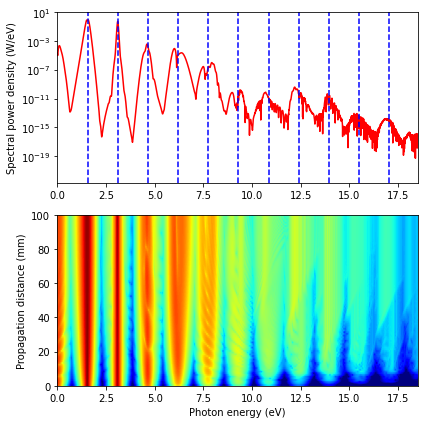

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.947035817214834 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.952050004903214 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.95501146769958 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.958773646235766 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.965615391175685 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.97290173523348 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.97775945688571 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.98043131356798 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.982014969371045 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.982581680800271 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.981818812187477 nJ
Step: 11 Distan

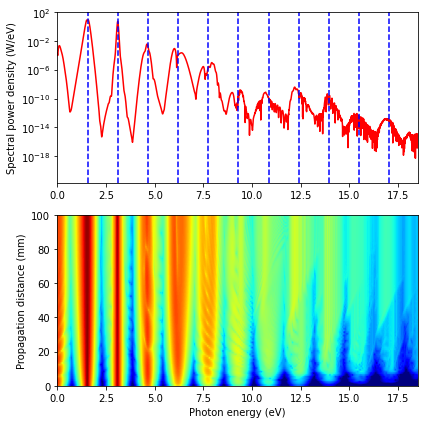

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.47035817214835 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.52050004903211 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.55011467699578 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.58773646235763 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.65615391175686 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.72901735233481 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.77759456885711 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.8043131356798 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.82014969371046 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.82581680800271 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.81818812187475 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


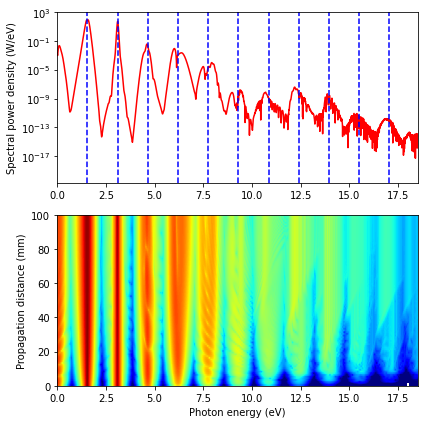

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.7035817214836 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.2050004903213 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.501146769958 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995.8773646235767 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996.561539117569 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997.2901735233484 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997.7759456885714 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998.0431313567985 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998.2014969371049 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 998.2581680800275 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 998.181881218748 nJ
Step: 11 Distan

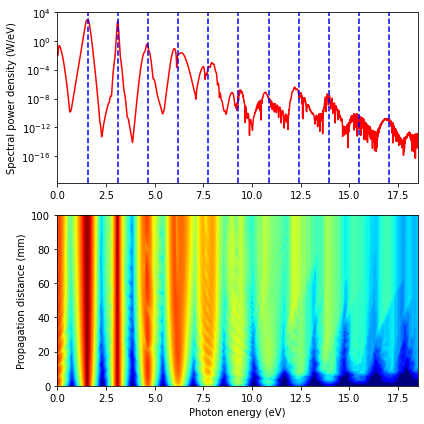

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9947.035817214839 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9952.050004903214 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9955.011467699584 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9958.773646235768 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9965.615391175692 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9972.901735233481 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9977.759456885711 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9980.431313567984 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9982.014969371048 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9982.581680800273 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9981.818812187475 nJ
Step: 11 Distance rema

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


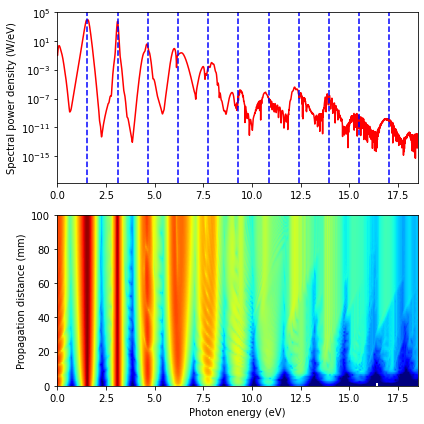

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99470.35817214836 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99520.50004903214 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99550.11467699577 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99587.73646235767 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99656.15391175688 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99729.0173523348 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99777.59456885711 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99804.31313567983 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99820.14969371047 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99825.81680800274 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99818.18812187479 nJ
Step: 11 Dis

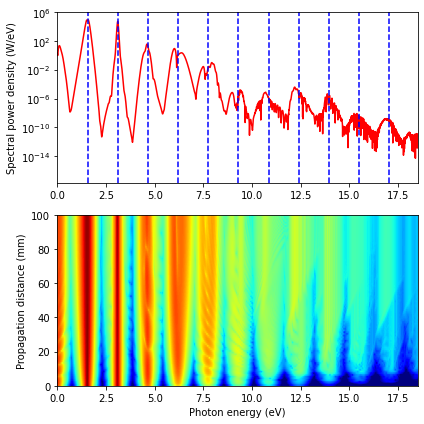

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994703.5817214837 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995205.0004903214 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995501.1467699577 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995877.3646235766 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996561.5391175689 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997290.173523348 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997775.9456885713 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998043.1313567983 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998201.496937105 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 998258.1680800277 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 998181.881218748 nJ
Step: 11 Distance remain

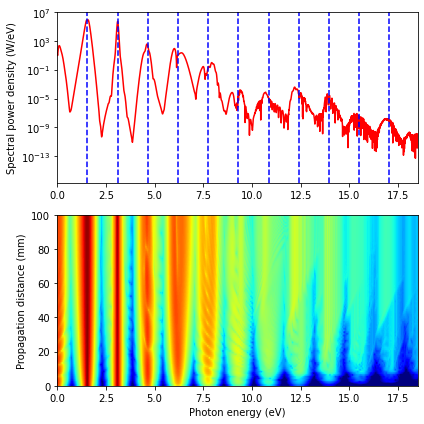

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9948102943961292 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9953419198716934 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9956955631263116 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9964159194760245 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9973001392201081 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9978493094236436 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9981220769541098 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9982519750173436 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9982033500057973 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9979138313310002 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9973659571321017 nJ
Step: 11 Distanc

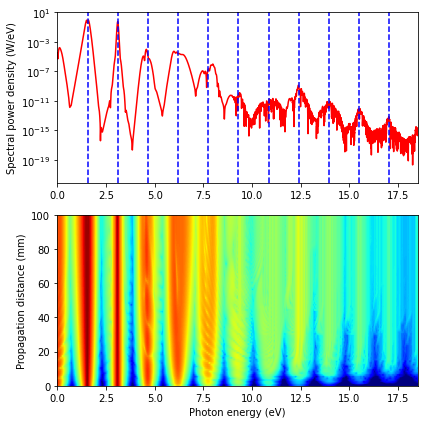

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.948102943961288 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.953419198716933 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.956955631263114 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.964159194760244 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.973001392201075 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.978493094236432 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.981220769541094 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.982519750173438 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.982033500057973 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.979138313310003 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.973659571321017 nJ
Step: 11 Di

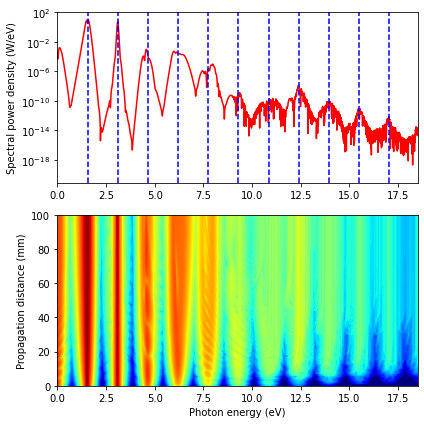

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.48102943961291 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.53419198716936 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.56955631263116 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.64159194760241 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.73001392201074 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.78493094236431 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.81220769541095 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.82519750173435 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.82033500057968 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.79138313310001 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.73659571321015 nJ
Step: 11 Dist

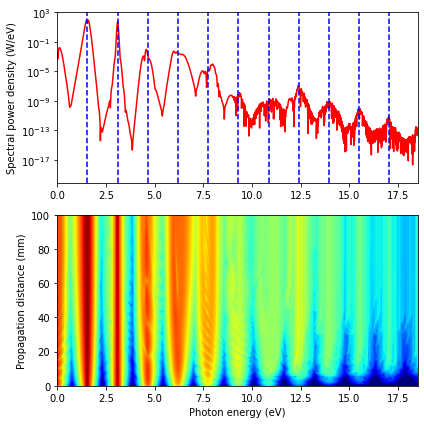

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.8102943961292 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.3419198716938 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.6955631263116 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996.4159194760248 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997.3001392201076 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997.8493094236438 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998.1220769541103 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998.2519750173443 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998.2033500057976 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997.9138313310009 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 997.3659571321023 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


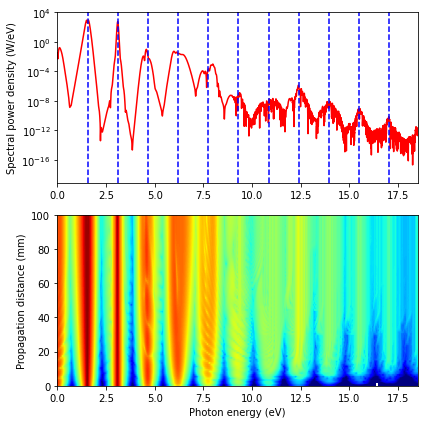

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9948.10294396129 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9953.419198716936 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9956.955631263116 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9964.15919476025 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9973.001392201082 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9978.493094236439 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9981.220769541105 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9982.519750173442 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9982.033500057978 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9979.138313310012 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9973.659571321023 nJ
Step: 11 Distance remain

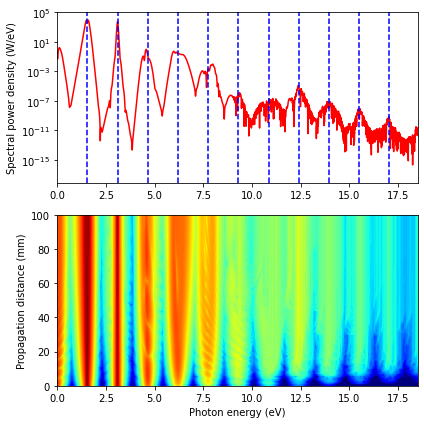

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99481.02943961293 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99534.19198716937 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99569.55631263115 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99641.59194760243 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99730.01392201078 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99784.93094236437 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99812.207695411 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99825.19750173436 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99820.33500057973 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99791.38313310005 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99736.59571321019 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


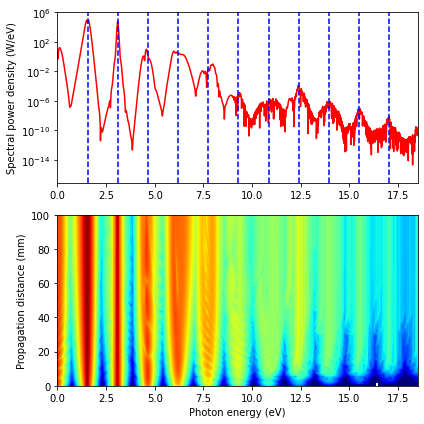

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994810.2943961294 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995341.9198716938 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995695.5631263121 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996415.9194760252 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997300.1392201083 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997849.3094236441 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998122.0769541105 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998251.9750173443 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998203.3500057978 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997913.831331001 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 997365.9571321026 nJ
Step: 11 Distance rema

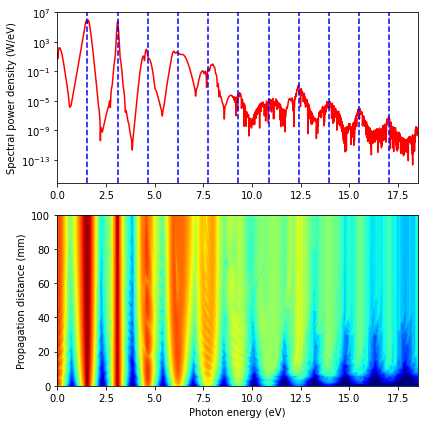

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9949185422475989 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.995450020744323 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9959994922798808 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9970339823812875 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9977886618403842 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9981254242575938 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9982574866613027 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9981274177376511 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9976420475320978 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9968834733412942 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9961160567026384 nJ
Step: 11 Distance

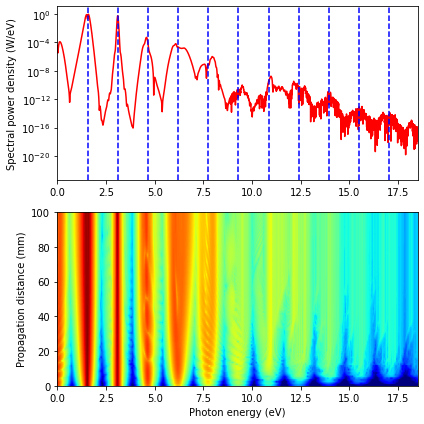

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.949185422475987 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.954500207443225 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.959994922798803 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.970339823812875 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.97788661840384 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.98125424257594 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.982574866613025 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.981274177376513 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.976420475320978 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.968834733412946 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.961160567026386 nJ
Step: 11 Dist

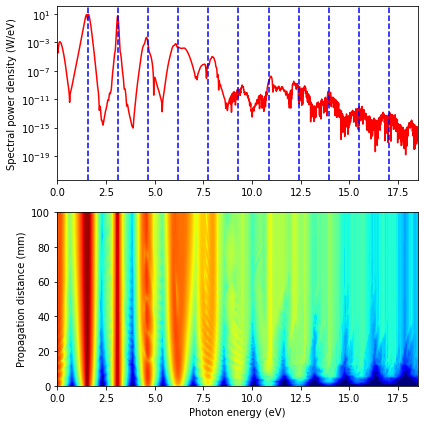

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.49185422475989 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.54500207443229 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.59994922798806 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.70339823812878 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.77886618403843 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.8125424257594 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.8257486661303 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.81274177376514 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.76420475320981 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.68834733412947 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.61160567026384 nJ
Step: 11 Distan

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


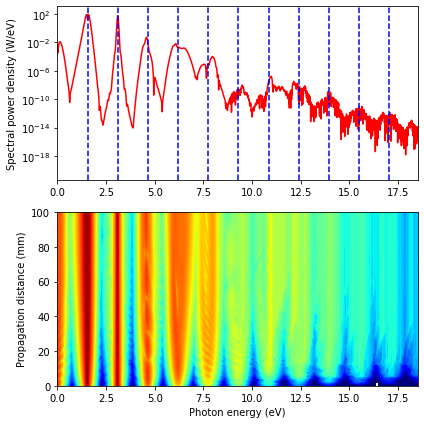

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.9185422475982 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.4500207443224 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.9994922798802 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997.0339823812872 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997.7886618403838 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998.1254242575936 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998.2574866613026 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998.1274177376512 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997.642047532098 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996.8834733412943 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996.1160567026385 nJ
Step: 11 Dist

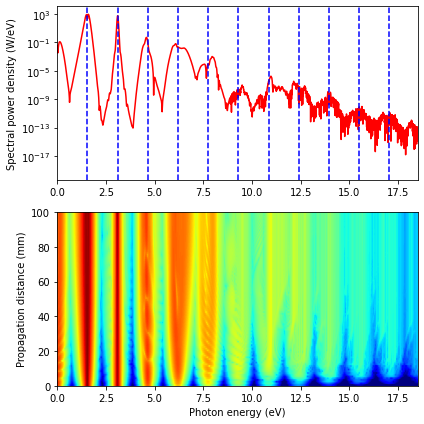

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9949.18542247599 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9954.500207443232 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9959.99492279881 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9970.33982381288 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9977.886618403847 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9981.254242575942 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9982.574866613031 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9981.274177376517 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9976.420475320985 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9968.834733412948 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9961.160567026385 nJ
Step: 11 Distance remaini

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


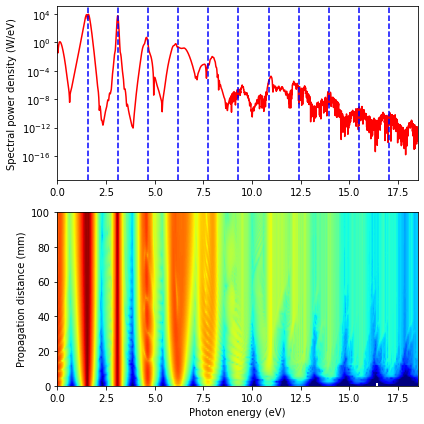

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99491.85422475984 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99545.00207443221 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99599.94922798802 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99703.3982381287 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99778.86618403833 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99812.54242575934 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99825.74866613021 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99812.7417737651 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99764.20475320975 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99688.3473341294 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99611.60567026379 nJ
Step: 11 Dista

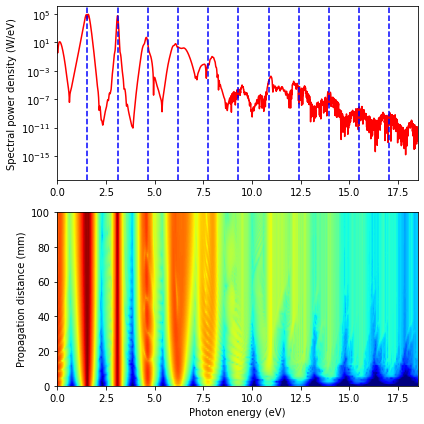

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994918.5422475991 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995450.020744323 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995999.4922798807 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997033.9823812878 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997788.6618403842 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998125.424257594 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998257.4866613026 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998127.4177376515 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997642.0475320983 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996883.473341295 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996116.0567026389 nJ
Step: 11 Distance remain

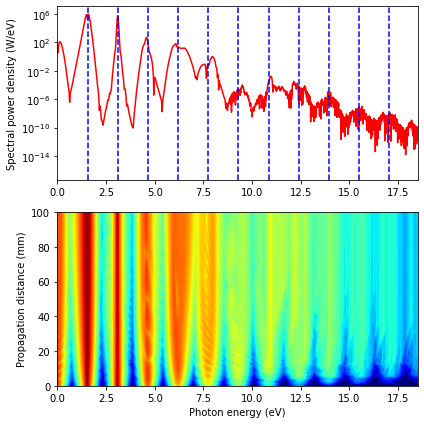

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9950236249498831 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9955604979194302 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9964253346869174 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9975397398046575 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9980555384828469 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9982533913070026 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9981218920456584 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9975258494349818 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9966300900812991 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9957680229026226 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9948291872982623 nJ
Step: 11 Distanc

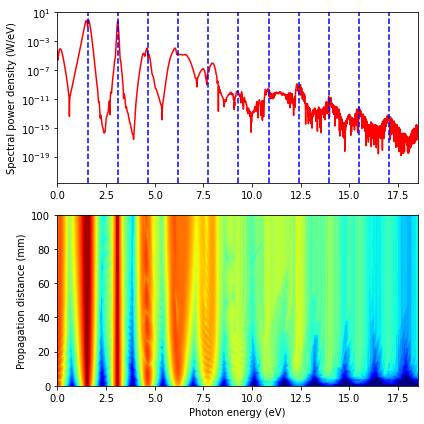

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.950236249498825 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.955604979194296 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.964253346869167 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.975397398046573 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.980555384828468 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.982533913070021 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.98121892045658 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.975258494349815 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.966300900812989 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.957680229026222 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.94829187298262 nJ
Step: 11 Dist

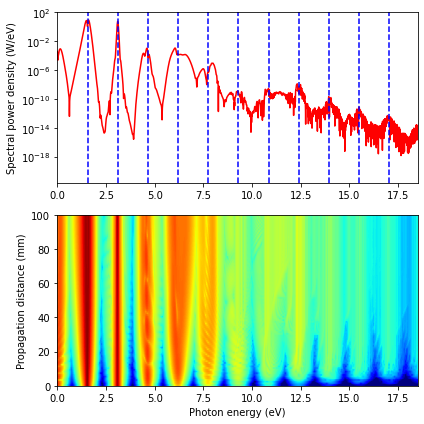

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.5023624949883 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.556049791943 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.64253346869175 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.75397398046576 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.80555384828472 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.82533913070023 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.81218920456581 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.75258494349818 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.66300900812989 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.57680229026221 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.48291872982622 nJ
Step: 11 Distanc

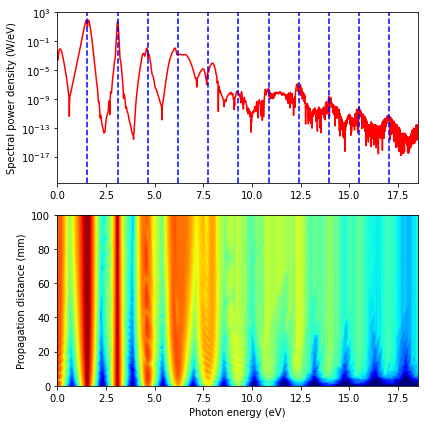

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.0236249498826 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.56049791943 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996.4253346869172 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997.5397398046572 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 998.0555384828469 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998.2533913070023 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998.1218920456582 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 997.5258494349815 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996.6300900812987 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995.7680229026223 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.829187298262 nJ
Step: 11 Distan

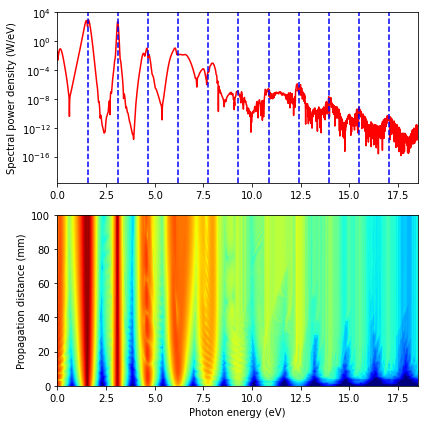

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9950.236249498825 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9955.604979194297 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9964.25334686917 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9975.397398046573 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9980.555384828469 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9982.533913070021 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9981.21892045658 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9975.258494349811 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9966.300900812985 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9957.680229026219 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9948.291872982618 nJ
Step: 11 Distance remain

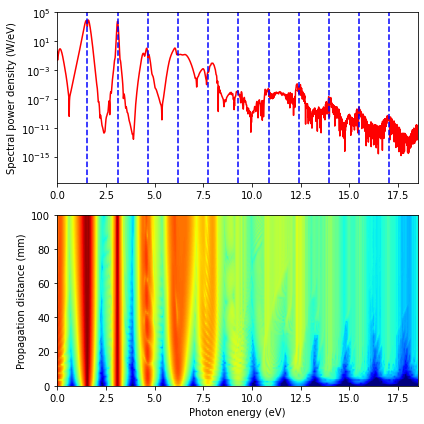

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99502.36249498827 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99556.04979194298 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99642.53346869172 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99753.97398046574 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99805.5538482847 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99825.33913070023 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99812.18920456579 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99752.58494349814 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99663.00900812987 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99576.80229026222 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99482.91872982621 nJ
Step: 11 Dis

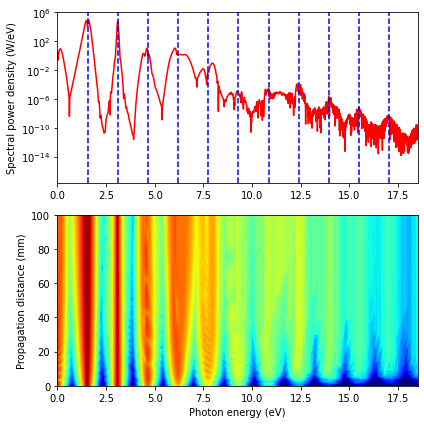

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995023.6249498829 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995560.49791943 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996425.3346869173 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997539.7398046579 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 998055.5384828474 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998253.3913070026 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998121.8920456585 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 997525.8494349817 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996630.0900812988 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995768.0229026222 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994829.1872982623 nJ
Step: 11 Distance remai

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


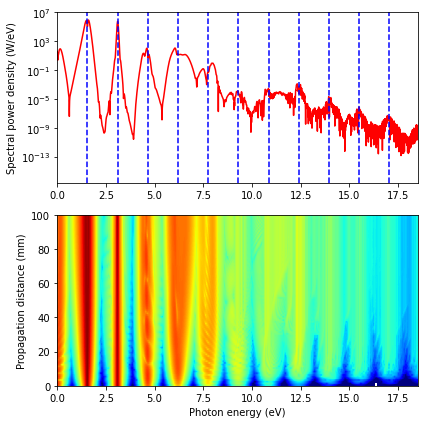

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9944525245443533 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9946497286560463 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.994888901885652 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9951240731654274 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9953122988573812 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9954446988439908 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9955545971156865 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9956794264703548 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9958465534460232 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9960765483211272 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9963672940888967 nJ
Step: 11 Distance

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


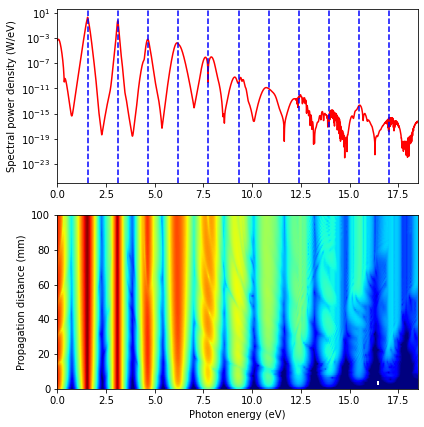

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.944525245443533 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.94649728656046 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.94888901885652 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.951240731654272 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.953122988573806 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.954446988439908 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.955545971156862 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.956794264703547 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.958465534460231 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.96076548321127 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.963672940888964 nJ
Step: 11 Dista

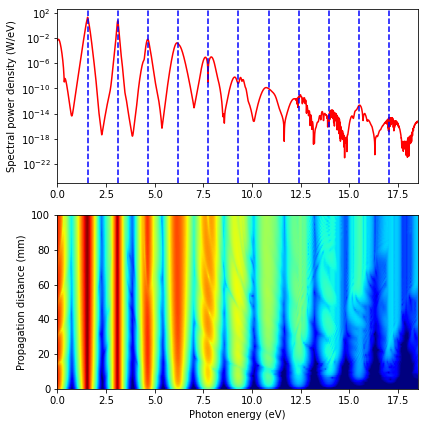

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.44525245443533 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.46497286560454 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.48889018856518 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.51240731654268 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.53122988573806 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.54446988439902 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.5554597115686 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.56794264703541 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.58465534460224 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.60765483211266 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.63672940888962 nJ
Step: 11 Dista

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


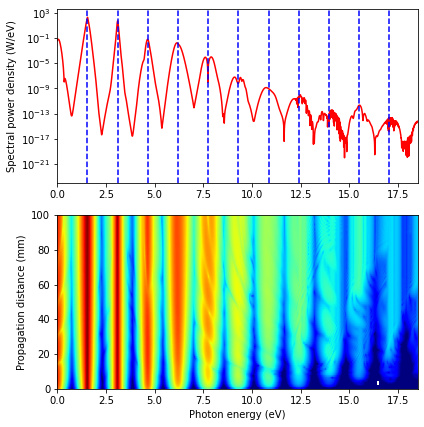

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.4525245443529 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.6497286560456 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.8889018856515 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995.1240731654266 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995.3122988573805 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995.4446988439904 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995.5545971156861 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995.6794264703544 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995.8465534460229 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996.0765483211267 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996.3672940888964 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


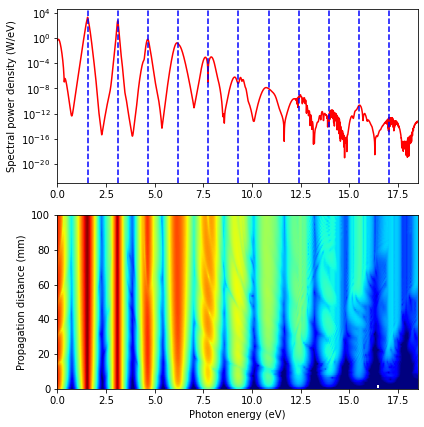

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9944.525245443538 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9946.497286560463 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9948.889018856527 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9951.240731654278 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9953.122988573816 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9954.446988439911 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9955.545971156871 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9956.794264703554 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9958.465534460236 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9960.765483211277 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9963.672940888971 nJ
Step: 11 Distance rema

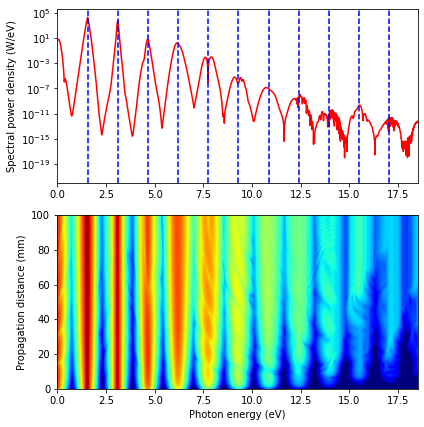

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99445.25245443531 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99464.97286560456 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99488.89018856517 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99512.40731654271 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99531.22988573807 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99544.46988439905 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99555.45971156862 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99567.94264703545 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99584.6553446023 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99607.6548321127 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99636.72940888963 nJ
Step: 11 Dist

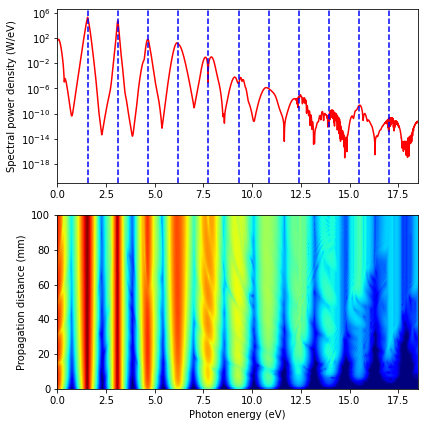

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994452.5245443534 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994649.7286560459 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994888.9018856519 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995124.0731654271 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995312.2988573809 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995444.6988439908 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995554.5971156864 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995679.4264703542 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995846.5534460226 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996076.5483211266 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996367.294088896 nJ
Step: 11 Distance rema

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


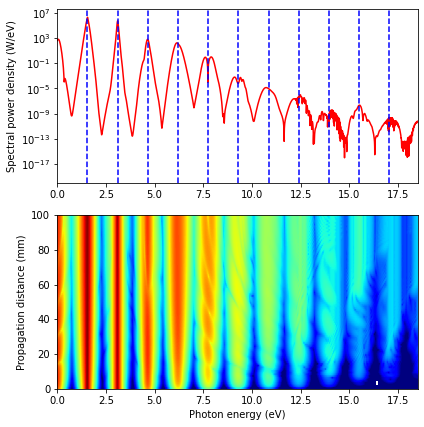

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9946508714960695 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9951285213861282 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9954500162145905 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9956916001572843 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9961125436999265 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9967549318783941 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9973811890711105 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9978070633023306 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9980372350894683 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.998153757808925 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9981890002438814 nJ
Step: 11 Distance

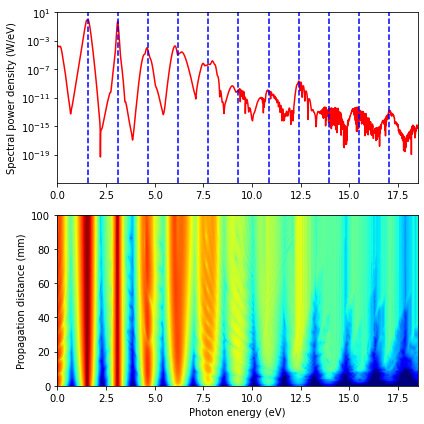

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.946508714960688 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.951285213861283 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.954500162145903 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.956916001572838 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.96112543699926 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.96754931878394 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.973811890711104 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.9780706330233 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.98037235089468 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.981537578089245 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.981890002438808 nJ
Step: 11 Distanc

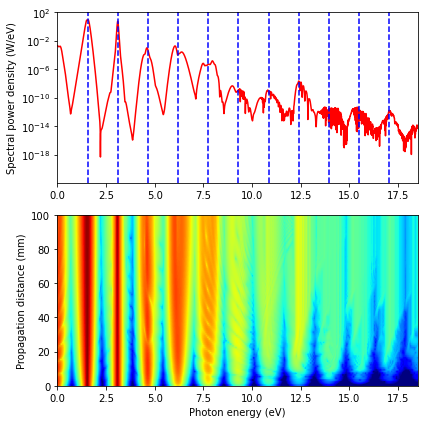

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.4650871496069 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.51285213861283 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.54500162145905 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.56916001572837 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.61125436999261 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.6754931878394 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.73811890711104 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.780706330233 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.80372350894677 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.81537578089244 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.81890002438809 nJ
Step: 11 Distance

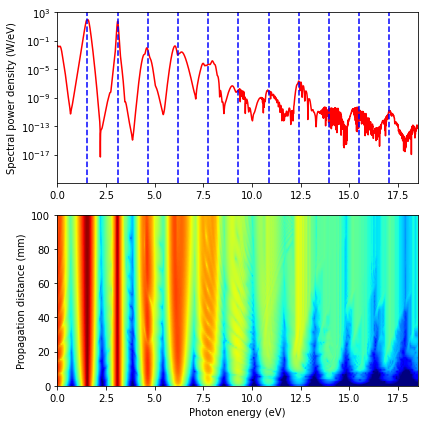

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.6508714960688 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.1285213861279 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.4500162145898 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995.6916001572835 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996.1125436999255 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996.7549318783933 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997.3811890711099 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 997.8070633023292 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998.0372350894673 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 998.153757808924 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 998.1890002438804 nJ
Step: 11 Dist

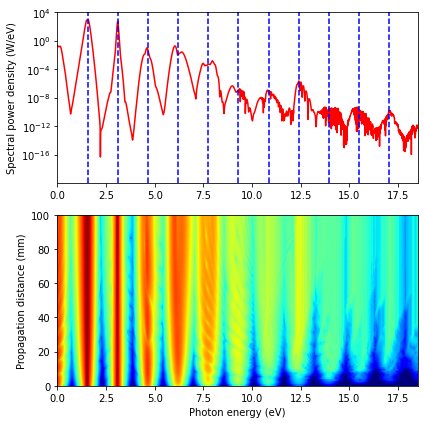

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9946.508714960693 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9951.285213861282 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9954.500162145901 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9956.916001572838 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9961.125436999258 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9967.549318783938 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9973.811890711106 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9978.0706330233 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9980.372350894677 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9981.537578089246 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9981.890002438806 nJ
Step: 11 Distance remain

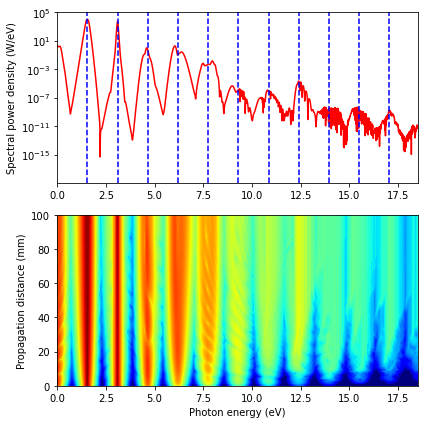

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99465.08714960693 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99512.8521386128 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99545.00162145901 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99569.16001572841 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99611.25436999263 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99675.49318783938 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99738.11890711103 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99780.706330233 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99803.72350894679 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99815.37578089247 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99818.90002438809 nJ
Step: 11 Dista

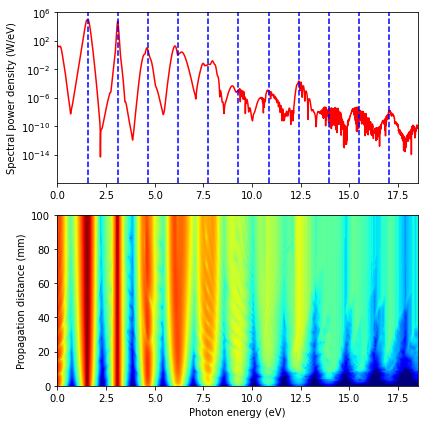

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994650.871496069 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995128.5213861282 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995450.0162145899 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995691.6001572836 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996112.543699926 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996754.9318783935 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997381.1890711102 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 997807.0633023294 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998037.2350894675 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 998153.7578089242 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 998189.0002438804 nJ
Step: 11 Distance remai

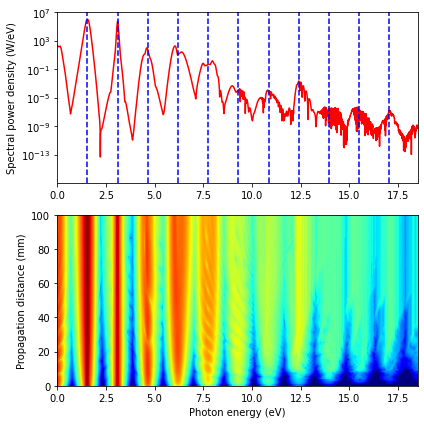

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9948926390905627 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.995451770885521 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9958754706882659 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9967760287415218 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9976445806966534 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9980489349610193 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9981845808962083 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9981298535861721 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9978507535465221 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9972655127268928 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9964741280034155 nJ
Step: 11 Distance

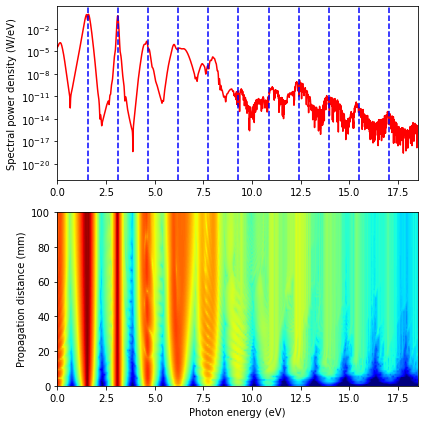

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.948926390905626 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.954517708855212 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.958754706882663 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.96776028741522 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.976445806966538 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.980489349610197 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.981845808962083 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.981298535861725 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.97850753546522 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.972655127268924 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.964741280034154 nJ
Step: 11 Dist

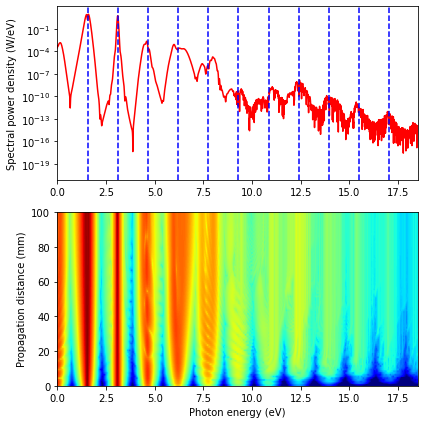

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.48926390905628 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.54517708855214 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.58754706882661 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.67760287415219 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.76445806966537 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.80489349610193 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.8184580896208 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.81298535861724 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.78507535465224 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.72655127268928 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.64741280034156 nJ
Step: 11 Dista

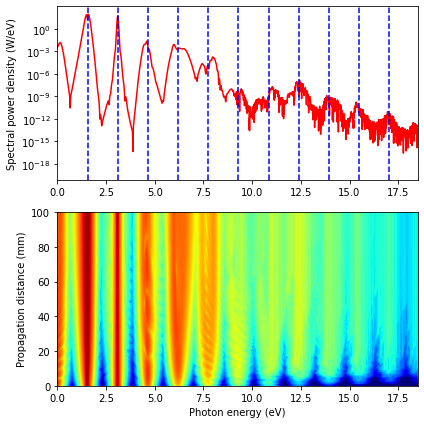

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.8926390905625 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.4517708855212 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.8754706882662 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996.7760287415223 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997.6445806966536 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998.0489349610195 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998.1845808962086 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998.1298535861724 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997.8507535465224 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997.2655127268928 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996.4741280034158 nJ
Step: 11 Dis

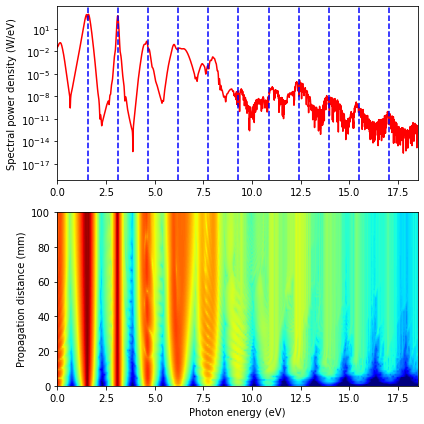

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9948.926390905628 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9954.517708855212 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9958.754706882659 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9967.760287415218 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9976.445806966534 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9980.489349610189 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9981.845808962076 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9981.298535861719 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9978.507535465216 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9972.655127268921 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9964.74128003415 nJ
Step: 11 Distance remai

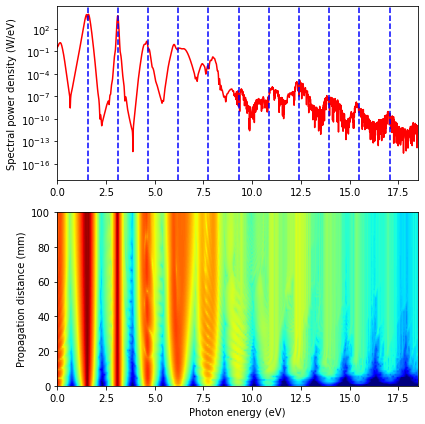

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99489.26390905626 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99545.17708855211 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99587.5470688266 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99677.60287415219 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99764.45806966537 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99804.89349610194 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99818.4580896208 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99812.98535861721 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99785.07535465222 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99726.55127268923 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99647.41280034152 nJ
Step: 11 Dist

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


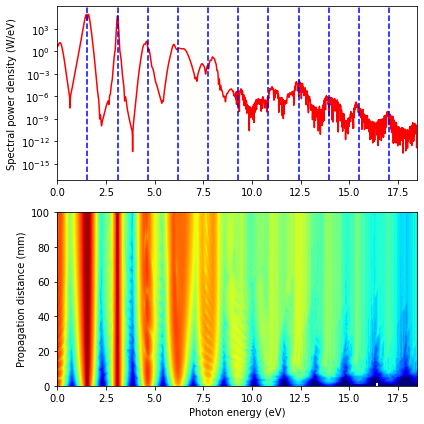

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994892.6390905635 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995451.7708855217 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995875.470688267 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996776.0287415226 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997644.5806966542 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998048.9349610201 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998184.580896209 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998129.853586173 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997850.7535465229 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997265.5127268933 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996474.128003416 nJ
Step: 11 Distance remaini

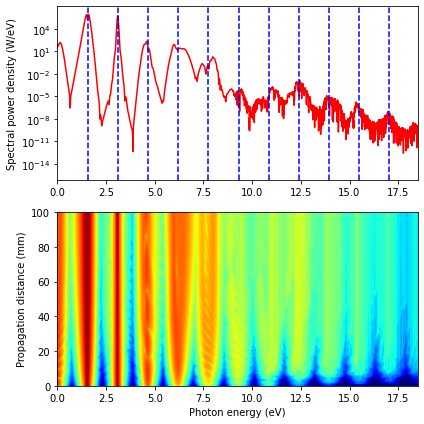

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9951307265396893 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9956977134277624 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.996786545180466 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9978328220038779 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9981630155698401 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9981225348431603 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9976588233494158 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9966829840246464 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9956401329951855 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9946617473205108 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9936961720237442 nJ
Step: 11 Distance

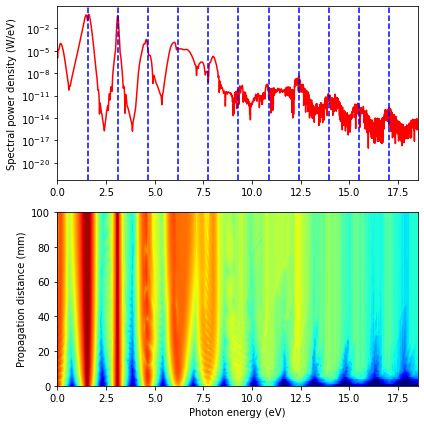

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.951307265396894 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.95697713427763 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.967865451804661 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.978328220038783 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.981630155698406 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.981225348431604 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.976588233494157 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.966829840246461 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.956401329951856 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.946617473205107 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.936961720237441 nJ
Step: 11 Dis

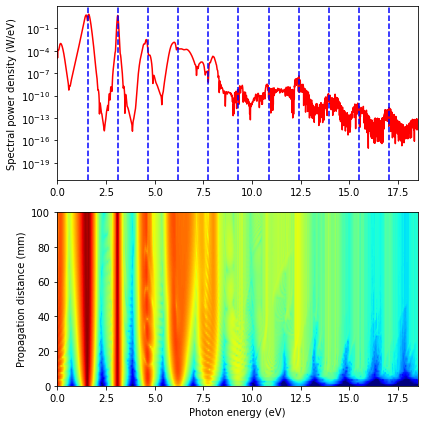

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.5130726539689 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.56977134277625 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.67865451804661 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.78328220038782 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.81630155698406 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.81225348431606 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.76588233494155 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.66829840246463 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.56401329951854 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.46617473205106 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.36961720237441 nJ
Step: 11 Dista

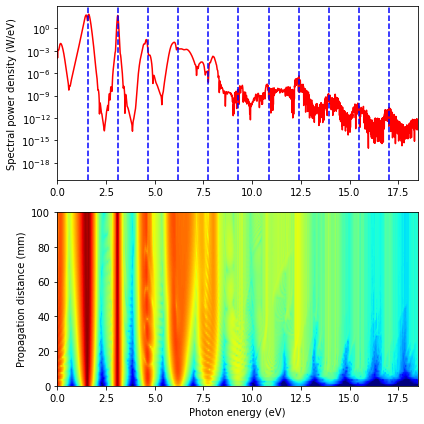

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.130726539689 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.6977134277623 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996.786545180466 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997.8328220038779 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 998.1630155698401 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998.1225348431603 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997.6588233494151 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 996.6829840246461 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995.6401329951854 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.6617473205104 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993.6961720237438 nJ
Step: 11 Dista

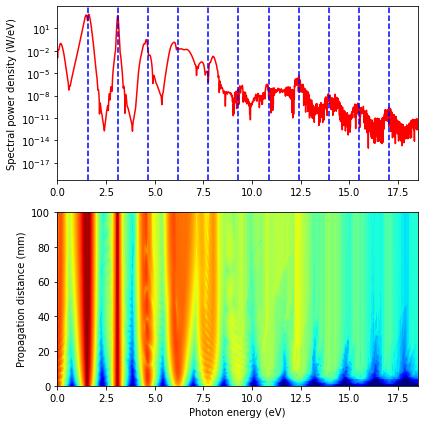

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9951.307265396892 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9956.977134277626 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9967.86545180466 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9978.32822003878 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9981.630155698404 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9981.225348431606 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9976.588233494156 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9966.829840246464 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9956.401329951857 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9946.61747320511 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9936.961720237445 nJ
Step: 11 Distance remaini

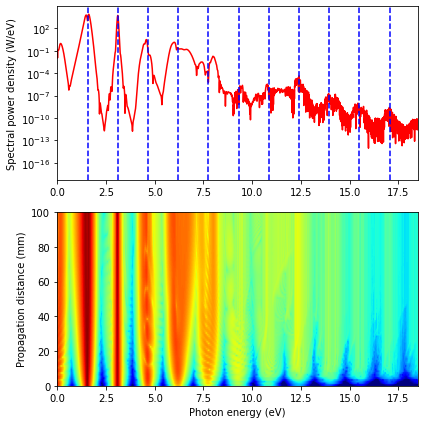

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99513.07265396895 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99569.77134277626 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99678.65451804662 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99783.28220038781 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99816.30155698406 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99812.25348431602 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99765.88233494155 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99668.29840246464 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99564.01329951853 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99466.17473205103 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99369.61720237441 nJ
Step: 11 Di

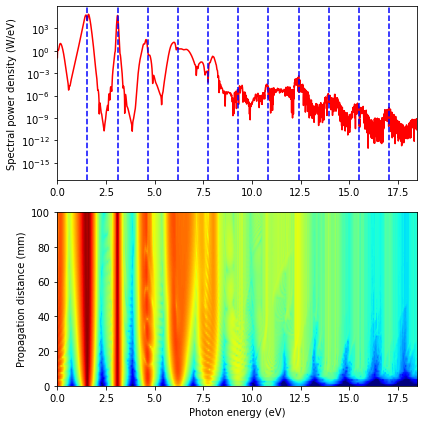

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995130.7265396895 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995697.7134277624 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996786.5451804658 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997832.8220038781 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 998163.0155698404 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 998122.5348431602 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 997658.8233494151 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 996682.9840246461 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 995640.1329951851 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994661.7473205106 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993696.1720237441 nJ
Step: 11 Distance rem

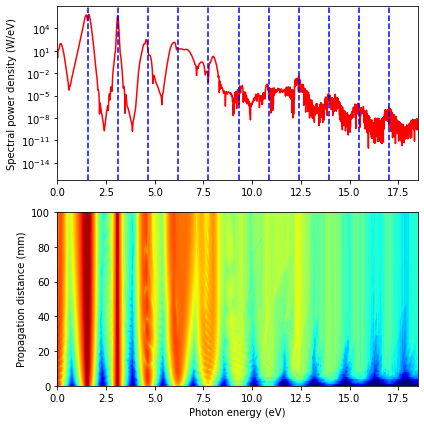

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9953203330704068 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9961343851803001 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9976604641200094 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9981646383881863 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9980477810762496 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9971863173699723 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9958438211992363 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9946061261666034 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9935153489241787 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9935740615961193 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9942686754461282 nJ
Step: 11 Distanc

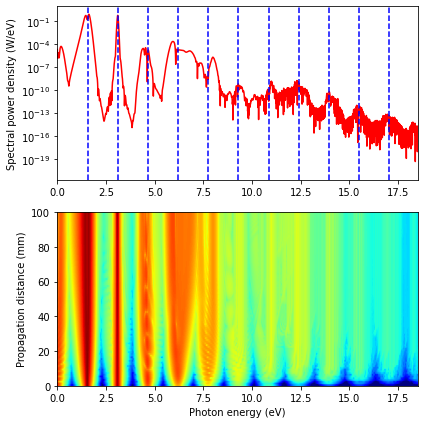

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.953203330704067 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.961343851803003 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.97660464120009 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.981646383881857 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.980477810762492 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.971863173699719 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.95843821199236 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.94606126166603 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.935153489241783 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.935740615961189 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.942686754461281 nJ
Step: 11 Dista

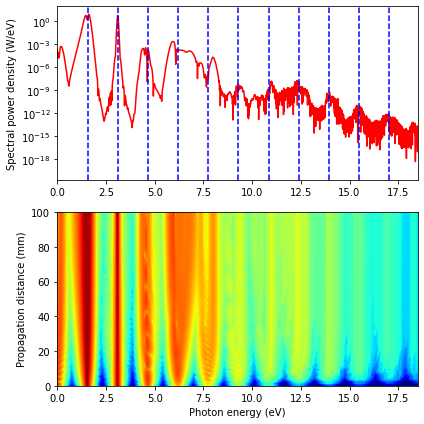

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.5320333070407 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.61343851803005 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.76604641200097 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.81646383881866 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.804778107625 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.71863173699724 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.58438211992367 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.4606126166604 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.3515348924179 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.35740615961195 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.42686754461288 nJ
Step: 11 Distance 

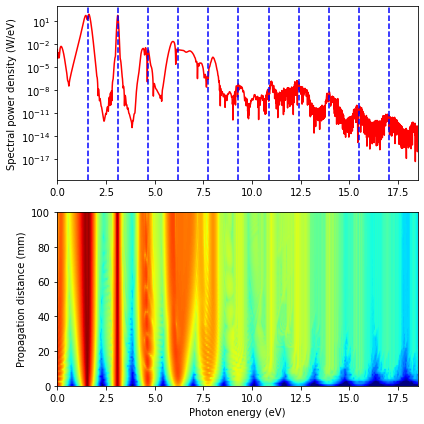

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.3203330704071 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996.1343851803005 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 997.6604641200095 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 998.164638388186 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 998.0477810762497 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997.1863173699726 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995.8438211992365 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.6061261666033 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 993.5153489241786 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 993.5740615961192 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.2686754461286 nJ
Step: 11 Dist

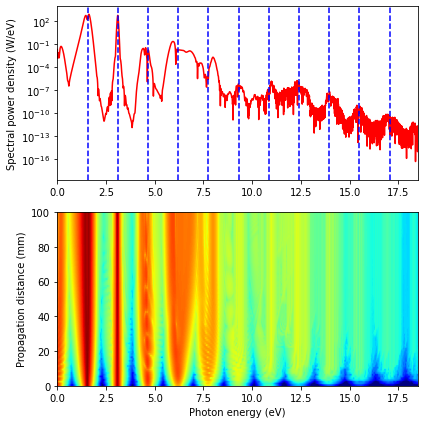

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9953.203330704064 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9961.343851803 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9976.604641200094 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9981.646383881862 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9980.477810762495 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9971.863173699721 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9958.438211992365 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9946.061261666033 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9935.153489241784 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9935.740615961191 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9942.686754461285 nJ
Step: 11 Distance remaini

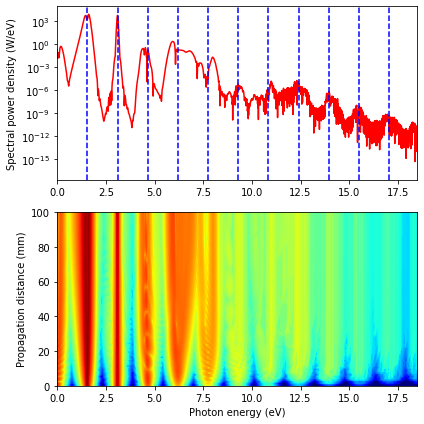

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99532.0333070407 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99613.43851803003 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99766.0464120009 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99816.46383881861 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99804.77810762497 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99718.63173699721 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99584.38211992363 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99460.61261666032 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99351.53489241784 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99357.40615961188 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99426.86754461283 nJ
Step: 11 Dist

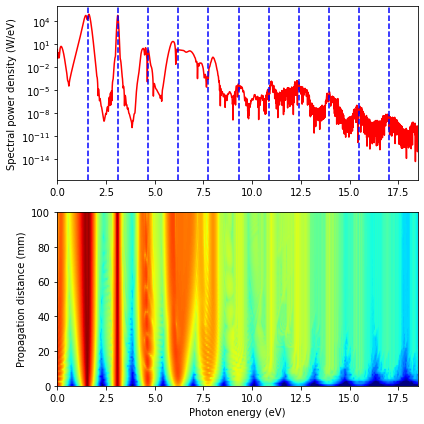

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995320.3330704063 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996134.3851803003 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 997660.464120009 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 998164.6383881855 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 998047.7810762492 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997186.3173699719 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995843.8211992366 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994606.1261666033 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 993515.3489241785 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 993574.0615961192 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994268.6754461282 nJ
Step: 11 Distance rema

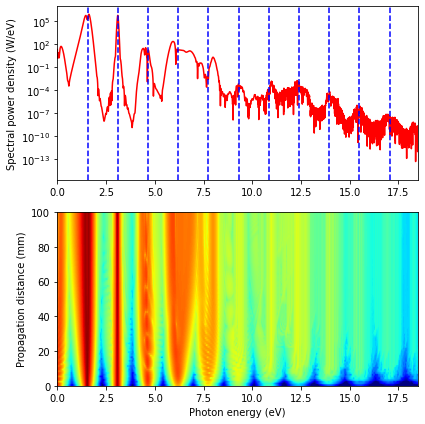

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9954535137352352 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9967970461081878 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9980597326052173 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9981146645988377 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.997165938335279 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9955709105320308 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9940383142081235 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9934497707353209 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9941273576727102 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.995550910105869 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.996672358754697 nJ
Step: 11 Distance r

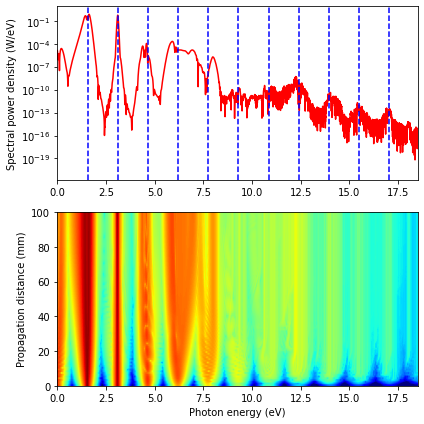

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.954535137352352 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.96797046108188 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.98059732605217 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.981146645988375 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.97165938335279 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.955709105320304 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.940383142081233 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.934497707353204 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.941273576727097 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.955509101058682 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.966723587546964 nJ
Step: 11 Dista

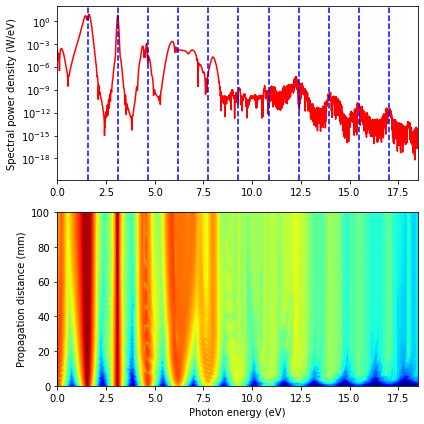

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.54535137352354 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.67970461081879 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.80597326052171 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.81146645988379 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.71659383352794 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.55709105320307 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.40383142081238 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.34497707353208 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.41273576727106 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.55509101058692 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.66723587546973 nJ
Step: 11 Dist

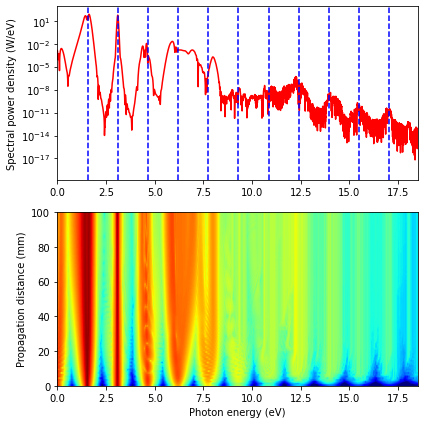

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.4535137352349 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996.7970461081877 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998.0597326052167 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 998.1146645988373 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997.165938335279 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995.5709105320304 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.0383142081234 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 993.4497707353207 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.1273576727101 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995.5509101058688 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996.672358754697 nJ
Step: 11 Dista

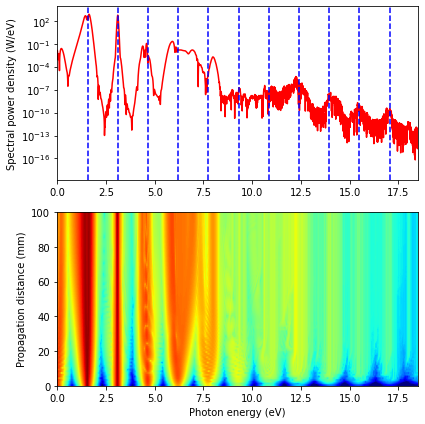

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9954.535137352357 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9967.970461081883 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9980.597326052173 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9981.146645988378 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9971.659383352795 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9955.709105320308 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9940.383142081238 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9934.497707353208 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9941.273576727106 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9955.509101058693 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9966.723587546974 nJ
Step: 11 Distance rema

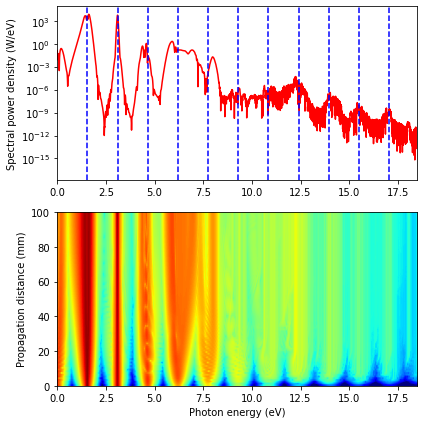

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99545.35137352353 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99679.70461081884 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99805.97326052173 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99811.46645988377 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99716.59383352795 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99557.0910532031 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99403.83142081244 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99344.97707353209 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99412.73576727104 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99555.09101058694 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99667.23587546975 nJ
Step: 11 Dis

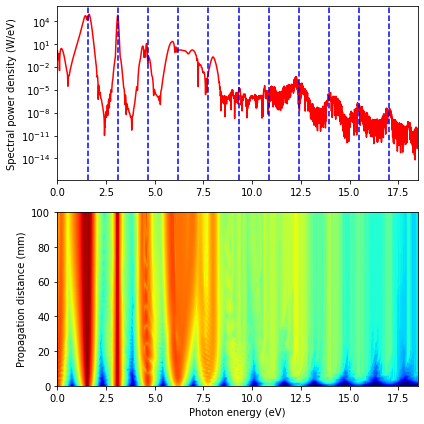

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995453.5137352352 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996797.046108188 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998059.7326052171 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 998114.6645988378 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997165.9383352797 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995570.910532031 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994038.3142081242 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 993449.770735321 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994127.3576727107 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995550.9101058694 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996672.3587546975 nJ
Step: 11 Distance remain

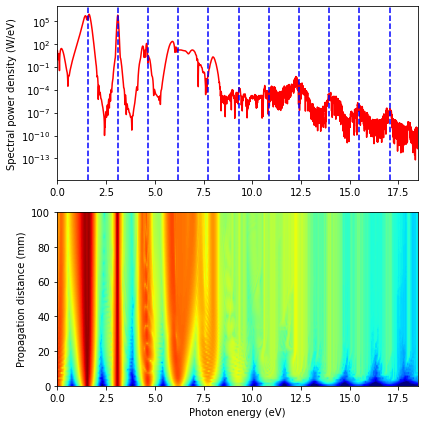

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9955670258554377 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9974301526264331 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9981869067838225 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9976163209912271 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9957980996665629 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9940121860381661 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9935214892905918 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9945955309222296 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9962519042075011 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9970103108892607 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9967134110541559 nJ
Step: 11 Distanc

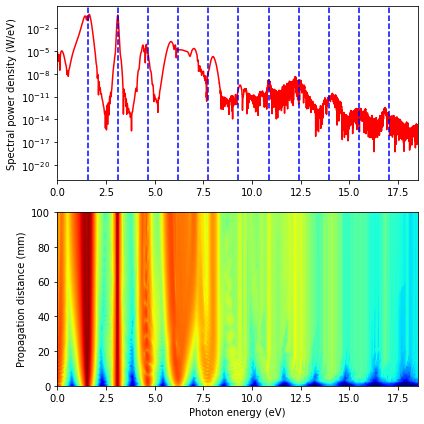

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.95567025855437 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.974301526264322 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.981869067838216 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.976163209912267 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.957980996665626 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.940121860381659 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.935214892905913 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.945955309222292 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.962519042075003 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.970103108892603 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.967134110541558 nJ
Step: 11 Dis

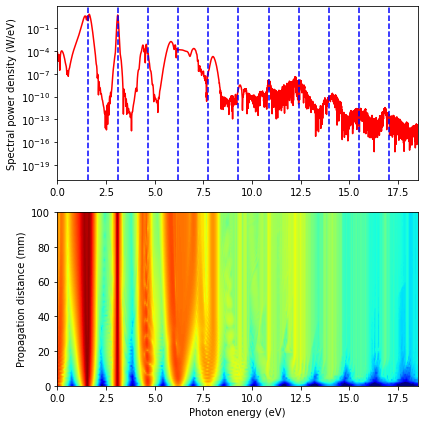

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.55670258554373 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.74301526264325 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.81869067838221 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.76163209912268 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.57980996665627 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.4012186038166 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.35214892905915 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.459553092223 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.62519042075013 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.70103108892607 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.67134110541565 nJ
Step: 11 Distanc

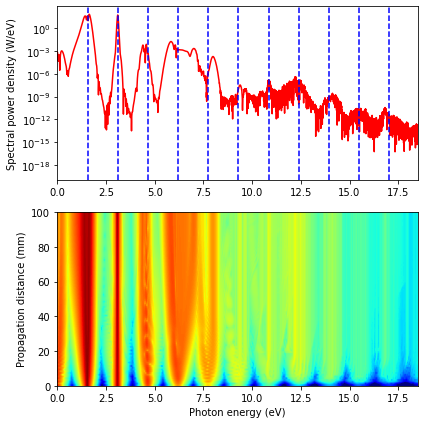

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.567025855437 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997.4301526264322 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998.1869067838215 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997.6163209912264 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995.7980996665625 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994.012186038166 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993.5214892905914 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.5955309222294 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996.2519042075007 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997.0103108892606 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996.713411054156 nJ
Step: 11 Distan

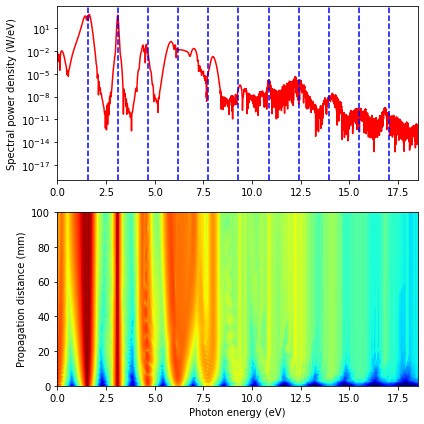

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9955.670258554375 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9974.301526264333 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9981.869067838226 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9976.163209912274 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9957.98099666563 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9940.121860381665 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9935.214892905922 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9945.955309222305 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9962.519042075013 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9970.103108892608 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9967.134110541565 nJ
Step: 11 Distance remai

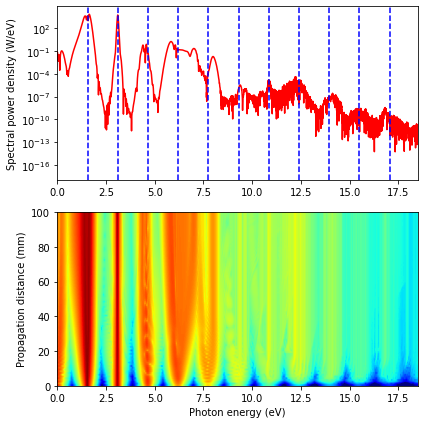

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99556.70258554375 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99743.01526264327 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99818.69067838223 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99761.63209912267 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99579.80996665629 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99401.21860381663 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99352.1489290592 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99459.55309222301 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99625.19042075009 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99701.03108892609 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99671.34110541562 nJ
Step: 11 Dis

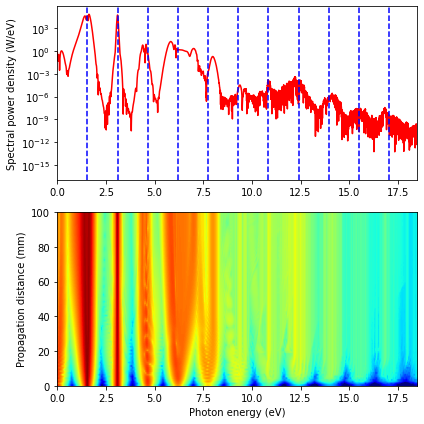

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995567.0258554377 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997430.1526264328 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998186.9067838221 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 997616.320991227 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 995798.099666563 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 994012.1860381663 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993521.4892905913 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994595.5309222296 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996251.9042075009 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997010.3108892605 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 996713.4110541564 nJ
Step: 11 Distance remai

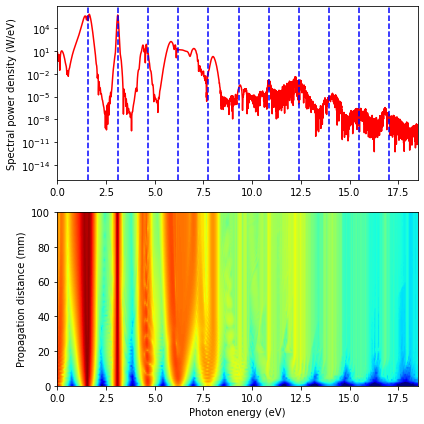

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9957007955699598 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9978447196385044 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9981117390008424 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.99658942063612 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9945194067893529 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9934628422100192 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9946306006840121 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9964565330907134 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9970254121339265 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9962629577232701 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9946768869728648 nJ
Step: 11 Distance 

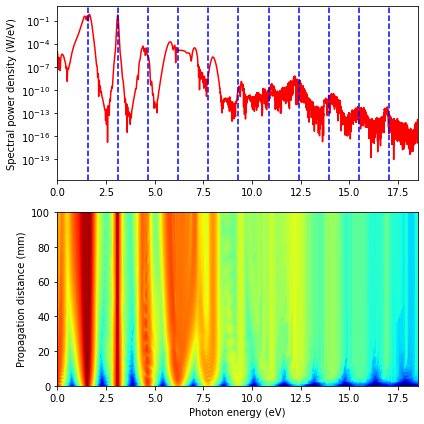

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.957007955699597 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.978447196385044 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.98111739000842 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.965894206361199 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.945194067893528 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.934628422100193 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.946306006840118 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.964565330907131 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.970254121339263 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.9626295772327 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.946768869728645 nJ
Step: 11 Dista

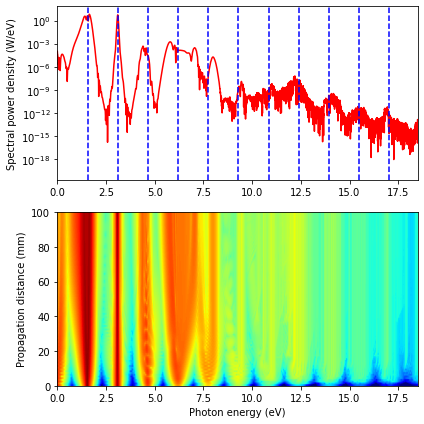

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.57007955699595 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.78447196385041 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.81117390008421 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.65894206361197 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.45194067893524 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.34628422100191 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.46306006840115 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.64565330907129 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.70254121339262 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.62629577232698 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.46768869728643 nJ
Step: 11 Dist

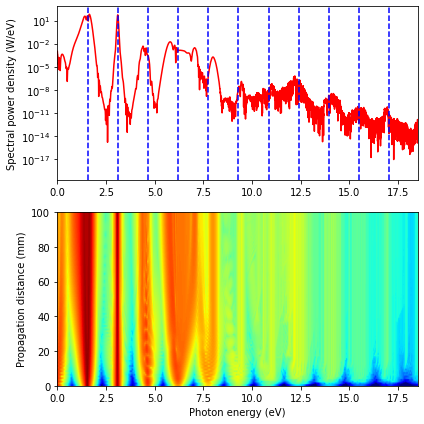

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.7007955699596 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997.8447196385046 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998.1117390008421 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996.5894206361197 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.5194067893526 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993.4628422100191 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.6306006840115 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 996.4565330907129 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997.0254121339265 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996.2629577232699 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.6768869728645 nJ
Step: 11 Dis

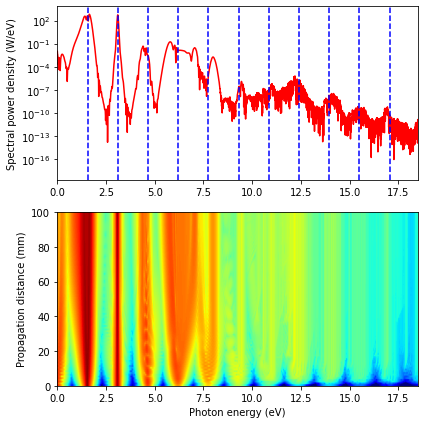

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9957.007955699599 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9978.447196385045 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9981.117390008429 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9965.894206361203 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9945.194067893532 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9934.6284221002 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9946.306006840123 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9964.56533090714 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9970.254121339269 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9962.629577232705 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9946.768869728654 nJ
Step: 11 Distance remaini

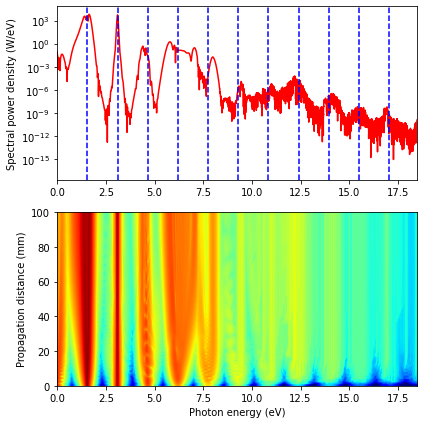

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99570.07955699597 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99784.47196385045 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99811.17390008424 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99658.94206361202 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99451.94067893528 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99346.28422100194 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99463.06006840119 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99645.65330907133 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99702.54121339267 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99626.29577232701 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99467.6886972865 nJ
Step: 11 Dis

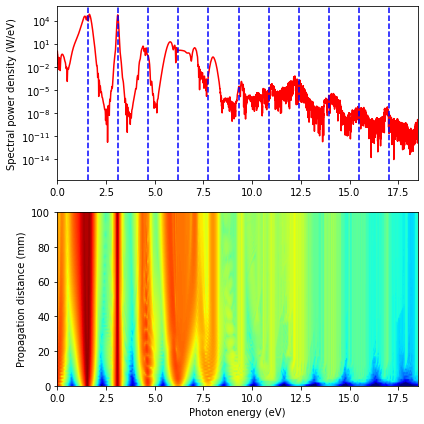

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995700.7955699599 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997844.7196385047 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998111.7390008426 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996589.4206361201 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994519.406789353 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993462.8422100199 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994630.6006840123 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 996456.5330907137 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 997025.4121339268 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996262.9577232704 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994676.8869728651 nJ
Step: 11 Distance rema

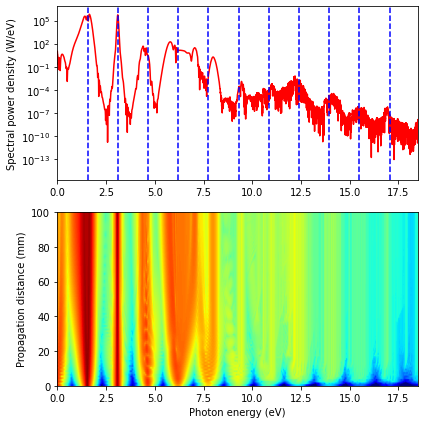

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9948029813678338 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9953916440134338 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9956893680117572 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9961704345036497 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9969984196267219 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9977074173582605 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9980425298170681 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9981230878806863 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9980471555601089 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9978627648521825 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.997550008594628 nJ
Step: 11 Distance

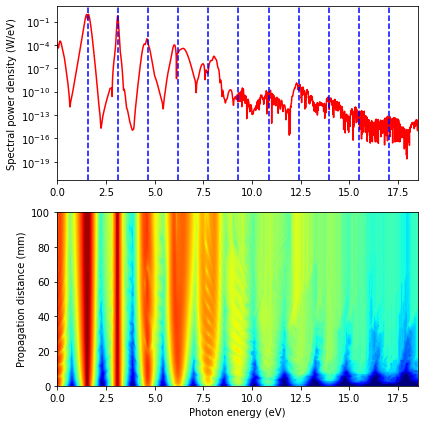

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.94802981367834 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.953916440134337 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.95689368011757 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.961704345036498 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.969984196267228 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.977074173582608 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.980425298170685 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.981230878806869 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.980471555601095 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.97862764852183 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.975500085946287 nJ
Step: 11 Dista

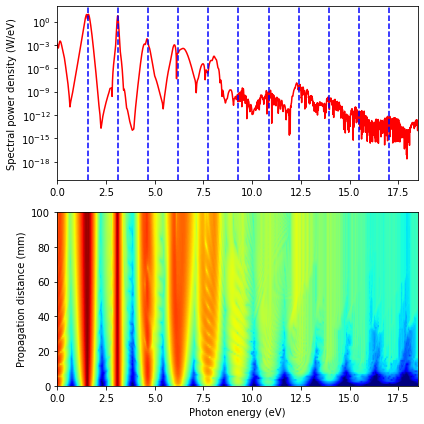

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.48029813678339 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.53916440134336 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.56893680117574 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.61704345036496 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.69984196267224 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.77074173582605 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.80425298170681 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.81230878806863 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.80471555601092 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.78627648521825 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.75500085946283 nJ
Step: 11 Dist

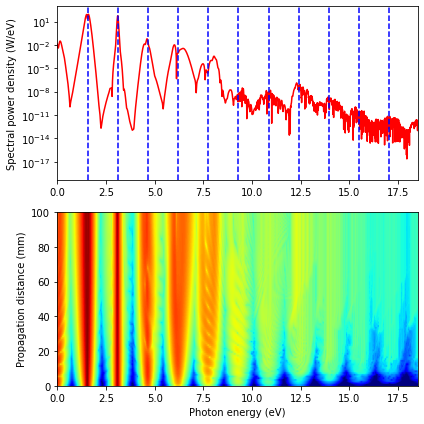

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 994.8029813678339 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.3916440134337 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995.6893680117571 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996.1704345036492 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996.998419626722 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997.7074173582603 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998.0425298170677 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998.1230878806861 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998.0471555601086 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997.8627648521823 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 997.5500085946278 nJ
Step: 11 Dist

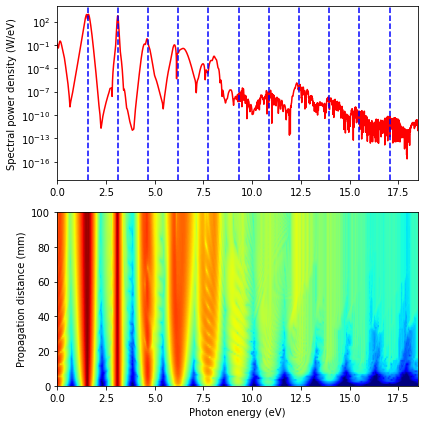

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9948.02981367834 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9953.916440134339 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9956.893680117571 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9961.704345036496 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9969.984196267224 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9977.074173582605 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9980.425298170678 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9981.230878806864 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9980.471555601089 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9978.627648521824 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9975.50008594628 nJ
Step: 11 Distance remain

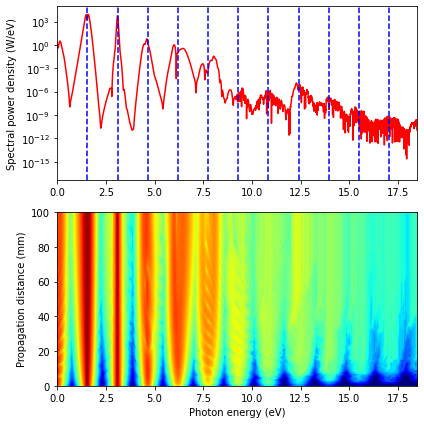

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99480.29813678337 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99539.16440134334 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99568.93680117565 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99617.04345036492 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99699.84196267216 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99770.74173582601 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99804.25298170676 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99812.30878806859 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99804.71555601084 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99786.2764852182 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99755.00085946274 nJ
Step: 11 Dis

<ipython-input-77-f5641790c1f4>:2: RuntimeWarning: divide by zero encountered in log10
  return 10 * np.log10(np.abs(num)**2)


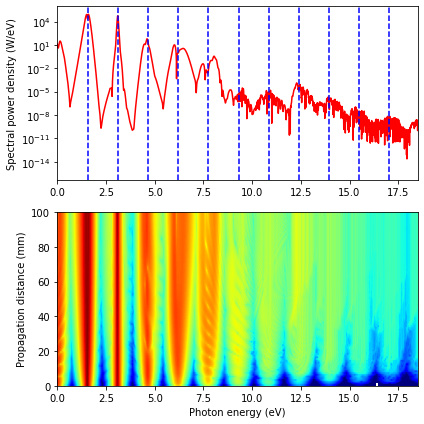

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 994802.9813678341 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995391.6440134337 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 995689.368011757 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996170.4345036495 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996998.4196267221 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 997707.4173582604 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 998042.529817068 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 998123.087880686 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 998047.1555601086 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 997862.764852182 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 997550.0085946276 nJ
Step: 11 Distance remaini

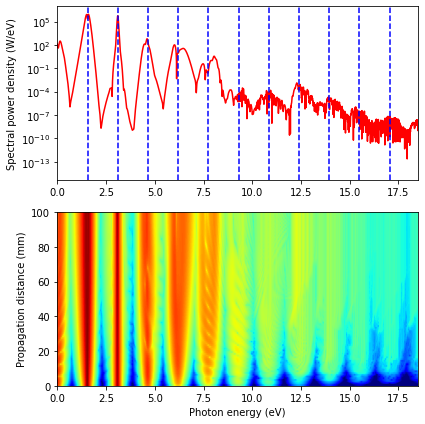

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9953937117791751 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9961850290470741 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9977314565367982 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9981223521073311 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9978304481180204 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9968931319053559 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9953802122142668 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9941565128145355 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9932197229859855 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9936228339005374 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9946027326861119 nJ
Step: 11 Distanc

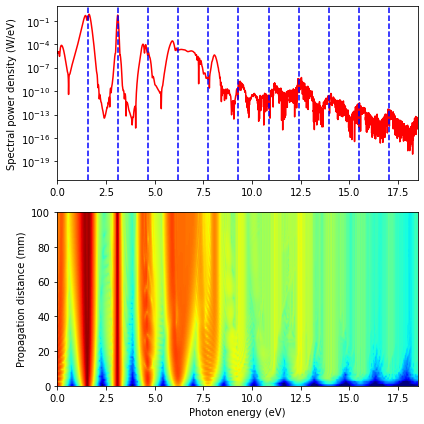

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.953937117791742 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.961850290470734 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.977314565367976 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.981223521073307 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.978304481180198 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.968931319053556 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.953802122142665 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.941565128145351 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.932197229859849 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.936228339005373 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.946027326861117 nJ
Step: 11 Di

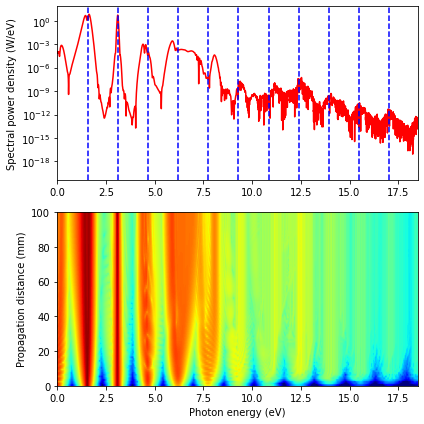

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.53937117791745 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.61850290470733 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.77314565367972 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.81223521073305 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.78304481180194 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.6893131905355 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.53802122142663 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.41565128145346 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.32197229859847 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.36228339005362 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.46027326861109 nJ
Step: 11 Dista

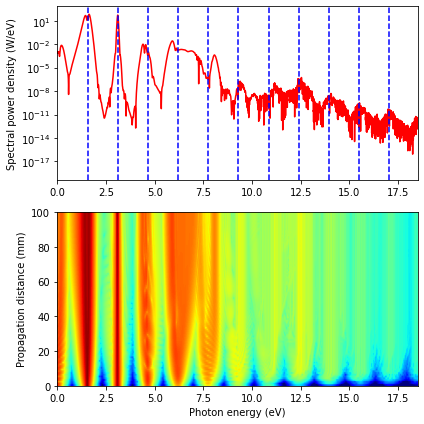

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.393711779175 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996.1850290470737 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 997.7314565367977 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 998.1223521073305 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997.8304481180196 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996.8931319053553 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995.3802122142662 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994.1565128145346 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 993.2197229859843 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 993.6228339005362 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.6027326861108 nJ
Step: 11 Dist

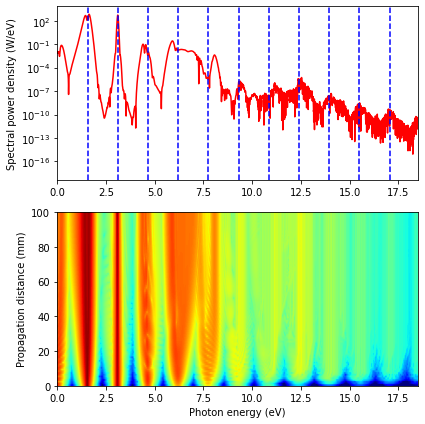

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9953.937117791747 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9961.850290470731 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9977.314565367979 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9981.223521073307 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9978.3044811802 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9968.931319053558 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9953.802122142666 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9941.565128145352 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9932.197229859847 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9936.228339005373 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9946.027326861114 nJ
Step: 11 Distance remain

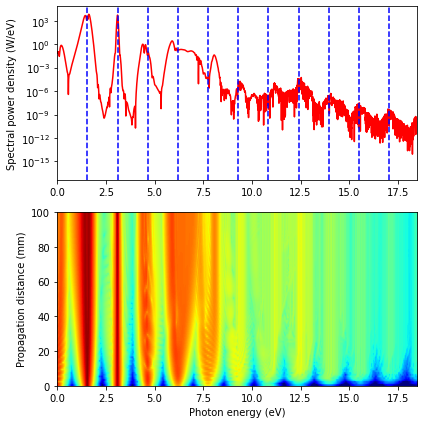

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99539.37117791746 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99618.5029047073 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99773.14565367976 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99812.23521073305 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99783.04481180197 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99689.31319053551 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99538.02122142664 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99415.65128145348 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99321.97229859848 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99362.28339005366 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99460.27326861113 nJ
Step: 11 Dis

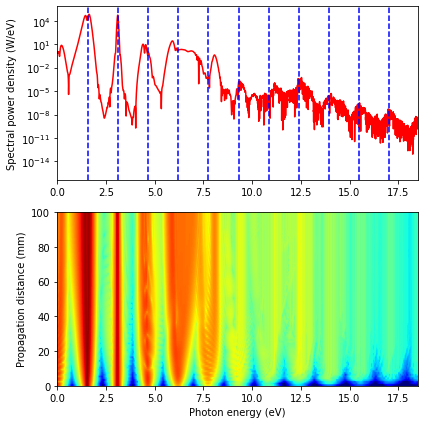

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995393.7117791746 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996185.0290470732 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 997731.4565367977 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 998122.3521073305 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 997830.4481180198 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996893.1319053551 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995380.2122142661 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 994156.5128145347 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 993219.7229859848 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 993622.8339005365 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994602.7326861112 nJ
Step: 11 Distance rem

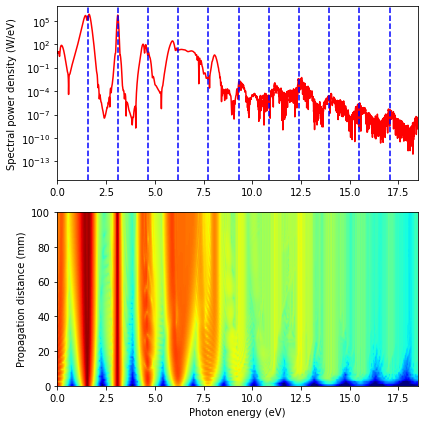

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9956940693370402 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9977391437920817 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9980274069635029 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9968488243178288 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9946890798208549 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9932020999996564 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9941763378381695 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9959631177311697 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9968297086842091 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9964114907096838 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9950099266765692 nJ
Step: 11 Distanc

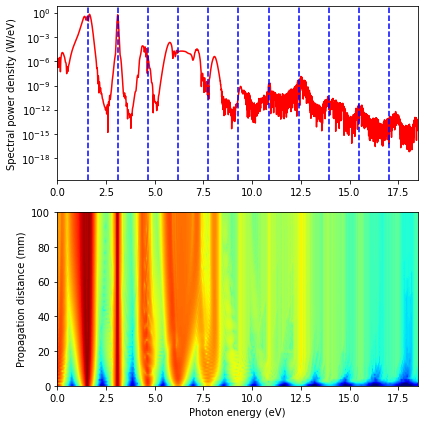

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.956940693370397 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.977391437920817 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.980274069635028 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.968488243178289 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.94689079820855 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.932020999996562 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.941763378381697 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.959631177311696 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.968297086842087 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.964114907096834 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.950099266765688 nJ
Step: 11 Dis

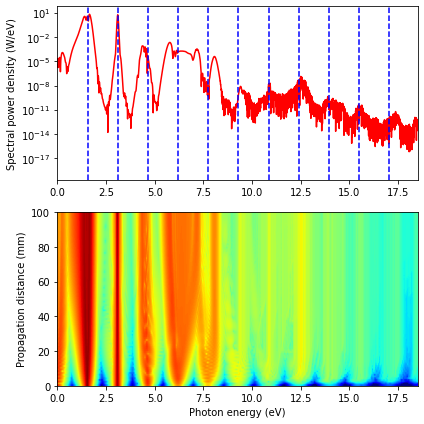

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.56940693370399 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.77391437920812 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.80274069635027 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.6848824317829 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.46890798208548 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.3202099999656 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.41763378381692 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.59631177311697 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.68297086842087 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.64114907096832 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.50099266765687 nJ
Step: 11 Distan

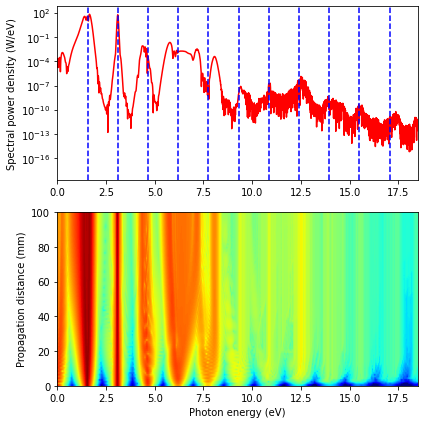

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 995.6940693370395 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997.7391437920812 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998.0274069635028 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996.8488243178288 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994.6890798208547 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993.202099999656 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994.1763378381692 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995.9631177311692 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996.8297086842083 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996.4114907096834 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 995.0099266765684 nJ
Step: 11 Dist

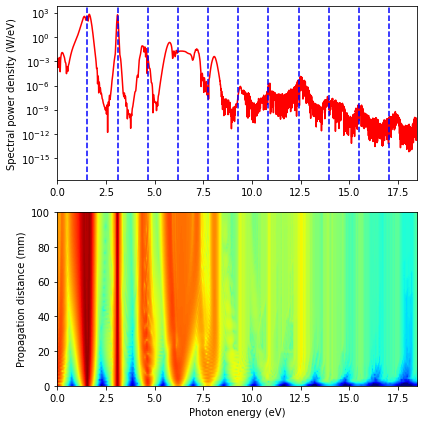

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9956.9406933704 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9977.391437920814 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9980.274069635032 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9968.488243178292 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9946.890798208547 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9932.020999996561 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9941.763378381693 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9959.6311773117 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9968.297086842089 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9964.114907096837 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9950.099266765686 nJ
Step: 11 Distance remainin

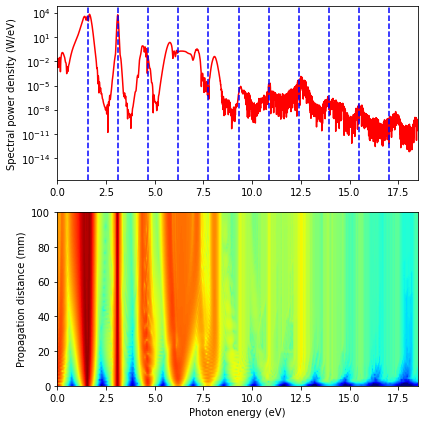

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99569.40693370397 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99773.91437920813 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99802.74069635027 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99684.8824317829 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99468.90798208547 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99320.2099999656 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99417.63378381693 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99596.31177311698 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99682.97086842086 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99641.14907096833 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99500.99266765689 nJ
Step: 11 Dist

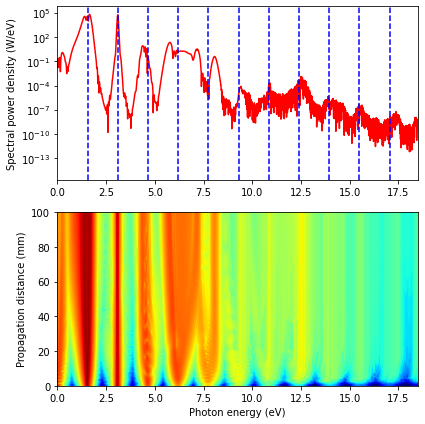

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 995694.0693370401 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997739.1437920814 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 998027.4069635029 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996848.8243178289 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 994689.0798208549 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993202.0999996562 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 994176.3378381698 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995963.1177311699 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 996829.708684209 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 996411.4907096839 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 995009.926676569 nJ
Step: 11 Distance remai

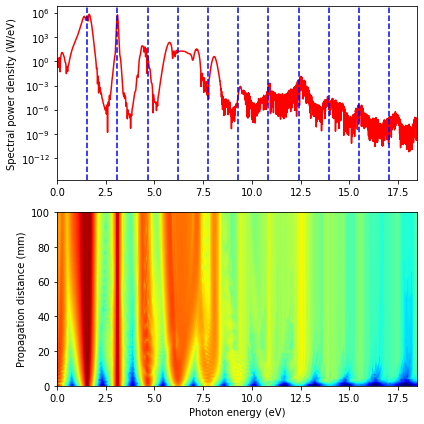

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9961922182280253 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9981219450026887 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9968265203811588 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9940557419321137 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9937391938080647 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.996031876046239 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9967921856433353 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9954470833799982 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9932022443104921 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.992844896613958 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9944866325720692 nJ
Step: 11 Distance 

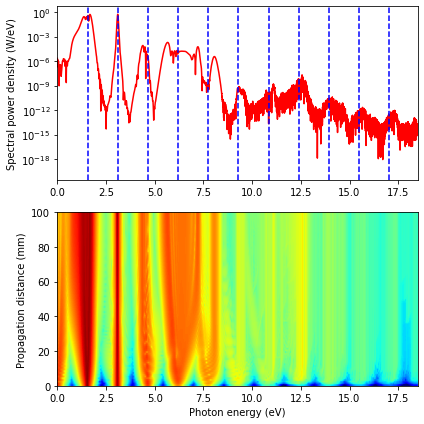

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.961922182280253 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.981219450026886 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.968265203811585 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.940557419321136 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.937391938080653 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.96031876046239 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.967921856433351 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.954470833799984 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.932022443104923 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.92844896613959 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.944866325720692 nJ
Step: 11 Dist

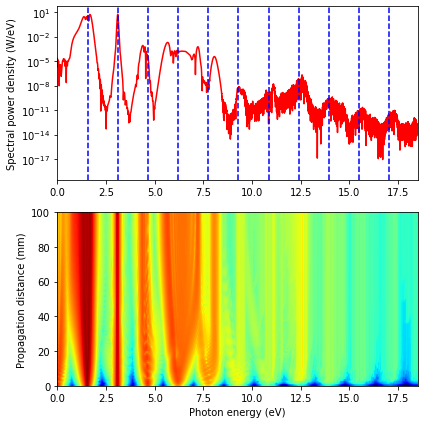

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.61922182280253 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.81219450026889 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.68265203811586 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.40557419321134 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.37391938080647 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.60318760462388 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.6792185643335 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.54470833799988 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.32022443104921 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.28448966139584 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.44866325720692 nJ
Step: 11 Dista

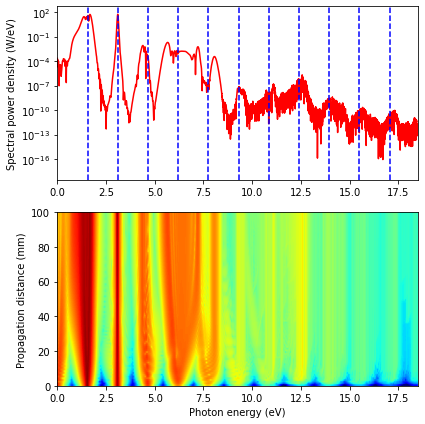

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 996.1922182280251 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 998.1219450026886 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996.8265203811583 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994.0557419321132 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 993.7391938080644 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996.0318760462386 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 996.7921856433352 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995.4470833799983 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 993.202244310492 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 992.8448966139581 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994.4866325720693 nJ
Step: 11 Dist

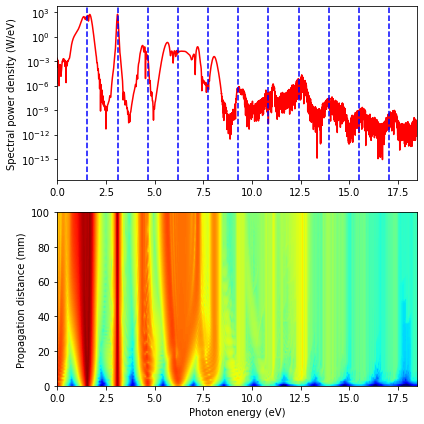

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9961.92218228025 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9981.219450026885 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9968.265203811585 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9940.55741932113 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9937.391938080647 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9960.318760462385 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9967.921856433346 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9954.47083379998 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9932.022443104917 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9928.448966139578 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9944.866325720684 nJ
Step: 11 Distance remaini

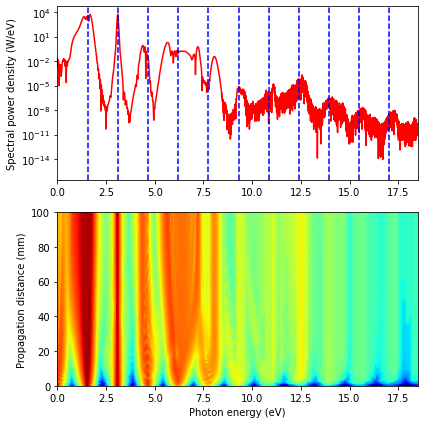

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99619.22182280254 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99812.19450026889 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99682.65203811586 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99405.57419321133 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99373.91938080647 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99603.18760462389 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99679.21856433351 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99544.70833799981 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99320.22443104917 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99284.48966139581 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99448.66325720692 nJ
Step: 11 Di

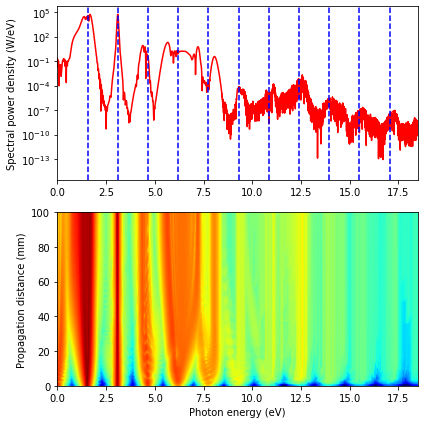

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 996192.218228025 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 998121.9450026886 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996826.520381158 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 994055.741932113 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 993739.193808064 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996031.876046238 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 996792.1856433345 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995447.0833799978 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 993202.2443104913 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 992844.8966139577 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 994486.6325720687 nJ
Step: 11 Distance remainin

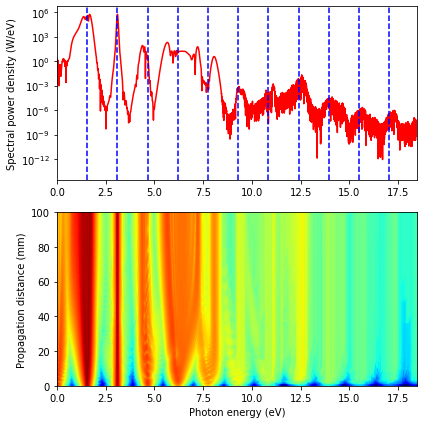

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.997041911825426 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.997810051367961 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9946434075818211 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9937640672210998 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9965041166375354 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9963051409830648 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9935990084208121 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9929023824056374 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9949978716721537 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9954221518514472 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9937295427484535 nJ
Step: 11 Distance 

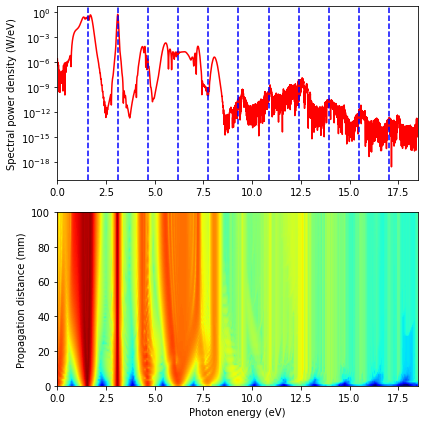

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.970419118254261 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.978100513679607 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.94643407581821 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.937640672210994 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.965041166375348 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.963051409830648 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.935990084208116 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.929023824056372 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.949978716721535 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.95422151851447 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.937295427484537 nJ
Step: 11 Dist

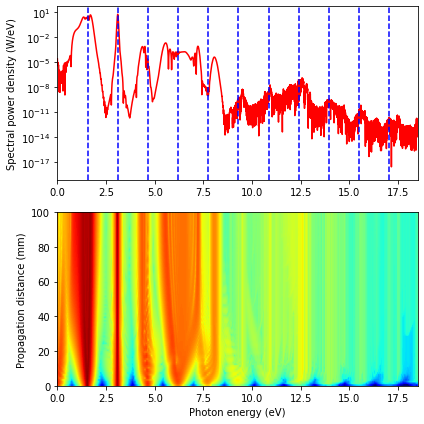

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.7041911825426 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.78100513679608 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.46434075818212 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.37640672210996 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.65041166375352 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.6305140983065 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.35990084208122 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.29023824056377 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.4997871672154 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.54221518514471 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.37295427484538 nJ
Step: 11 Distanc

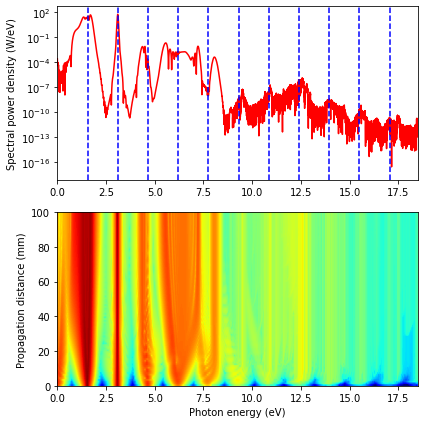

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 997.0419118254258 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997.810051367961 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.6434075818207 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 993.7640672210995 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996.504116637535 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996.3051409830647 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993.599008420812 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 992.9023824056376 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.9978716721539 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995.4221518514473 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993.7295427484539 nJ
Step: 11 Distan

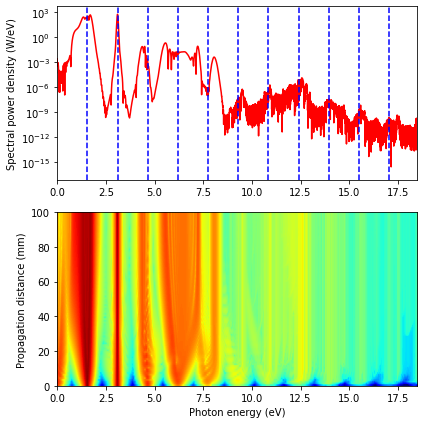

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9970.41911825426 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9978.10051367961 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9946.434075818212 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9937.640672210999 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9965.041166375355 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9963.051409830654 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9935.990084208126 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9929.02382405638 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9949.978716721544 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9954.221518514481 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9937.295427484545 nJ
Step: 11 Distance remaini

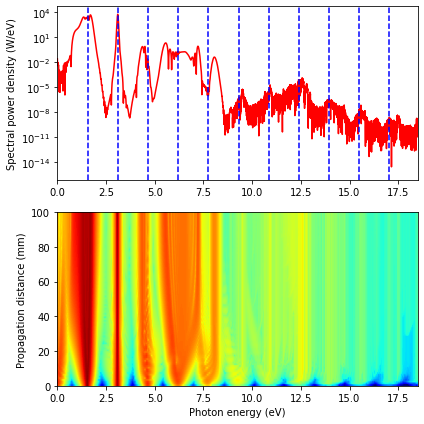

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99704.19118254258 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99781.00513679607 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99464.34075818211 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99376.40672210998 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99650.4116637535 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99630.51409830646 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99359.9008420812 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99290.23824056373 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99499.7871672154 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99542.21518514471 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99372.95427484534 nJ
Step: 11 Dista

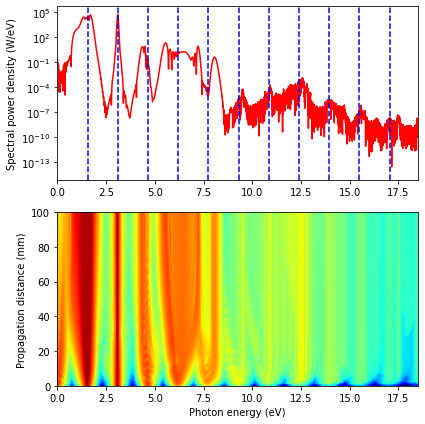

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 997041.9118254259 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 997810.0513679605 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994643.4075818209 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 993764.0672210996 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996504.1166375349 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 996305.1409830649 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993599.0084208122 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 992902.3824056379 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994997.871672154 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 995422.1518514474 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993729.5427484541 nJ
Step: 11 Distance rema

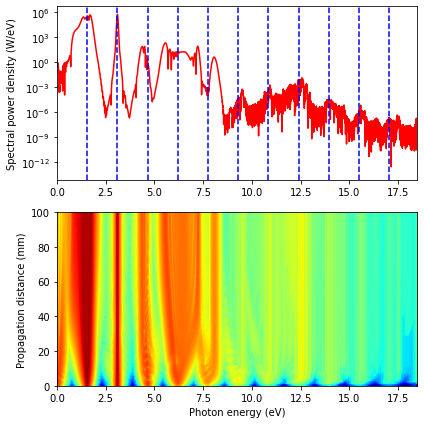

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9977472287393577 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.996805070696522 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9931916725070502 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9960977722964384 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9962782859664647 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9930838624026471 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9937493140555868 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.995586174699212 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9940448546547491 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9921864002196119 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.993384428110066 nJ
Step: 11 Distance r

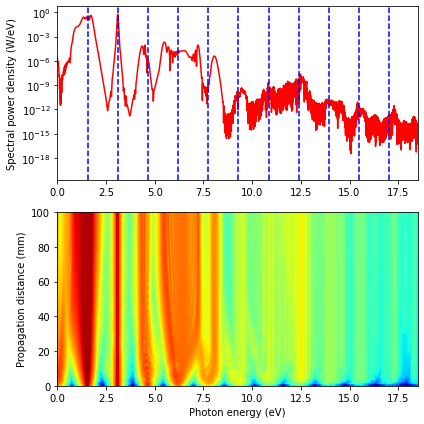

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.977472287393574 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.968050706965217 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.9319167250705 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.960977722964381 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.962782859664646 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.93083862402647 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.937493140555867 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.955861746992118 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.940448546547493 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.921864002196118 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.93384428110066 nJ
Step: 11 Distan

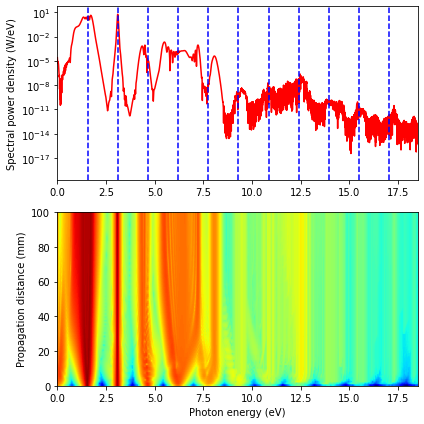

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.77472287393576 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.6805070696522 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.31916725070502 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.60977722964383 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.62782859664647 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.30838624026474 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.3749314055587 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.55861746992122 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.40448546547496 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.2186400219612 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.33844281100659 nJ
Step: 11 Distanc

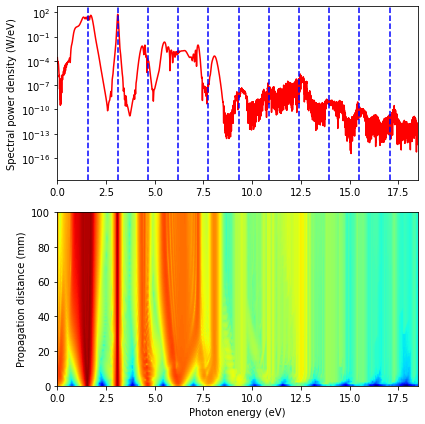

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 997.7472287393575 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996.8050706965216 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 993.1916725070502 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996.0977722964383 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996.2782859664648 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993.0838624026468 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993.7493140555872 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995.5861746992123 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.0448546547494 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 992.186400219612 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993.3844281100663 nJ
Step: 11 Dist

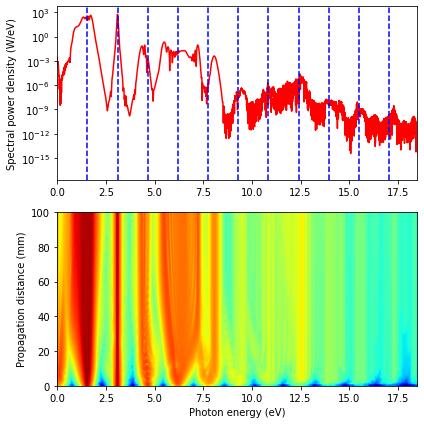

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9977.472287393583 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9968.050706965225 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9931.916725070501 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9960.97772296438 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9962.782859664649 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9930.838624026472 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9937.49314055587 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9955.861746992123 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9940.448546547494 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9921.864002196122 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9933.84428110066 nJ
Step: 11 Distance remaini

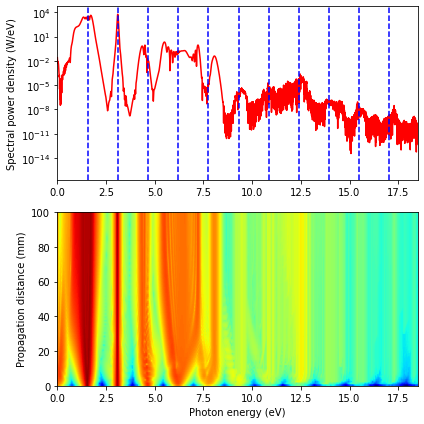

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99774.72287393577 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99680.50706965222 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99319.16725070505 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99609.77722964386 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99627.82859664653 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99308.38624026476 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99374.93140555873 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99558.61746992121 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99404.48546547495 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99218.64002196121 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99338.44281100661 nJ
Step: 11 Di

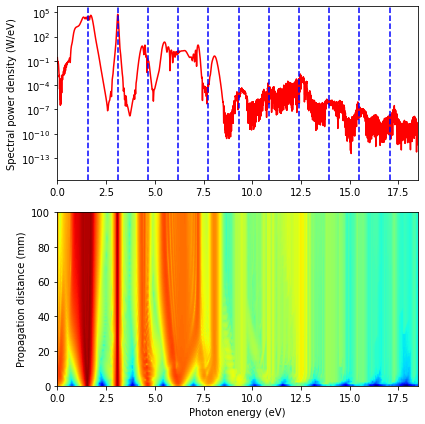

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 997747.2287393578 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 996805.0706965219 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 993191.6725070503 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996097.7722964382 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 996278.2859664644 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993083.8624026472 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993749.3140555873 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 995586.1746992123 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994044.8546547493 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 992186.4002196122 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993384.428110066 nJ
Step: 11 Distance rema

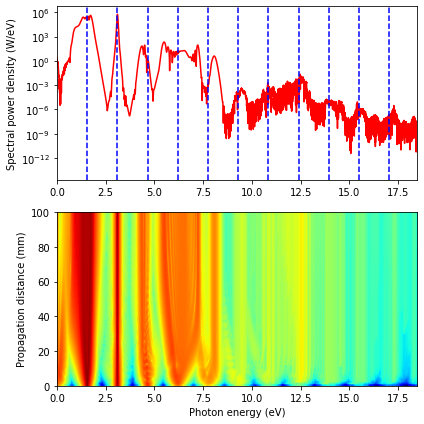

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9980613765736576 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9952549160502397 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9942913108974065 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.9967663410673083 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9935063392651764 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9938018789308775 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9955183403912126 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9931155856724257 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9925583340675568 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9943124707231572 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9930304151089013 nJ
Step: 11 Distanc

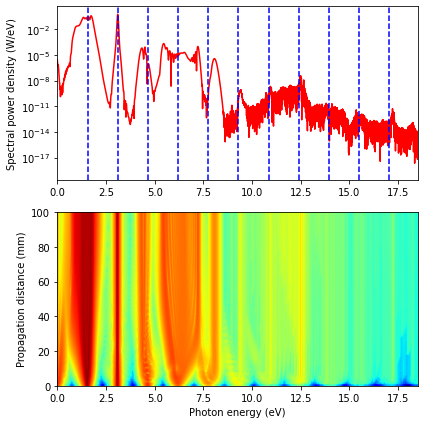

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.980613765736575 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.952549160502393 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.942913108974059 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.967663410673083 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.93506339265176 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.938018789308773 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.955183403912118 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.931155856724251 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.925583340675562 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.943124707231567 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.930304151089008 nJ
Step: 11 Dis

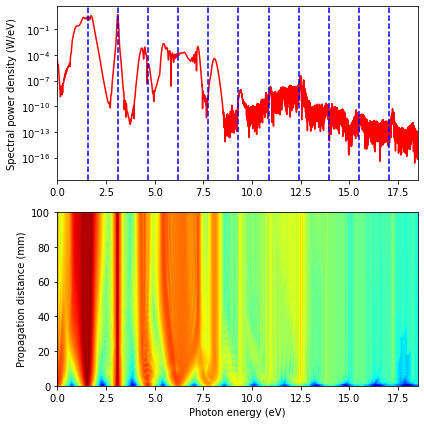

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.80613765736572 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.52549160502386 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.42913108974058 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.67663410673079 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.35063392651756 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.3801878930877 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.55183403912118 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.31155856724254 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.2558334067556 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.43124707231566 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.30304151089007 nJ
Step: 11 Distan

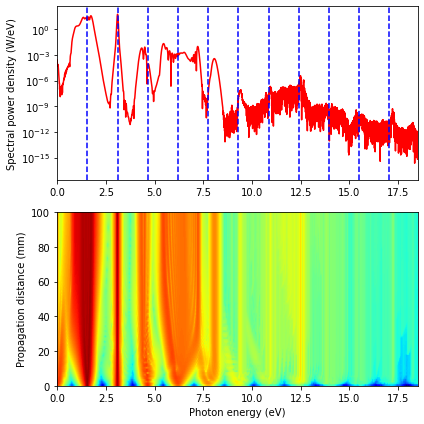

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 998.0613765736574 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995.254916050239 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994.2913108974062 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996.7663410673081 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 993.5063392651758 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993.8018789308773 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995.5183403912122 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 993.1155856724255 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 992.5583340675566 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994.312470723157 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993.0304151089011 nJ
Step: 11 Dista

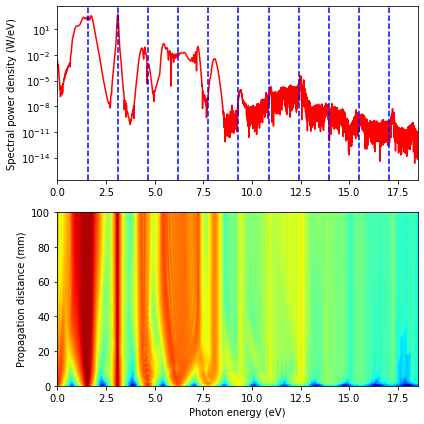

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9980.613765736576 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9952.549160502393 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9942.913108974064 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9967.663410673082 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9935.063392651762 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9938.018789308775 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9955.183403912124 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9931.155856724254 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9925.583340675565 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9943.124707231571 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9930.30415108901 nJ
Step: 11 Distance remai

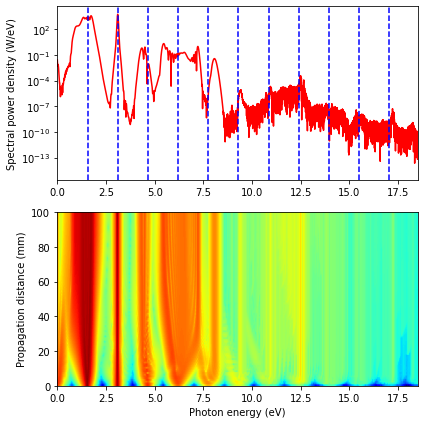

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99806.13765736573 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99525.49160502391 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99429.13108974062 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99676.63410673085 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99350.63392651759 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99380.18789308773 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99551.83403912123 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99311.55856724255 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99255.83340675566 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99431.2470723157 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99303.04151089015 nJ
Step: 11 Dis

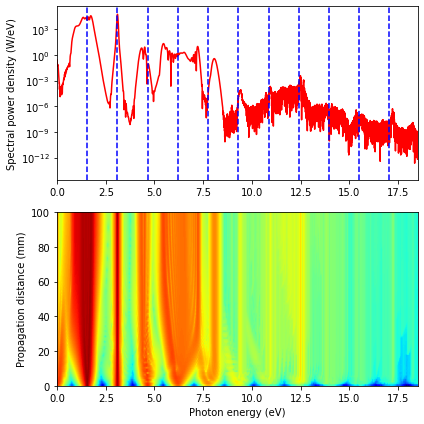

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 998061.3765736574 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 995254.9160502392 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 994291.3108974062 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 996766.3410673081 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 993506.3392651762 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 993801.8789308774 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 995518.3403912125 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 993115.585672426 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 992558.3340675572 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 994312.4707231577 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 993030.4151089014 nJ
Step: 11 Distance rema

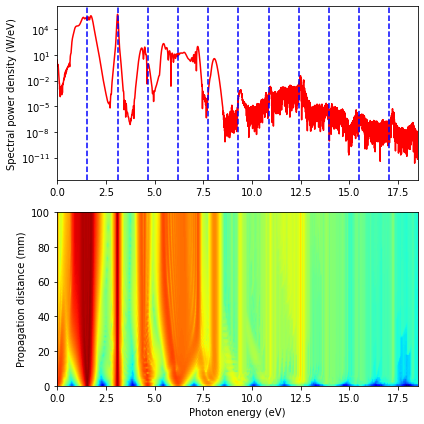

Pulse energy before Simple Fiber : 1.0 nJ
pulse energy in  79161.46598835778
copied as   79161.46598835778
Step: 0 Distance remaining: 0.1
Pulse energy after: 0.9981206213447363 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 0.9940031513340829 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 0.9961287271721092 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 0.995256708942493 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 0.9930017292072729 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 0.9955838402575911 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 0.9930568905232648 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 0.9928989187681229 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 0.9942342551067783 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 0.9920830515595099 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 0.9923045494533111 nJ
Step: 11 Distance

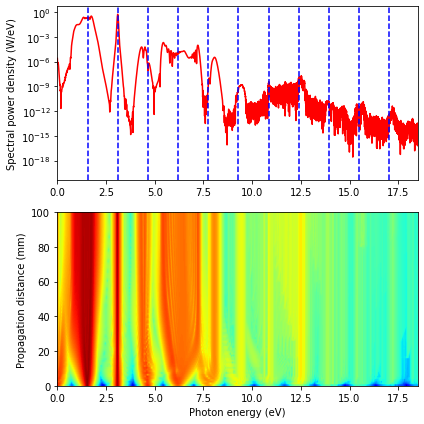

Pulse energy before Simple Fiber : 9.999999999999998 nJ
pulse energy in  250330.53544116276
copied as   250330.53544116276
Step: 0 Distance remaining: 0.1
Pulse energy after: 9.981206213447356 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9.940031513340822 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9.961287271721082 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9.952567089424923 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9.930017292072723 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9.955838402575898 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9.930568905232638 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9.928989187681216 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9.942342551067773 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9.920830515595089 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9.923045494533099 nJ
Step: 11 Di

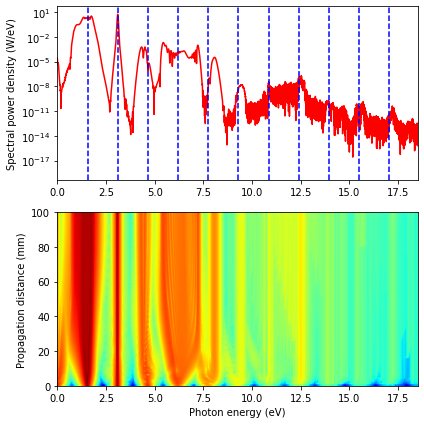

Pulse energy before Simple Fiber : 99.99999999999999 nJ
pulse energy in  791614.6598835776
copied as   791614.6598835776
Step: 0 Distance remaining: 0.1
Pulse energy after: 99.81206213447362 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99.4003151334083 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99.61287271721092 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99.52567089424926 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99.30017292072726 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99.55838402575901 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99.30568905232649 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99.28989187681225 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99.42342551067776 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99.20830515595092 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99.23045494533105 nJ
Step: 11 Dista

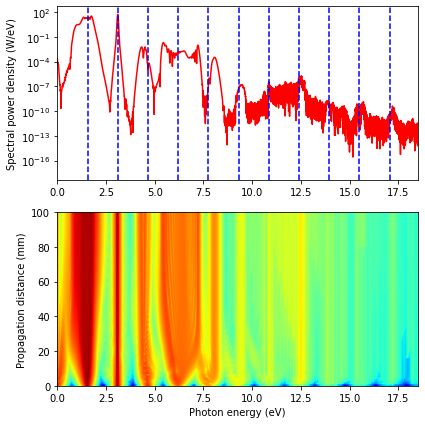

Pulse energy before Simple Fiber : 1000.0000000000001 nJ
pulse energy in  2503305.354411627
copied as   2503305.354411627
Step: 0 Distance remaining: 0.1
Pulse energy after: 998.1206213447363 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994.0031513340828 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996.128727172109 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995.2567089424929 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 993.0017292072729 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995.5838402575904 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993.056890523265 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 992.8989187681227 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994.2342551067778 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 992.0830515595094 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 992.3045494533105 nJ
Step: 11 Dista

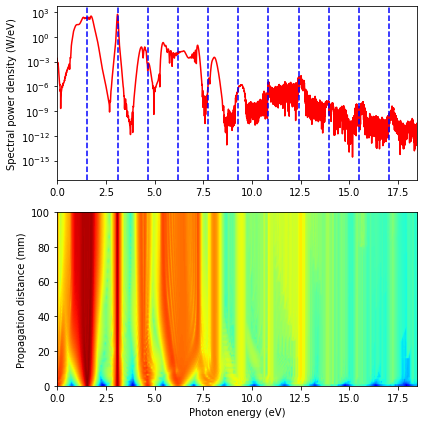

Pulse energy before Simple Fiber : 10000.0 nJ
pulse energy in  7916146.598835776
copied as   7916146.5988357775
Step: 0 Distance remaining: 0.1
Pulse energy after: 9981.206213447362 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 9940.031513340833 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 9961.287271721092 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 9952.56708942493 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 9930.017292072733 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 9955.838402575911 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 9930.56890523265 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 9928.98918768123 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 9942.342551067784 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 9920.830515595102 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 9923.04549453311 nJ
Step: 11 Distance remainin

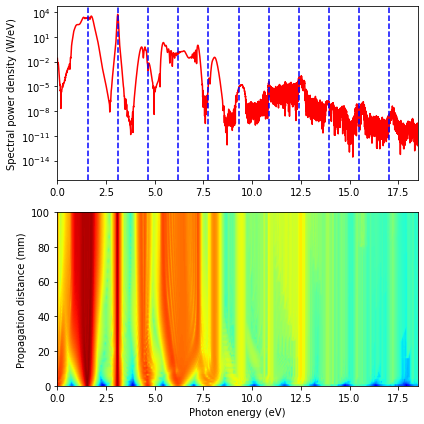

Pulse energy before Simple Fiber : 100000.00000000001 nJ
pulse energy in  25033053.54411627
copied as   25033053.544116277
Step: 0 Distance remaining: 0.1
Pulse energy after: 99812.06213447361 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 99400.3151334083 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 99612.8727172109 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 99525.67089424924 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 99300.17292072724 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 99558.38402575898 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 99305.68905232643 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 99289.8918768122 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 99423.42551067774 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 99208.3051559509 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 99230.45494533103 nJ
Step: 11 Distan

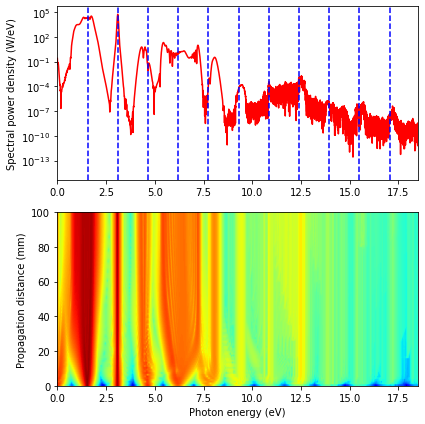

Pulse energy before Simple Fiber : 1000000.0 nJ
pulse energy in  79161465.98835777
copied as   79161465.98835777
Step: 0 Distance remaining: 0.1
Pulse energy after: 998120.6213447362 nJ
Step: 1 Distance remaining: 0.099
Pulse energy after: 994003.151334083 nJ
Step: 2 Distance remaining: 0.098
Pulse energy after: 996128.727172109 nJ
Step: 3 Distance remaining: 0.097
Pulse energy after: 995256.7089424927 nJ
Step: 4 Distance remaining: 0.096
Pulse energy after: 993001.7292072723 nJ
Step: 5 Distance remaining: 0.095
Pulse energy after: 995583.8402575896 nJ
Step: 6 Distance remaining: 0.094
Pulse energy after: 993056.8905232641 nJ
Step: 7 Distance remaining: 0.093
Pulse energy after: 992898.918768122 nJ
Step: 8 Distance remaining: 0.09200000000000001
Pulse energy after: 994234.2551067772 nJ
Step: 9 Distance remaining: 0.09100000000000001
Pulse energy after: 992083.051559509 nJ
Step: 10 Distance remaining: 0.09000000000000001
Pulse energy after: 992304.5494533102 nJ
Step: 11 Distance remaini

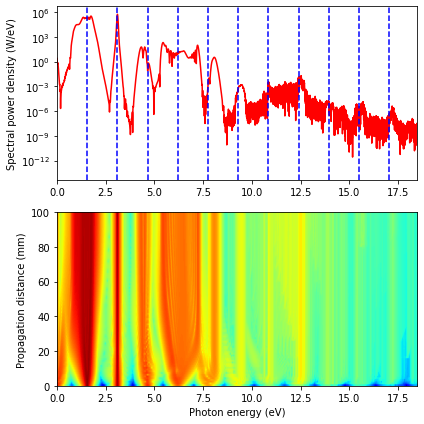

In [78]:
for gas in gases:
    n2_at_one_bar, betas_at_one_bar = loadGasParameters(gas)

    for pressure in range(len(pressure_at_entrance)):
        
        for combination in range(len(EPP_input)):
            
            gasbuilder = GasPropertyBuilder(fiber_length=Length*1e-3, fiber_radius=fiber_rad[combination], fiber_wavelength=fibWL, pulse_wavelength=pulseWL, betas_at_one_bar=betas_at_one_bar, constant_pressure=None, 
                                            pressure_boundary=[pressure_at_entrance[pressure],0], n2_at_one_bar=n2_at_one_bar, differential_pumping=True)

            # create the fiber
            fiber = pynlo.media.fibers.fiber.FiberInstance()
            fiber.generate_fiber(Length * 1e-3, center_wl_nm=fibWL, betas=gasbuilder.dispersionFunction(0),
                                          gamma_W_m=gasbuilder.gammaDistribution(0), gain=-alpha)

            # provide a function for gamma (the effective nonlinearity, in units of 1/(W m)) that varies
            # as a function of the length along the fiber
            fiber.set_gamma_function(gasbuilder.gammaDistribution)

            # provide a function for the fiber dispersion that varies as a function of the length along
            # the fiber, GVD in units of ps^n/m, NOT ps^n/km
            fiber.set_dispersion_function(gasbuilder.dispersionFunction, dispersion_format='GVD')


            # create the fundamental pulse
            pulse_FD = pynlo.light.DerivedPulses.SechPulse(
                1, FWHM/1.76, pulseWL, time_window_ps=Window,
                GDD=GDD, TOD=TOD, NPTS=Points, frep_MHz=1e-3, power_is_avg=False
            )
            pulse_FD = pulse_FD.interpolate_to_new_center_wl(pulseWL/3)
            pulse_FD.set_epp(EPP_FD[combination])

            # create the second harmonic pulse
            pulse_SH = pynlo.light.DerivedPulses.SechPulse(
                1, FWHM/1.76, pulseWL/2, time_window_ps=Window,
                GDD=GDD, TOD=TOD, NPTS=Points, frep_MHz=1e-3, power_is_avg=False
            )
            pulse_SH = pulse_SH.interpolate_to_new_center_wl(pulseWL/3)

            pulse_SH.set_epp(EPP_SH[combination])

            # create the combined pulse
            pulse = pynlo.light.PulseBase.Pulse()
            pulse.set_NPTS(Points)
            pulse.set_time_window_ps(Window)
            pulse.set_center_wavelength_nm(fibWL)
            pulse.set_AW(pulse_FD.AW + pulse_SH.AW)

            # propagation
            evol = pynlo.interactions.FourWaveMixing.SSFM.SSFM(local_error=0.001, USE_SIMPLE_RAMAN=True,
                             disable_Raman=np.logical_not(Raman),
                             disable_self_steepening=np.logical_not(Steep))

            y, AW, AT, pulse_out = evol.propagate(pulse_in=pulse, fiber=fiber, n_steps=Steps, reload_fiber_each_step=True)

            print("The following plots are for:")
            print(f"\tGas: {gas.lower()}")

            print(f"\tFiber radius: {fiber_rad[combination]*1e6:.9f} microns")
            print(f"\tInput pulse energy: {EPP_input[combination]*1e3:.9f} mJ")
            print(f"\tEntrance gas pressure is: {pressure_at_entrance[pressure]} Torr")

            F = (pulse_FD.W_mks / (2*np.pi)) * 1e-12 # convert to THz
            W_eV = photonEnergyGrid(pulse_FD)

            zW = dB(np.transpose(AW)[:, (F > 0)])
            zT = dB(np.transpose(AT))

            intensity = np.abs(np.transpose(AW)[:, (F > 0)])**2

            # Set up plots for the results
            fig = plt.figure(figsize=(6,6))
            ax0 = plt.subplot2grid((2,1), (0, 0), rowspan=1)
            ax1 = plt.subplot2grid((2,1), (1, 0), rowspan=1, sharex=ax0)

            ax0.set_yscale('log')
            ax0.plot(W_eV[W_eV > 0], intensity[-1], color='r')

            extent = (np.min(W_eV[W_eV > 0]), np.max(W_eV[W_eV > 0]), 0, Length)
            ax1.imshow(zW, extent=extent, vmin=np.max(zW) - 250.0,
                       vmax=np.max(zW), aspect='auto', origin='lower', cmap='jet')

            ax1.set_xlabel('Photon energy (eV)')
            ax0.set_ylabel('Spectral power density (W/eV)')
            ax1.set_ylabel('Propagation distance (mm)')

#             ax0.set_ylim(1e-15, 1e3)
            ax0.set_xlim(0, 18.5)

            HHGs = [1.55 * (i + 1) for i in range(11)]
            for HHG in HHGs:
                ax0.axvline(x=HHG, color='b', linestyle='--')

            plt.tight_layout()
            plt.show()